# **Assignment 4: Combining Data Cleaning, Feature Selection, Modeling and Interpretability**

#### **Name: Shriya Pandita**
#### **NUID: 002747729**

## **Background**
In this notebook I am trying to analyse world's top universities. I am exploring the QS World University Rankings® 2023 based on 8 key ranking indicators.
This year’s QS World University Rankings include almost 1,500 institutions from around the world.


## **Aim**
- Create Dataset and perform Data Cleaning and Feature Selection
- Create AutoML library like H2O.ai to create predictive models and interpret them
- Interpret the results of : Linear Model, Tree Based Model, Best model of AutoML H2O
- Using different Model Interpretibility Methods : SHAP analysis, LIME analysis, Partial Dependence Plot Analysis

## **Variable Description**

**Target Variables/Dependent Variables**

**Rank** - What is helping find the ranks of the university. This is the variable we have to predict.



**Predictor Variables/Independent Variables**

**ar score** - Academic Reputation score

**er score** - Employer Reputation score

**fsr score** - Faculty Student score

**cpf score**- Citations per faculty score

**ifr score** - International Faculty score

**isr score** - International Students score

**irn score** - International Research Network score

**ger score** - Employment Outcome score



In [ ]:
#loading the required libraries
#!pip install Jinja2 2.11.3
!pip install eli5
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#loading the dataset
df = pd.read_csv('https://raw.githubusercontent.com/shriyapandita06/shriyapandita06/main/2023%20QS%20World%20University%20Rankings%20(1).csv')


In [ ]:
df1=df

In [ ]:
#checking for the null values in all columns
df.isnull().sum()


Rank              0
institution       0
location code     0
location          0
ar score          0
ar rank           0
er score          1
er rank           0
fsr score         2
fsr rank          0
cpf score         5
cpf rank          0
ifr score        98
ifr rank         98
isr score        57
isr rank         57
irn score        13
irn rank         13
ger score        12
ger rank         12
score scaled      0
dtype: int64

In [ ]:
# dropping the rank columns as it isnt needed for analysis
df.drop(['ar rank', 'er rank', 'fsr rank', 'cpf rank','isr rank', 'irn rank','ger rank', 'ifr rank', 'score scaled'], axis=1,inplace= True)

In [ ]:
## dropping location code,institution, and location columns 
df.drop(['location code', 'institution', 'location'], axis=1,inplace= True)

**Q. What are the data types? (Only numeric and categorical)**

In [ ]:
#Types of data
df.dtypes

Rank           int64
ar score     float64
er score     float64
fsr score    float64
cpf score    float64
ifr score    float64
isr score    float64
irn score    float64
ger score    float64
dtype: object

The dataset has 9 Numerical Features.

In [ ]:
# viewing the top 5 rows
df.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


**Are there missing values?**

In [ ]:
df.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

**Which independent variables have missing data? How much?**

Yes, there are missing values as we can see for the following independent scores.

er score 1

fsr score 2

cpf score 5

ifr score 98 

isr score 57

irn score 13

ger score 12



In [ ]:
# Creating a copy of the dataframe
newdata= df.copy()
newdata.head()


,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
# performing knn imputation to fill in the missing values
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
imputer = KNNImputer(n_neighbors=5)
newdata = pd.DataFrame(imputer.fit_transform(df), columns = df.columns)

newdata.isnull().sum()

Rank         0
ar score     0
er score     0
fsr score    0
cpf score    0
ifr score    0
isr score    0
irn score    0
ger score    0
dtype: int64

<Figure size 576x360 with 0 Axes>

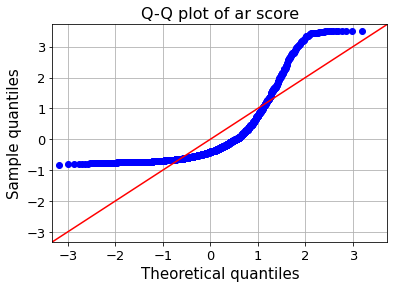

<Figure size 576x360 with 0 Axes>

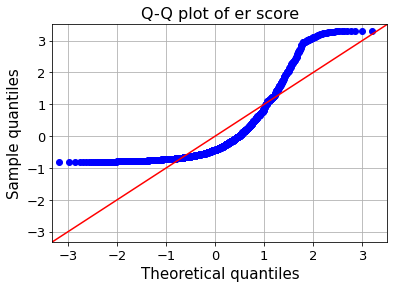

<Figure size 576x360 with 0 Axes>

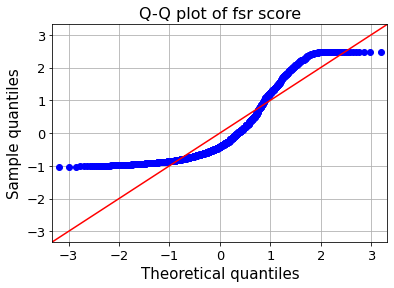

<Figure size 576x360 with 0 Axes>

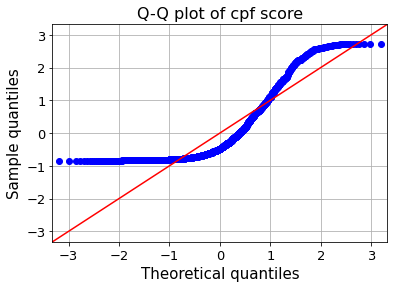

<Figure size 576x360 with 0 Axes>

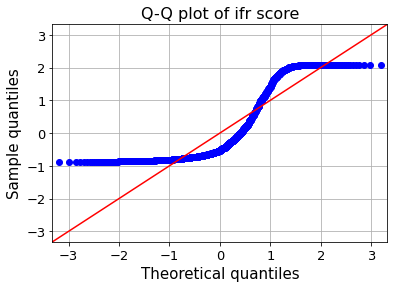

<Figure size 576x360 with 0 Axes>

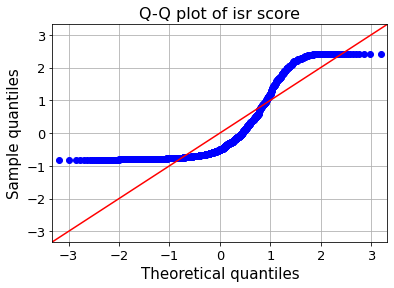

<Figure size 576x360 with 0 Axes>

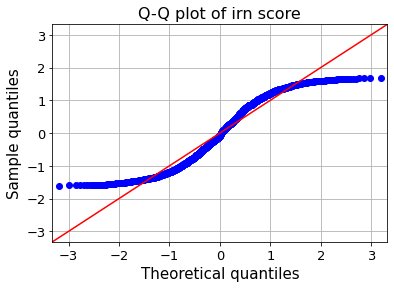

<Figure size 576x360 with 0 Axes>

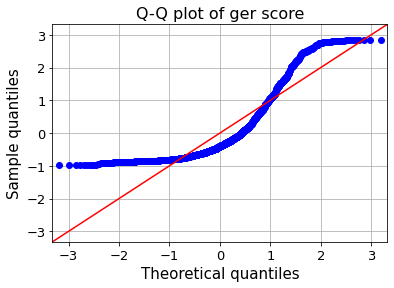

In [ ]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm=newdata[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

**What are the likely distributions of the numeric variables?
What are the distributions of the predictor variables?**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5b7ef354f0>,
      dtype=object)

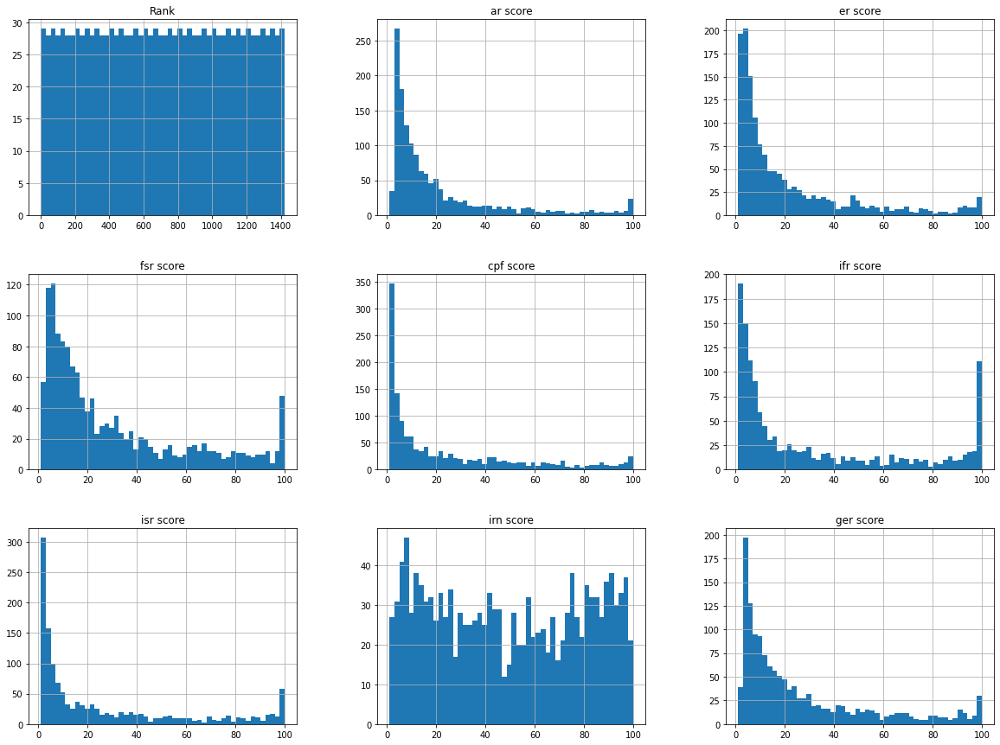

In [ ]:

# Get only the numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Plot histograms for each numeric column
df[numeric_columns].hist(bins=50, figsize=(20,15))

 **Interpreting the above plots:**

The distrubution followed by most of the scores comes out to be Right Skewed Distribution.
Although, they tend to become normally distributed with progression.
The distribution is as follows:

*   ar score, er score, fsr score, cpf score, ifr score, isr score & ger 
score: Right Skewed Distribution.
*   irn score: Normal Distribution



**Do the ranges of the predictor variables make sense?** 


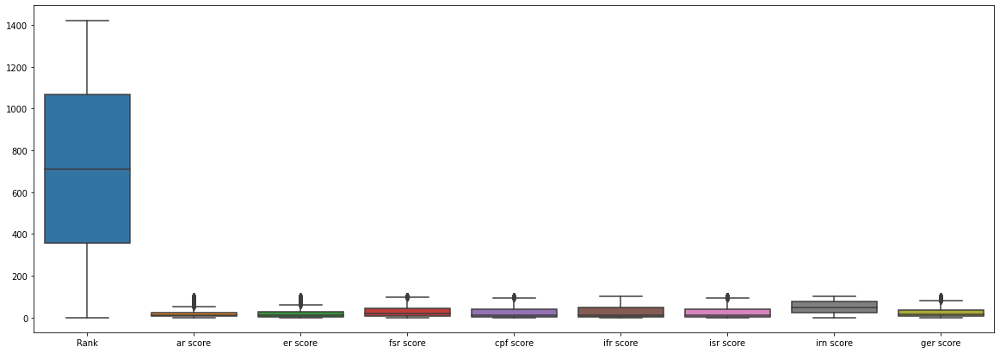

In [ ]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,7))
sns.boxplot(data=newdata)

In [ ]:
#Range of each column
newdata.max() - newdata.min()
newdata.describe()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
count,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000
mean,711.500000,20.124684,20.650914,29.964937,24.460028,30.331561,25.808776,49.399409,26.100647
std,410.640354,22.802706,24.020620,28.165843,27.886674,33.455492,30.542261,30.144495,26.117151
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,356.250000,5.400000,4.400000,8.200000,3.100000,4.800000,3.200000,21.625000,6.800000
50%,711.500000,10.800000,10.300000,18.200000,10.950000,12.640000,10.300000,47.000000,15.500000
75%,1066.750000,23.775000,26.950000,43.475000,39.200000,49.075000,38.700000,77.375000,36.300000
max,1422.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


 **Summary Statistics**

* This table shows summary statistics for a dataset with 1422 observations and 9 variables.

* The variables are: 'Rank', 'ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score' and 'ger score'.

* The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

* The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

* The "min" and "max" rows show the smallest and largest values observed for each variable.

* The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

* These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.




## **Data transforming, Feature creation and Analysis**

In [ ]:
# Normalizing the data in the rank column beacuse the value is too high when compared to other independent variable

from sklearn import preprocessing

# Create x to store scaled values as floats
x = newdata[['Rank']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
newdata[['Rank']] = pd.DataFrame(x_scaled)

In [ ]:
newdata.head()


,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,0.000000,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,0.000704,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,0.001407,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,0.002111,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,0.002815,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


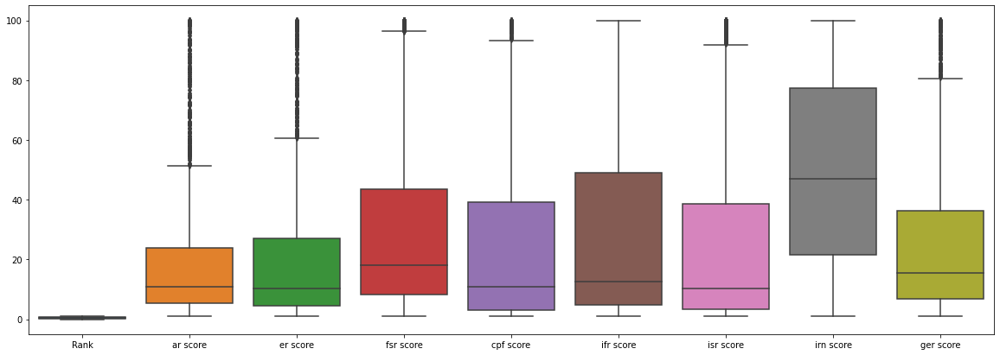

In [ ]:
#Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(20,7))
sns.boxplot(data=newdata)

**In the predictor variables independent of all the other predictor variables?**



No, they are not independent of each other as seen below. There is multi - collinearity among lot of the independent variable which is shown by the correlation table, heatmap and pairplot map.

In [ ]:
newdata.corr()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
Rank,1.000000,-0.736358,-0.660940,-0.580807,-0.659282,-0.572367,-0.535034,-0.639821,-0.475526
ar score,-0.736358,1.000000,0.842919,0.374992,0.558307,0.415630,0.406949,0.616660,0.563289
er score,-0.660940,0.842919,1.000000,0.342738,0.429492,0.370071,0.372894,0.425420,0.576776
fsr score,-0.580807,0.374992,0.342738,1.000000,0.118821,0.179997,0.235483,0.167764,0.291551
cpf score,-0.659282,0.558307,0.429492,0.118821,1.000000,0.445985,0.362950,0.594143,0.361509
ifr score,-0.572367,0.415630,0.370071,0.179997,0.445985,1.000000,0.719588,0.414264,0.330870
isr score,-0.535034,0.406949,0.372894,0.235483,0.362950,0.719588,1.000000,0.371316,0.311141
irn score,-0.639821,0.616660,0.425420,0.167764,0.594143,0.414264,0.371316,1.000000,0.262862
ger score,-0.475526,0.563289,0.576776,0.291551,0.361509,0.330870,0.311141,0.262862,1.000000


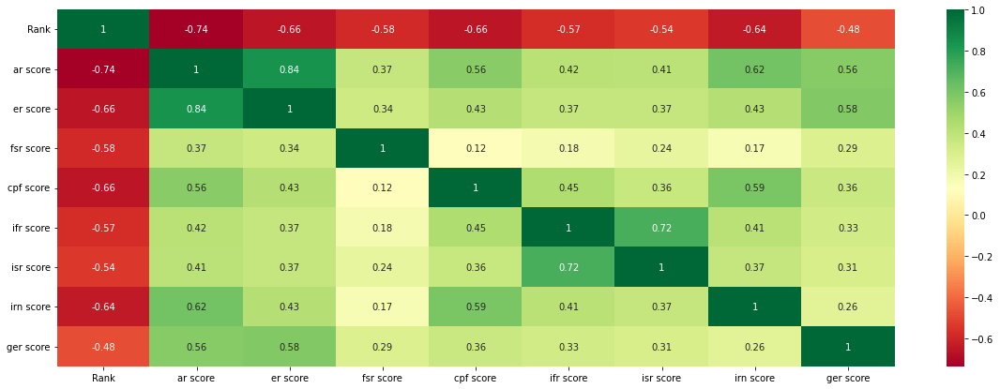

In [ ]:
plt.figure(figsize=(20,7))
sns.heatmap(newdata.corr(), annot=True, cmap='RdYlGn')

**Correlation Analysis**

Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g. light orange) to high (e.g. dark purple).

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.


***From the above matrix we can conclude a few things:***

* ar score and er score are highly correlated.
* ifr score and isr score are highly correlated.

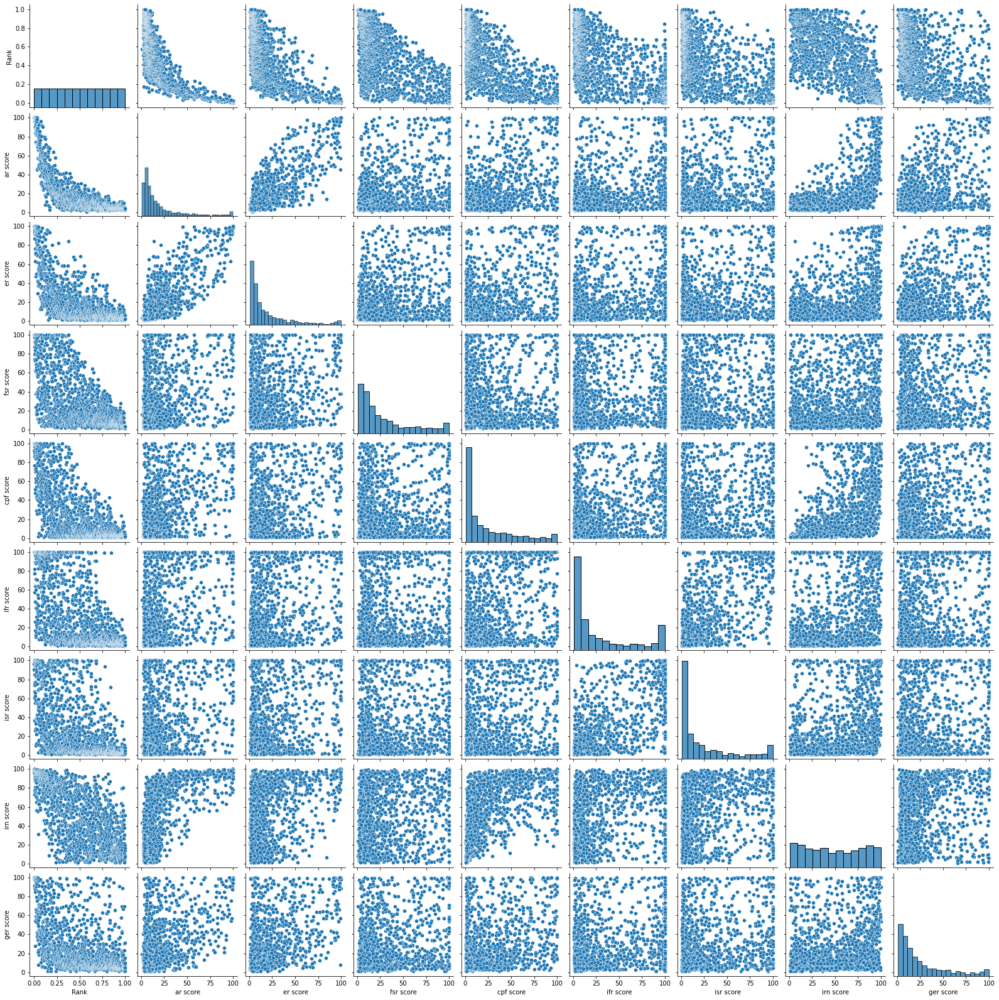

In [ ]:
sns.pairplot(newdata)

**Which independent variables are useful to predict a target (dependent variable)?**




In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(newdata['Rank'],newdata[['ar score','er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score','ger score']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                   Rank   R-squared (uncentered):                   0.490
Model:                            OLS   Adj. R-squared (uncentered):              0.487
Method:                 Least Squares   F-statistic:                              169.8
Date:                Sun, 05 Feb 2023   Prob (F-statistic):                   1.28e-200
Time:                        03:37:31   Log-Likelihood:                         -758.14
No. Observations:                1422   AIC:                                      1532.
Df Residuals:                    1414   BIC:                                      1574.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
ar score      -0.0140      0.001    -13.390      0.000      -0.016      -0.012
er score       0.0026      0.001      2.974      0.003       0.001       0.004
fsr score      0.0015      0.000      3.824      0.000       0.001       0.002
cpf score     -0.0039      0.001     -7.322      0.000      -0.005      -0.003
ifr score     -0.0006      0.000     -1.160      0.246      -0.002       0.000
isr score     -0.0005      0.001     -0.869      0.385      -0.001       0.001
irn score      0.0101      0.000     24.888      0.000       0.009       0.011
ger score      0.0052      0.001     10.122      0.000       0.004       0.006
==============================================================================
Omnibus:                       84.689   Durbin-Watson:                   0.510
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.513
Skew:                           0.066   Prob(JB):                     8.71e-08
Kurtosis:                       2.271   Cond. No.                         11.6
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

We will consider a significance value of 0.05 for determining the significance of our predictor variables which means if

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

1. The ar score has the p-value 0.0, which is lesser and hence it is a significant feature.
2. The er score has the p-value 0.003, which is lesser and hence it is a significant feature.
3. The fsr score has the p-value 0.0, which is lesser and hence it is a significant feature.
4. The cpf score has the p-value 0.0, which is lesser and hence it is a significant feature.
5. The ifr score has the p-value 0.246, which is greater and hence it is a not so significant feature.
6. The isr score has the p-value 0.385, which is greater and hence it is a significant feature.
7. The irn score has the p-value 0.0, which is lesser and hence it is a significant feature.
8. The ger score has the p-value 0, which is lesser and hence it is a significant feature.




 **Do the training and test sets have the same data?**

In [ ]:
from sklearn.model_selection import  train_test_split

X = newdata[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]

y = newdata['Rank']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

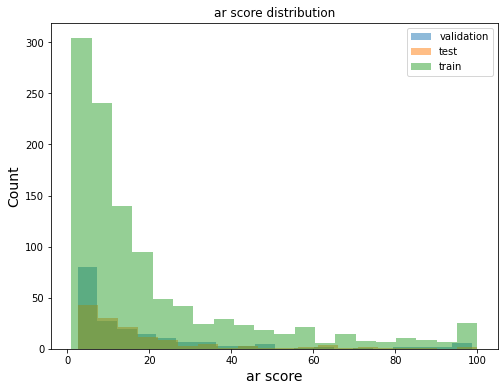

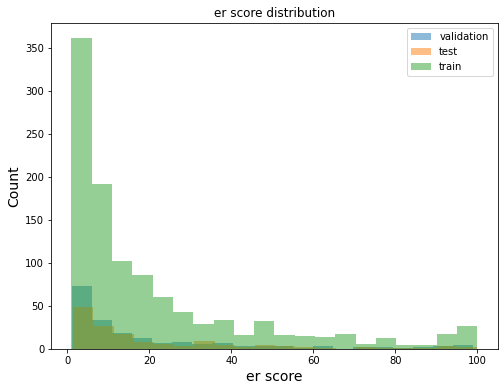

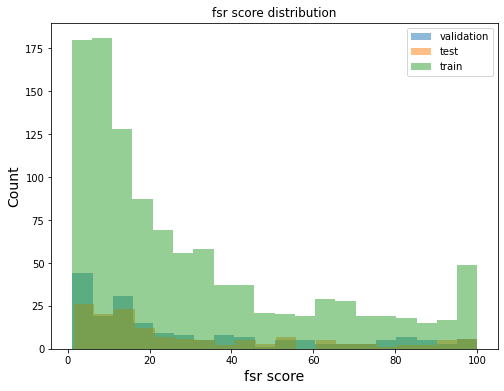

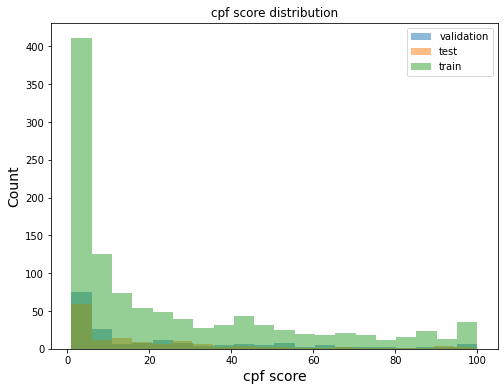

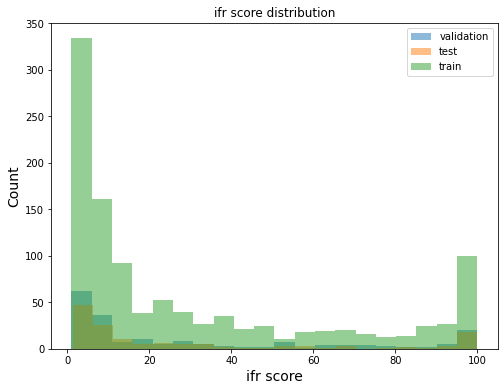

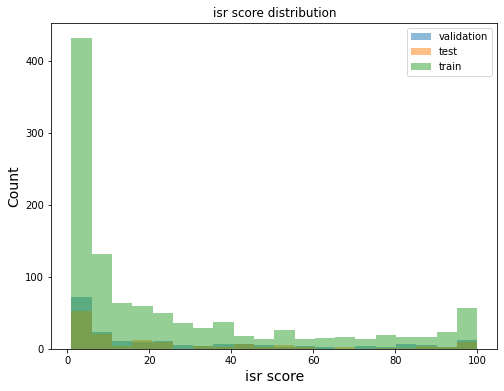

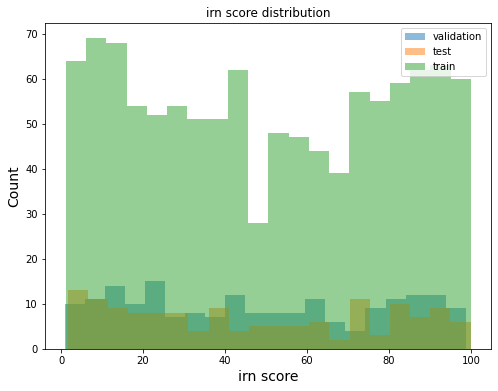

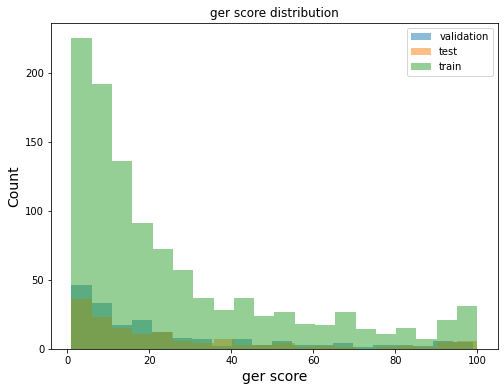

In [ ]:
X_test_plot = X_test[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]

X_val_plot = X_val[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]

X_train_plot = X_train[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()
 

Yes, most of the data are same in test, train and validation data set except the data points in training set are more and few boundary values are not included in train and validation data set.


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model


In [ ]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

LinearRegression()

In [ ]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_train, y_pred))
r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Mean squared error: 0.01
Coefficient of determination: 0.83
R^2 score on tarining set = 0.8284823513372345


In [ ]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.01
Coefficient of determination: 0.83
R^2 score on test set = 0.8314624743172447


In [ ]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_val, y_pred))
r2_val = r2_score(y_val,y_pred)
print('R^2 score on validation set =',r2_val)

Mean squared error: 0.01
Coefficient of determination: 0.84
R^2 score on validation set = 0.8408432598708061



**Which predictor variables are the most important?** 

In [ ]:
#Understanding the important features 
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.3678 ± 0.0744,fsr score
0.1345 ± 0.0371,cpf score
0.0765 ± 0.0341,irn score
0.0696 ± 0.0252,er score
0.0451 ± 0.0098,ifr score
0.0153 ± 0.0109,ar score
0.0029 ± 0.0069,isr score
0.0004 ± 0.0039,ger score


Most Important Features are calculated on the basis of their weightage. As shown above, FSR Score is most important feature.

**Remove outliers and keep outliers (does if have an effect of the final predictive model)?**

**Outliers Removal**

In [ ]:
def remove_outliers(df, multiplier=1.5):
    result = df.copy()
    for col in df.columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - multiplier * IQR
        upper_bound = Q3 + multiplier * IQR
        result = result[(result[col] > lower_bound) & (result[col] < upper_bound)]
    return result

In [ ]:
# df without outliers
newdata_no_outliers = remove_outliers(newdata)

In [ ]:
X = newdata_no_outliers[['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score'
       ,'ger score']]

y = newdata_no_outliers['Rank']

In [ ]:

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

Linear Regression post removing outliers

In [ ]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

LinearRegression()

In [ ]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_train, y_pred))
r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Mean squared error: 0.01
Coefficient of determination: 0.91
R^2 score on tarining set = 0.9101628049841187


In [ ]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.00
Coefficient of determination: 0.93
R^2 score on test set = 0.9299992845077729


In [ ]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_val, y_pred))
r2_val = r2_score(y_val,y_pred)
print('R^2 score on validation set =',r2_val)

Mean squared error: 0.00
Coefficient of determination: 0.91
R^2 score on validation set = 0.9059926767166052


In [ ]:
perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.4867 ± 0.1086,fsr score
0.3318 ± 0.0837,cpf score
0.2034 ± 0.0377,ar score
0.0581 ± 0.0166,er score
0.0347 ± 0.0085,ifr score
0.0241 ± 0.0064,isr score
0.0057 ± 0.0087,irn score
-0.0011 ± 0.0018,ger score


As we can see from the R^2 score on test set post and pre removal of outliers, there's been a significant increase in the same.
1. Pre-removal outliers: 0.82 - 0.84
2. Post-removal outliers: 0.90 - 0.93 

**Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values? That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.**

df without rank of scores

In [ ]:
df1.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
df1.drop(['institution','location code','location','score scaled','ar rank', 'er rank', 'fsr rank', 'cpf rank','isr rank', 'irn rank','ger rank', 'ifr rank'], axis=1,inplace= True)

In [ ]:
#find missing valures in df1
df1.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

1% removal of data

In [ ]:
df2 = df1.sample(frac=0.99, random_state=42)

In [ ]:
df2.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

Mean Imputation

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
df_imputed_mean = imputer.fit_transform(df2)
df_imputed_mean = pd.DataFrame(df_imputed_mean, columns=df2.columns)

In [ ]:
df2.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

Residual Error Percentage with Variance & Check for Bias

In [ ]:
residual = df2 - df_imputed_mean
residual_percentage = (residual / df2) * 100
mean_residual_percentage = residual_percentage.mean()
mean_residual_percentage

Rank        -253.694609
ar score    -147.143397
er score    -225.265158
fsr score   -180.856990
cpf score   -417.275846
ifr score   -392.134934
isr score   -397.569657
irn score   -153.331109
ger score   -172.161406
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mean_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.270128e+06
ar score     1.859201e+05
er score     4.150961e+05
fsr score    2.630152e+05
cpf score    1.234397e+06
ifr score    1.085029e+06
isr score    1.059662e+06
irn score    3.288374e+05
ger score    3.373465e+05
dtype: float64
Bias: Rank         253.694609
ar score     147.143397
er score     225.265158
fsr score    180.856990
cpf score    417.275846
ifr score    392.134934
isr score    397.569657
irn score    153.331109
ger score    172.161406
dtype: float64


KNN Imputation

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
df1.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

In [ ]:
df3 = df1.sample(frac=0.99, random_state=42)
imputer = KNNImputer(n_neighbors=5)
imputer.fit(df3)
imputed_number_dataframe = pd.DataFrame(imputer.fit_transform(df3), columns=df3.columns)


In [ ]:
imputed_number_dataframe.isnull().sum()

Rank         0
ar score     0
er score     0
fsr score    0
cpf score    0
ifr score    0
isr score    0
irn score    0
ger score    0
dtype: int64

Residual Error Percentage with Variance & Check for Bias

In [ ]:
residual = df3 - imputed_number_dataframe
residual_percentage = (residual / df3) * 100
knn_residual_percentage = residual_percentage.mean()
knn_residual_percentage

Rank        -253.694609
ar score    -147.143397
er score    -224.976018
fsr score   -180.733981
cpf score   -416.029204
ifr score   -370.633504
isr score   -386.458579
irn score   -152.696906
ger score   -171.128169
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(knn_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.270128e+06
ar score     1.859201e+05
er score     4.148575e+05
fsr score    2.630676e+05
cpf score    1.233738e+06
ifr score    1.071326e+06
isr score    1.060640e+06
irn score    3.288700e+05
ger score    3.371425e+05
dtype: float64
Bias: Rank         253.694609
ar score     147.143397
er score     224.976018
fsr score    180.733981
cpf score    416.029204
ifr score    370.633504
isr score    386.458579
irn score    152.696906
ger score    171.128169
dtype: float64


MICE

In [ ]:
!pip install fancyimpute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from fancyimpute import IterativeImputer
df4 = df1.sample(frac=0.99, random_state=42)
imputer = IterativeImputer(max_iter=10, random_state=0)
X_imputed = imputer.fit_transform(df4)

# Convert the imputed numpy array back to a DataFrame
df_imputed = pd.DataFrame(X_imputed, columns=df.columns)


Residual Error Percentage with Variance & Check for Bias

In [ ]:
residual = df4 - df_imputed
residual_percentage = (residual / df4) * 100
mice_residual_percentage = residual_percentage.mean()
mice_residual_percentage

Rank        -253.694609
ar score    -147.143397
er score    -224.860205
fsr score   -180.756385
cpf score   -415.393893
ifr score   -370.805075
isr score   -387.350798
irn score   -152.485502
ger score   -170.900337
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mice_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.270128e+06
ar score     1.859201e+05
er score     4.148272e+05
fsr score    2.630564e+05
cpf score    1.234679e+06
ifr score    1.076796e+06
isr score    1.064140e+06
irn score    3.287197e+05
ger score    3.369942e+05
dtype: float64
Bias: Rank         253.694609
ar score     147.143397
er score     224.860205
fsr score    180.756385
cpf score    415.393893
ifr score    370.805075
isr score    387.350798
irn score    152.485502
ger score    170.900337
dtype: float64


5% removal of Data


In [ ]:
df2 = df1.sample(frac=0.95, random_state=42)
df2.isnull().sum()

Rank          0
ar score      0
er score      0
fsr score     2
cpf score     4
ifr score    95
isr score    54
irn score    12
ger score    12
dtype: int64

Mean Imputation

In [ ]:
imputer = SimpleImputer(strategy='mean')
df_imputed_mean = imputer.fit_transform(df2)
df_imputed_mean = pd.DataFrame(df_imputed_mean, columns=df2.columns)

In [ ]:
df_imputed_mean.isnull().sum()

Rank         0
ar score     0
er score     0
fsr score    0
cpf score    0
ifr score    0
isr score    0
irn score    0
ger score    0
dtype: int64

Reidual Error with Variance & Check for Bias

In [ ]:
residual = df2 - df_imputed_mean
residual_percentage = (residual / df2) * 100
mean_residual_percentage = residual_percentage.mean()
mean_residual_percentage

Rank        -264.831880
ar score    -136.361058
er score    -206.550510
fsr score   -170.981062
cpf score   -394.055042
ifr score   -381.000833
isr score   -381.333878
irn score   -152.230747
ger score   -160.137840
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mean_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.497476e+06
ar score     1.706071e+05
er score     3.839308e+05
fsr score    2.372638e+05
cpf score    1.163224e+06
ifr score    1.082872e+06
isr score    9.847699e+05
irn score    3.435172e+05
ger score    2.940902e+05
dtype: float64
Bias: Rank         264.831880
ar score     136.361058
er score     206.550510
fsr score    170.981062
cpf score    394.055042
ifr score    381.000833
isr score    381.333878
irn score    152.230747
ger score    160.137840
dtype: float64


KNN Imputation

In [ ]:
df3 = df1.sample(frac=0.95, random_state=42)
imputer = KNNImputer(n_neighbors=5)
imputer.fit(df3)
imputed_number_dataframe = pd.DataFrame(imputer.fit_transform(df3), columns=df3.columns)

Residual Error with variance & Check for Bias

In [ ]:
residual = df3 - imputed_number_dataframe
residual_percentage = (residual / df3) * 100
knn_residual_percentage = residual_percentage.mean()
knn_residual_percentage

Rank        -264.831880
ar score    -136.361058
er score    -206.550510
fsr score   -170.846802
cpf score   -392.813560
ifr score   -358.581475
isr score   -370.022579
irn score   -151.616374
ger score   -159.022329
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(knn_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.497476e+06
ar score     1.706071e+05
er score     3.839308e+05
fsr score    2.373182e+05
cpf score    1.162367e+06
ifr score    1.067535e+06
isr score    9.856094e+05
irn score    3.435241e+05
ger score    2.938434e+05
dtype: float64
Bias: Rank         264.831880
ar score     136.361058
er score     206.550510
fsr score    170.846802
cpf score    392.813560
ifr score    358.581475
isr score    370.022579
irn score    151.616374
ger score    159.022329
dtype: float64


MICE Imputation

In [ ]:
df4 = df1.sample(frac=0.95, random_state=42)
imputer = IterativeImputer(max_iter=10, random_state=0)
X_imputed = imputer.fit_transform(df4)

# Convert the imputed numpy array back to a DataFrame
df_imputed = pd.DataFrame(X_imputed, columns=df.columns)


Residual Error with Variance & Check for Bias

In [ ]:
residual = df4 - df_imputed
residual_percentage = (residual / df4) * 100
mice_residual_percentage = residual_percentage.mean()
mice_residual_percentage

Rank        -264.831880
ar score    -136.361058
er score    -206.550510
fsr score   -170.869677
cpf score   -392.212081
ifr score   -358.509360
isr score   -370.948684
irn score   -151.408763
ger score   -158.775048
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mice_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.497476e+06
ar score     1.706071e+05
er score     3.839308e+05
fsr score    2.373073e+05
cpf score    1.163260e+06
ifr score    1.073234e+06
isr score    9.890120e+05
irn score    3.433677e+05
ger score    2.936787e+05
dtype: float64
Bias: Rank         264.831880
ar score     136.361058
er score     206.550510
fsr score    170.869677
cpf score    392.212081
ifr score    358.509360
isr score    370.948684
irn score    151.408763
ger score    158.775048
dtype: float64


10% removal of Data

In [ ]:
df2 = df1.sample(frac=0.90, random_state=42)
df2.isnull().sum()

Rank          0
ar score      0
er score      0
fsr score     2
cpf score     4
ifr score    91
isr score    52
irn score    12
ger score    11
dtype: int64

Mean Imputation

In [ ]:
imputer = SimpleImputer(strategy='mean')
df_imputed_mean = imputer.fit_transform(df2)
df_imputed_mean = pd.DataFrame(df_imputed_mean, columns=df2.columns)

Residual Error with Variance & Check for Bias

In [ ]:
residual = df2 - df_imputed_mean
residual_percentage = (residual / df2) * 100
mean_residual_percentage = residual_percentage.mean()
mean_residual_percentage

Rank        -292.318811
ar score    -122.116632
er score    -194.153919
fsr score   -152.948266
cpf score   -345.593708
ifr score   -352.967807
isr score   -323.286951
irn score   -128.155756
ger score   -153.437970
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mean_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.897683e+06
ar score     1.522845e+05
er score     3.775832e+05
fsr score    2.134642e+05
cpf score    9.800267e+05
ifr score    9.885419e+05
isr score    7.689046e+05
irn score    2.501340e+05
ger score    2.992179e+05
dtype: float64
Bias: Rank         292.318811
ar score     122.116632
er score     194.153919
fsr score    152.948266
cpf score    345.593708
ifr score    352.967807
isr score    323.286951
irn score    128.155756
ger score    153.437970
dtype: float64


KNN Imputation

In [ ]:
df3 = df1.sample(frac=0.90, random_state=42)
imputer = KNNImputer(n_neighbors=5)
imputer.fit(df3)
imputed_number_dataframe = pd.DataFrame(imputer.fit_transform(df3), columns=df3.columns)

Residual Error Percentage with Variance & Check for Bias



In [ ]:
residual = df3 - imputed_number_dataframe
residual_percentage = (residual / df3) * 100
knn_residual_percentage = residual_percentage.mean()
knn_residual_percentage

Rank        -292.318811
ar score    -122.116632
er score    -194.153919
fsr score   -152.799667
cpf score   -344.204301
ifr score   -332.311391
isr score   -311.977848
irn score   -127.490768
ger score   -152.683872
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(knn_residual_percentage - 0)


# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.897683e+06
ar score     1.522845e+05
er score     3.775832e+05
fsr score    2.135192e+05
cpf score    9.789310e+05
ifr score    9.730286e+05
isr score    7.693476e+05
irn score    2.501055e+05
ger score    2.990757e+05
dtype: float64
Bias: Rank         292.318811
ar score     122.116632
er score     194.153919
fsr score    152.799667
cpf score    344.204301
ifr score    332.311391
isr score    311.977848
irn score    127.490768
ger score    152.683872
dtype: float64


MICE Imputation

In [ ]:
df4 = df1.sample(frac=0.90, random_state=42)
imputer = IterativeImputer(max_iter=10, random_state=0)
X_imputed = imputer.fit_transform(df4)

# Convert the imputed numpy array back to a DataFrame
df_imputed = pd.DataFrame(X_imputed, columns=df.columns)

Residual Error Percentage with Variance & Check for Bias

In [ ]:
residual = df4 - df_imputed
residual_mean = residual.mean()
residual_percentage = (residual / df4) * 100
mice_residual_percentage = residual_percentage.mean()
mice_residual_percentage

Rank        -292.318811
ar score    -122.116632
er score    -194.153919
fsr score   -152.828215
cpf score   -343.545377
ifr score   -332.051262
isr score   -313.247786
irn score   -127.242467
ger score   -152.278582
dtype: float64

In [ ]:
variance = np.var(residual_percentage)

# Calculate the bias
bias = abs(mice_residual_percentage - 0)

# Print the variance and bias
print("Variance:", variance)
print("Bias:", bias)

Variance: Rank         3.897683e+06
ar score     1.522845e+05
er score     3.775832e+05
fsr score    2.135067e+05
cpf score    9.798344e+05
ifr score    9.793980e+05
isr score    7.728423e+05
irn score    2.499193e+05
ger score    2.989101e+05
dtype: float64
Bias: Rank         292.318811
ar score     122.116632
er score     194.153919
fsr score    152.828215
cpf score    343.545377
ifr score    332.051262
isr score    313.247786
irn score    127.242467
ger score    152.278582
dtype: float64


1. On comparing the values of the Bias and variance computed by the three imputation techniques we can see that the values for the variance and bias for all 3 methods improved as the % of data increased from 1% to 10%. 
2. Amongst all 3, MICE Imputation has the lowest values and hence is the best method for our dataset.


**Conclusion**

From the analysis done above on the data set, The fsr core is the most important in calculating the university ranks. There is an evident multi - collinearity among lot of the independent variables.

## **Creating Auto ML Models**


In [ ]:
#loading the required libraries
#!pip install Jinja2 2.11.3
!pip install eli5
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=0471f0c31a7e346039b36f42ebc8d6cd577fbf01946362a81560e6f7bb308a1c
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built eli5


In [ ]:
#necessary installations
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.7/177.7 MB 6.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [ ]:
#Importing all the necessary libraries required
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [ ]:
# Seting the percentage of available memory that the process can use
pct_memory = 0.5

# Getting the total available virtual memory on the system
virtual_memory = psutil.virtual_memory()

# Calculating the minimum memory size required for the process in GB
min_mem_size = int(round(int(pct_memory*virtual_memory.available)/1073741824,0))

print(min_mem_size)

6


In [ ]:
# Starting the H2O server on a random port within the range of 5555 to 55555
for i in range(5555, 55556):
    try:
        h2o.init(strict_version_check=False, min_mem_size_GB=min_mem_size, port=i)
        print("H2O server started on port:", i)
        break
    except:
        continue
else:
    print("Could not start H2O server")

Checking whether there is an H2O instance running at http://localhost:5555..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.17" 2022-10-18; OpenJDK Runtime Environment (build 11.0.17+8-post-Ubuntu-1ubuntu220.04); OpenJDK 64-Bit Server VM (build 11.0.17+8-post-Ubuntu-1ubuntu220.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.8/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpm37zzefj
  JVM stdout: /tmp/tmpm37zzefj/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpm37zzefj/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:5555
Connecting to H2O server at http://127.0.0.1:5555 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_s7wyur
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


H2O server started on port: 5555


#### **AutoML H2O**

In [ ]:
# Initializing H2O cluster
h2o.init()

# Converting pandas dataframe to H2O dataframe
h2o_df = h2o.H2OFrame(df)  

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.17" 2022-10-18; OpenJDK Runtime Environment (build 11.0.17+8-post-Ubuntu-1ubuntu220.04); OpenJDK 64-Bit Server VM (build 11.0.17+8-post-Ubuntu-1ubuntu220.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.8/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpa9om120z
  JVM stdout: /tmp/tmpa9om120z/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpa9om120z/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_t307jx
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Checking for datatypes
df.dtypes

Rank           int64
ar score     float64
er score     float64
fsr score    float64
cpf score    float64
ifr score    float64
isr score    float64
irn score    float64
ger score    float64
dtype: object

In [ ]:
# Setting up the data split between training and test dataset.
pct_rows = 0.80  

# Splitting the data into training and testing sets
df_train, df_test = h2o_df.split_frame([pct_rows])  

In [ ]:
# Printing the shape of the training and test data
print("Training data shape: ", df_train.shape)
print("Test data shape: ", df_test.shape)

Training data shape:  (1150, 9)
Test data shape:  (272, 9)


In [ ]:
df_train.head()


Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
1,100,100,100,100,100,90,96.1,100
2,100,100,100,92.3,100,96.3,99.5,100
4,100,100,100,90,98.8,98.4,99.9,100
5,100,100,99.4,100,76.9,66.9,100,100
6,96.5,87.1,100,100,99.8,85.1,73,98.8
7,98.3,99.7,99.5,86.5,100,100,98.1,88.8
8,99.4,98.6,97.6,77,99.2,100,100,90.3
9,98.6,91.3,74.2,99.2,100,98,96.2,91.1
11,99.5,94.1,79.8,91.8,100,73.5,89.9,99.6
12,99.3,96.5,87.3,96.7,57.1,36.9,77.5,91.4


In [ ]:
# Conversion to list
X = df.columns.tolist()

In [ ]:
print(X)

['Rank', 'ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score', 'ger score']


In [ ]:
y = 'Rank'

In [ ]:
X.remove(y)

In [ ]:
print(y)

Rank


In [ ]:
# Setting of AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  

In [ ]:
# Training the dataset on different models
aml.train(x=X, y=y, training_frame=df_train)  

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),16/65
# GBM base models (used / total),6/24
# XGBoost base models (used / total),6/34
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),4/4
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


**Insights:**
* The Stacked Ensemble model achieved a high R^2 value of 0.9946 on the training data, indicating a good fit to the data.
* However, on the cross-validation data, the model's performance was not as strong, with a higher RMSE of 60.93 and lower R^2 value of 0.9779, suggesting potential overfitting.

#### **Training and Testing - Plot**

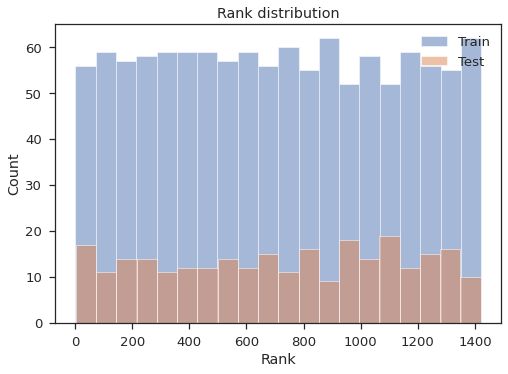

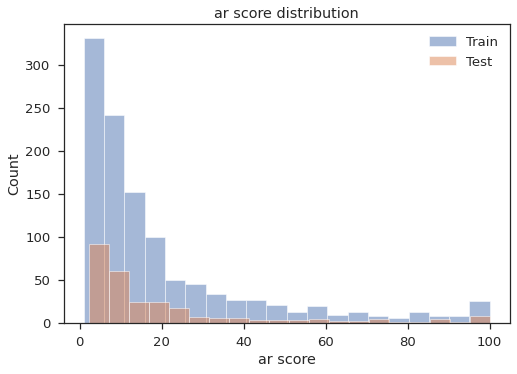

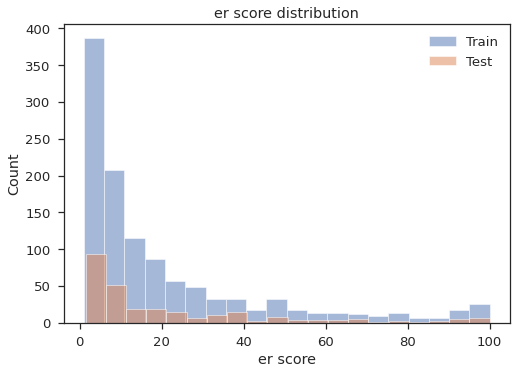

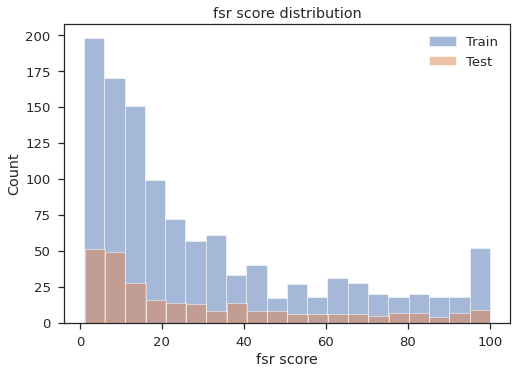

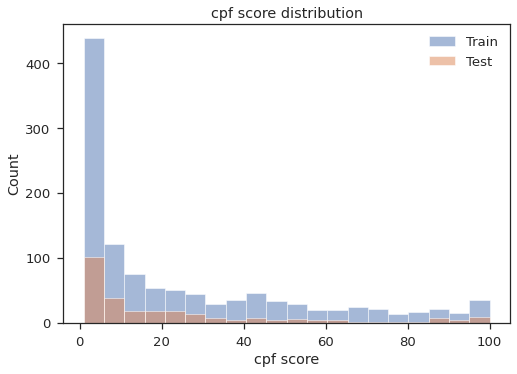

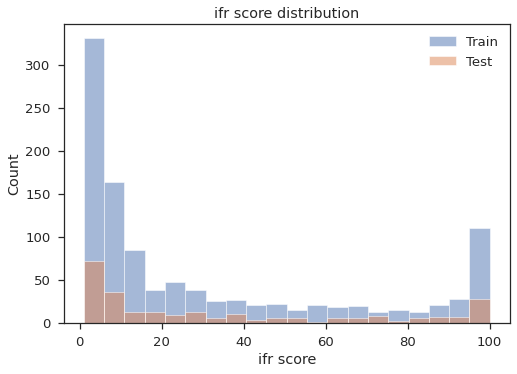

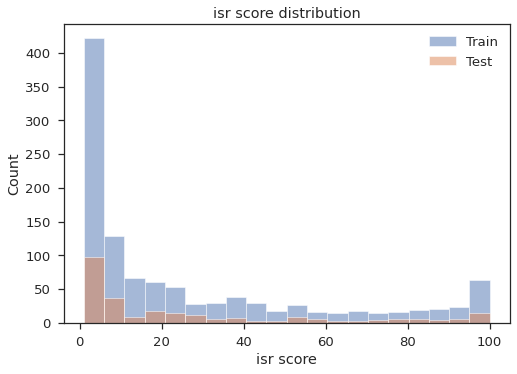

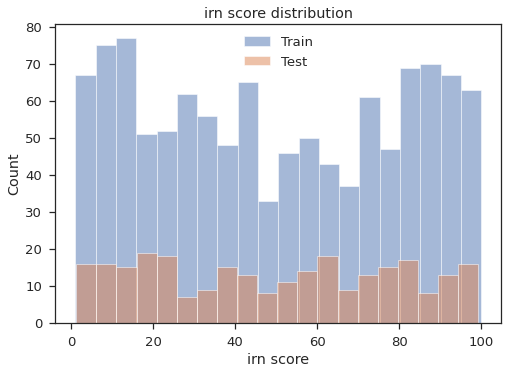

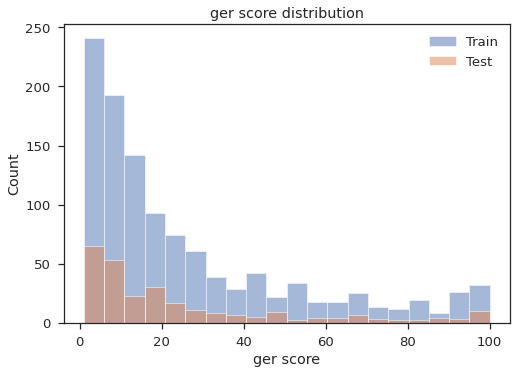

In [ ]:
def plot_histogram(df_train, df_test, column):
    # Setting the number of bins for the histogram
    bins = 20
    
    # Plotting the histograms for train and test data frames
    plt.hist( df_train[column].as_data_frame().values.flatten(), bins=bins, alpha=0.5, label='Train')
    plt.hist(df_test[column].as_data_frame().values.flatten(), bins=bins, alpha=0.5, label='Test')
    plt.title(column + ' distribution')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend()
    plt.show()

# Plotting histograms for train and test data frames
for column in df_train.columns:
    plot_histogram(df_train, df_test, column)


In [ ]:
print(aml.leaderboard)

model_id                                                   rmse      mse      mae       rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20230301_42230     60.5434  3665.5   42.7947  nan                          3665.5
StackedEnsemble_AllModels_2_AutoML_1_20230301_42230     61.7405  3811.88  44.75    nan                          3811.88
StackedEnsemble_AllModels_1_AutoML_1_20230301_42230     62.686   3929.54  45.3158  nan                          3929.54
StackedEnsemble_BestOfFamily_4_AutoML_1_20230301_42230  62.807   3944.72  45.27    nan                          3944.72
StackedEnsemble_BestOfFamily_3_AutoML_1_20230301_42230  63.8115  4071.91  46.5409  nan                          4071.91
StackedEnsemble_BestOfFamily_2_AutoML_1_20230301_42230  64.9597  4219.77  47.1021  nan                          4219.77
GBM_4_AutoML_1_20230301_42230                           66.0999  4369.2   48.1297    0.122592                   4369.2
GBM_2_AutoML_1_20230301_42230             

***Based on their rmse scores, the models included in the leaderboard are ordered, with a lower score indicating greater performance. The model with the lowest rmse score is shown in the top row of the scoreboard. The performance of various models can be compared using the evaluation metrics, which can then be used to choose the optimal model for a certain use case.***

**The model with the best performance on this leaderboard is:**
* The StackedEnsemble_BestOfFamily_4 model has the lowest RMSE of 60.9253.
* The StackedEnsemble models perform better than the GBM models.
* The difference in performance between the StackedEnsemble models is small, with the top four models having an RMSE within 2.5 points of each other.

#### **Actual vs Predicted Values**

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


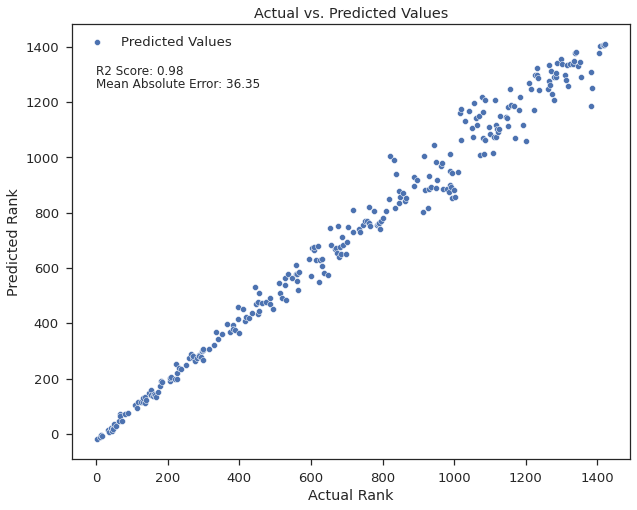

In [ ]:
# Plotting actual vs. predicted values
y_pred = aml.predict(df_test).as_data_frame()['predict']
y_test = df_test[y].as_data_frame()['Rank']
plt.figure(figsize=(10,8))
sns.scatterplot(x=y_test, y=y_pred)
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Rank')
plt.ylabel('Predicted Rank')
plt.legend(['Predicted Values'])
plt.text(0, 1300, f'R2 Score: {r2_score(y_test, y_pred):.2f}', fontsize=12)
plt.text(0, 1250, f'Mean Absolute Error: {mean_absolute_error(y_test, y_pred):.2f}', fontsize=12)
plt.show()


In [ ]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_1_20230301_42230': 0,
 'StackedEnsemble_AllModels_2_AutoML_1_20230301_42230': 1,
 'StackedEnsemble_AllModels_1_AutoML_1_20230301_42230': 2,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230301_42230': 3,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230301_42230': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230301_42230': 5,
 'GBM_4_AutoML_1_20230301_42230': 6,
 'GLM_1_AutoML_1_20230301_42230': 66}

In [ ]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

6


In [ ]:
best_model.algo

'gbm'

*The best performing model among all the trained models is a Gradient Boosting Machine (GBM) algorithm.*

#### **Explainability**

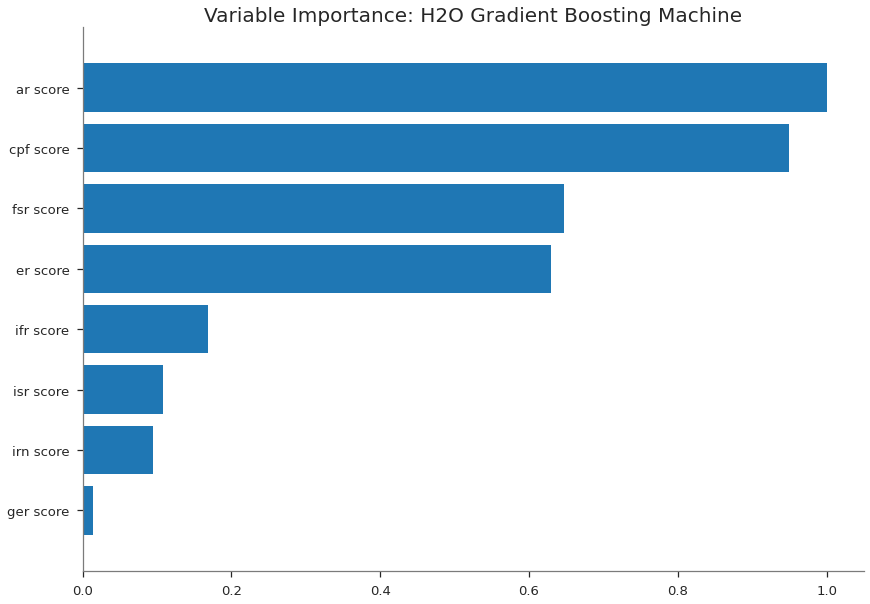

<Figure size 576x396 with 0 Axes>

In [ ]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()


***Inference for the above plot:***

The graph on top represents the Distributed Random Forest Model for H20's variable Importance.

* We can infer that, out of all the variables, ar score is the most significant, with a significance of 1.0 (as if this significance were scaled to 100%). Also, fsr score is the next one holding significance.

GLM model found at index 66 of the AutoML leaderboard
Algorithm: GLM



<Figure size 720x576 with 0 Axes>

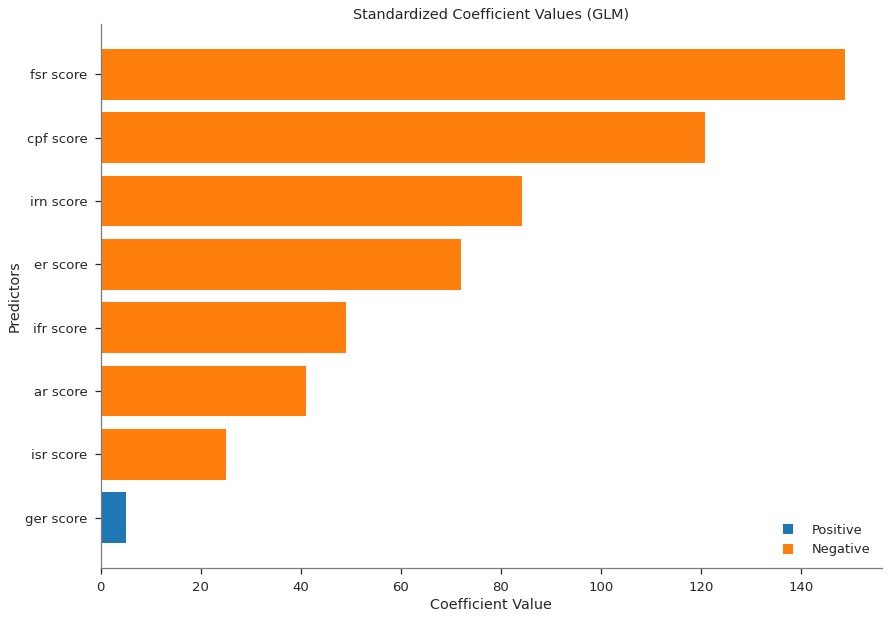

In [ ]:
if glm_index != 0:
    print(f"GLM model found at index {glm_index} of the AutoML leaderboard")
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(f"Algorithm: {glm_model.algo.upper()}\n")
    plt.figure(figsize=(10, 8))
    glm_model.std_coef_plot()
    plt.title(f"Standardized Coefficient Values ({glm_model.algo.upper()})")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Predictors")
    plt.show()


***Keynote:***

By standardizing all variables to have a mean of zero and a standard deviation of one, standardized coefficient magnitudes (also known as standardized coefficients or beta coefficients) are a measurement of the significance of each input variable in a predictive model. Standardized coefficient magnitudes are typically expressed as percentages, but their values can vary from -infinity to infinity.

After taking into consideration the scale of the variable, the values on the standardized coefficient magnitudes indicate the relative significance of each input variable in the model. A bigger impact on the outcome variable is indicated by a higher magnitude value, whilst a lesser effect is indicated by a lower value.


In [ ]:
print(best_model.rmse(train=True))


21.2910779415041


In [ ]:
# Function to gather stats of the model
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [ ]:
# Calculating the performance statistics of the best model on a test dataset
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 3544.615434230949,
 'rmse': 59.53667301950075,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

#### **Model Performance Metrics - Plot**

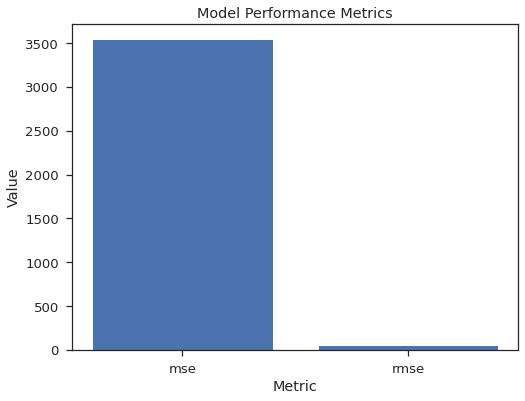

In [ ]:
# Getting performance stats
mod_perf = best_model.model_performance(df_test)
stats_test = model_performance_stats(mod_perf)

# Removing missing values from dictionary
stats_test = {k: v for k, v in stats_test.items() if v is not None}

# Creating bar plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.bar(stats_test.keys(), stats_test.values())
ax.set_title('Model Performance Metrics')
ax.set_ylabel('Value')
ax.set_xlabel('Metric')
plt.show()

In [ ]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Predictions on Test Dataset using the best model from the leaderboard.
y_pred = h2o.as_list(
    predictions
)  
print(y_pred)

         predict
0       4.015249
1      12.274963
2      14.111118
3      14.852161
4      36.410353
..           ...
267  1364.326496
268  1376.576642
269  1383.821715
270  1386.983265
271  1402.429782

[272 rows x 1 columns]


In [ ]:
# Real Answers
y_test = h2o.as_list(df_test[y]) 
y_test

,Rank
0,3
1,10
2,14
3,17
4,33
...,...
267,1403
268,1408
269,1416
270,1417


In [ ]:
print(X)

['ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score', 'ger score']


#### **Regularization**

*In this section, we will explore the concept of regularization in the context of linear regression using the GLM model. Regularization techniques, such as Ridge and Lasso, are used to prevent overfitting and improve the model's generalization ability.*

* Ridge regularization works by adding a penalty term to the least-squares objective function of the linear regression model. The penalty term is proportional to the square of the magnitude of the coefficients of the model, which helps to shrink the coefficients towards zero. The regularization strength is controlled by a hyperparameter, which must be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

* Lasso regularization, on the other hand, adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, making Lasso regularization an effective method for feature selection. By removing irrelevant variables from the model, Lasso can simplify and make the model more interpretable. The main difference between Ridge and Lasso regularization is the type of penalty function used. L2 regularization distributes the penalty evenly across all coefficients, while L1 regularization concentrates the penalty on a smaller subset of the most important coefficients. The choice of regularization method depends on the specific problem and the properties of the input variables.

In summary, regularization techniques like Ridge and Lasso are powerful tools for improving the accuracy and generalization ability of linear regression models. By controlling the regularization strength, we can balance the tradeoff between bias and variance in the model and prevent overfitting. Ridge regularization can reduce the effect of correlated input variables, while Lasso regularization can effectively perform feature selection and simplify the model. The choice of regularization method depends on the specific problem and the characteristics of the input variables.






In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Creating a H2OGeneralizedLinearEstimator object for each type of regularization
# Elastic Net Regularization
ranking_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)
# RIDGE Regularization
ranking_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)
# LASSO Regularization
ranking_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)
# Lambda Search
ranking_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)

**Inference:**

The code is creating three H2OGeneralizedLinearEstimator objects with different regularization methods: Elastic Net, Ridge, and Lasso.
* The first object, "ranking_glm," is using Elastic Net regularization with lambda set to 0 and 5-fold cross-validation.
* The second object, "ranking_glm_regularization_ridge," is using Ridge regularization with alpha set to 0 and 5-fold cross-validation.
* The third object, "ranking_glm_regularization_lasso," is using Lasso regularization with alpha set to 1 and 5-fold cross-validation.
* The code also includes an additional H2OGeneralizedLinearEstimator object, "ranking_glm_regularization_lamba_search," which enables lambda search for L1 and L2 regularization.

In [ ]:
# Training a generalized linear regression model using H2O
ranking_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,8,8,1,py_2_sid_84c5
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,142.94052,8.611244,135.15778,144.1219,138.99384,157.25447,139.1746
mean_residual_deviance,31272.314,3999.4104,26563.562,32354.865,31533.605,37132.527,28777.018
mse,31272.314,3999.4104,26563.562,32354.865,31533.605,37132.527,28777.018
null_deviance,38751172.0000000,1499950.9,37042728.0000000,41023220.0000000,39250648.0000000,37991740.0000000,38447512.0000000
r2,0.8139867,0.0262035,0.8451018,0.8104974,0.8087834,0.7755019,0.8300493
residual_deviance,7208725.5,1083365.5,5737729.5,7765167.5,7504998.0,8503349.0,6532383.0
rmse,176.55417,11.232743,162.98332,179.87457,177.57704,192.69801,169.63791
rmsle,nan,0.0,nan,nan,nan,nan,nan


#### **Feature Importance Plot**

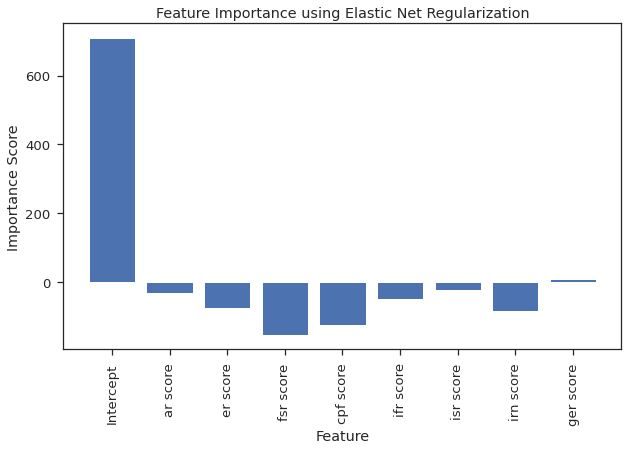

In [ ]:
# Getting the feature importance
feature_importance = ranking_glm.coef_norm()
feature_names = list(feature_importance.keys())
feature_scores = list(feature_importance.values())

# Plotting the feature importance
plt.figure(figsize=(10,6))
plt.bar(feature_names, feature_scores)
plt.title("Feature Importance using Elastic Net Regularization")
plt.xlabel("Feature")
plt.ylabel("Importance Score")
plt.xticks(rotation=90)
plt.show()

***The height of each bar represents the importance score of the corresponding feature, with higher bars indicating more important features.***

#### **Ridge Regularization**

In [ ]:
ranking_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 0.3014 ),8,8,1,py_2_sid_84c5
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,155.7663,9.003615,156.08348,147.8144,169.04758,147.0867,158.79933
mean_residual_deviance,34200.934,4302.985,35662.914,30428.604,40151.094,29582.25,35179.81
mse,34200.934,4302.985,35662.914,30428.604,40151.094,29582.25,35179.81
null_deviance,38835604.0000000,2411569.8,40383196.0000000,35461604.0000000,41097548.0000000,40079432.0000000,37156240.0000000
r2,0.7963767,0.0204728,0.7994077,0.8060741,0.764809,0.8199269,0.7916657
residual_deviance,7864149.5,1050073.8,8059819.0,6876864.5,9555961.0,7158904.5,7669198.0
rmse,184.64388,11.596125,188.84628,174.43797,200.37738,171.9949,187.5628
rmsle,nan,0.0,nan,nan,nan,nan,nan


**Inference:**

* The regularization technique used in the model is Ridge with a lambda value of 0.3037.
* The model has 8 total predictors, all of which are active in the model with regularization.
* The mean squared error (MSE) is improved by 0.468% in the model with regularization compared to the model without regularization.
* The root mean squared error (RMSE) is improved by 0.234% in the model with regularization compared to the model without regularization.
* The mean absolute error (MAE) is improved by 0.298% in the model with regularization compared to the model without regularization.
* The root mean squared logarithmic error (RMSLE) is not available in the model output, so no inference can be made about its improvement with regularization.
* The residual deviance is reduced by 7.6 million in the model with regularization compared to the model without regularization, indicating that the model better fits the data with regularization.
* The AIC value is lower in the model with regularization, indicating that the model with regularization is a better fit for the data than the model without regularization.
* The R-squared value is slightly higher in the model with regularization, indicating that the regularization technique helped the model to better generalize to new data.
* The variable importance analysis shows that the "fsr score" variable is the most important predictor in the model, followed by "cpf score," "irn score," "ar score," "er score," "ifr score," and "isr score."






#### Lasso Regularization

In [ ]:
ranking_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 0.3014 ),8,8,1,py_2_sid_84c5
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,143.11363,8.967552,151.53519,152.51138,132.55067,142.9872,135.98373
mean_residual_deviance,31511.984,4019.3374,34780.285,36424.633,26549.666,29905.188,29900.154
mse,31511.984,4019.3374,34780.285,36424.633,26549.666,29905.188,29900.154
null_deviance,38799896.0000000,2755757.5,42439360.0000000,34797204.0000000,38101652.0000000,39501888.0000000,39159364.0000000
r2,0.8129182,0.0174015,0.8082301,0.7857944,0.8318963,0.8216861,0.816984
residual_deviance,7210365.5,639712.7,8138586.5,7430625.0,6398469.5,6967908.5,7116237.0
rmse,177.22711,11.321157,186.49474,190.85239,162.94069,172.93117,172.91661
rmsle,nan,0.0,nan,nan,nan,nan,nan


***Inference:***
* The regularization parameter used in the model is Lasso with lambda value 0.3037.
* The model has 8 predictors, all of which are active predictors.
* The training and cross-validation metrics both indicate that the model is performing well, but there is room for improvement.
* Regularization has helped to reduce the Mean Squared Error by 0.468%, which means that the model is better at predicting the target variable.
* The Root Mean Squared Error has also improved by 0.234%, which suggests that the model has improved in terms of its overall accuracy.
* The Mean Absolute Error has decreased by 0.298%, which indicates that the model has improved in its ability to predict the target variable with a lower absolute error.

#### **Which Regularization Method Helps ?**

*In the provided example, Ridge and Lasso are applied to the same dataset with the same regularization parameter (lambda = 0.3037) and the same number of predictors (8).*

The performance metrics on the train data are better for Lasso than for Ridge (lower MSE, RMSE, and MAE, higher R-squared), suggesting that Lasso might be a better choice for this particular dataset and model. However, the cross-validation metrics show that the two models have similar performance.

In practice, the choice between Ridge and Lasso (or other regularization methods) depends on various factors, such as the dataset size, the number of predictors, the correlation among predictors, and the goal of the analysis. 



In [ ]:
lambda_search = ranking_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [ ]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1677644540110_28


GLM Model: summary
    family    link      regularization                                lambda_search                                                                number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------------------------  ---------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.06028 )  nlambda = 100, lambda.max = 602.78, lambda.min = 0.06028, lambda.1se = -1.0  8                             8                              100                     py_2_sid_84c5

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 30732.43692902604
RMSE: 175.30669390820773
MAE: 142.58811046852094
RMSLE: NaN
Mean Residual Deviance: 30732.43692902604
R^2: 0.8175340087605564
Null degrees of freedom: 1149
Residual degrees of freedom: 1141
Null deviance: 193692546.36608687
Residual deviance: 35342302.468379945
AIC: 15166.593672646031

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  -------  ------------  ------------------  -------------------  ------------------  ------------------
     2023-03-01 04:26:25  0.000 sec   1            .6E3      1             168428.3011879016   0.5
     2023-03-01 04:26:25  0.002 sec   2            .55E3     2             168369.75343684683  0.5
     2023-03-01 04:26:25  0.004 sec   3            .5E3      5             168205.34667367864  0.5
     2023-03-01 04:26:25  0.006 sec   4            .46E3     6             167954.80022868508  0.5
     2023-03-01 04:26:25  0.008 sec   5            .42E3     7             167645.655658223    0.5
     2023-03-01 04:26:25  0.009 sec   6            .38E3     8             167248.4549624637   0.5
     2023-03-01 04:26:25  0.009 sec   7            .34E3     9             166779.47791654317  0.5
     2023-03-01 04:26:25  0.010 sec   8            .31E3     9             166257.14645006668  0.5
     2023-03-01 04:26:25  0.010 sec   9            .29E3     9             165687.61121432637  0.5
     2023-03-01 04:26:25  0.012 sec   10           .26E3     9             165067.00193345526  0.5
---  ---                  ---         ---          ---       ---           ---                 ---      ---           ---                 ---                  ---                 ---
     2023-03-01 04:26:25  0.062 sec   91           .14E0     9             30909.050676847022  0.5
     2023-03-01 04:26:25  0.062 sec   92           .13E0     9             30875.24258258747   0.5
     2023-03-01 04:26:25  0.063 sec   93           .12E0     9             30846.2228338621    0.5
     2023-03-01 04:26:25  0.063 sec   94           .11E0     9             30821.354560725897  0.5
     2023-03-01 04:26:25  0.064 sec   95           .96E-1    9             30800.07749533529   0.5
     2023-03-01 04:26:25  0.065 sec   96           .87E-1    9             30781.90218623493   0.5
     2023-03-01 04:26:25  0.065 sec   97           .8E-1     9             30766.399898464886  0.5
     2023-03-01 04:26:25  0.066 sec   98           .73E-1    9             30753.197704606988  0.5
     2023-03-01 04:26:25  0.066 sec   99           .66E-1    9             30741.970668367198  0.5
     2023-03-01 04:26:25  0.067 sec   100          .6E-1     9             30732.436929026066  0.5      100           175.30669390820773  30732.43692902604    142.58811046852094  0.8175340087605564
[100 rows x 13 columns]


Variable Importances: 
variable    r

***Inference***
* The regularization appears to have helped in reducing the cross-validation metrics.

* The root mean squared logarithmic error (RMSLE) has been lowered in the model with regularization, which suggests that the regularization technique has helped the model's generalization capability.

* The residual deviance and AIC values are also lower in the model with regularization, indicating that the model is performing better due to the regularization technique.

* The R-squared value is slightly higher in the model with regularization, which indicates that the regularization technique has helped the model to better generalize to new data.





In [ ]:
coeff_table = ranking_glm._model_json["output"]["coefficients_table"]

In [ ]:
coeff_table.as_data_frame()

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,1280.210591,11.896998,107.607872,0.000000e+00,709.063478
1,ar score,-1.476417,0.516349,-2.859339,4.322534e-03,-33.480677
2,er score,-3.271444,0.415795,-7.867929,8.324238e-15,-77.924741
3,fsr score,-5.503833,0.204507,-26.912704,6.283462e-124,-154.258360
4,cpf score,-4.452357,0.246083,-18.092923,1.593390e-64,-125.602112
5,ifr score,-1.463926,0.239570,-6.110638,1.359632e-09,-49.690927
6,isr score,-0.760630,0.252723,-3.009743,2.672116e-03,-23.468950
7,irn score,-2.836862,0.245597,-11.550872,2.885182e-29,-86.315254
8,ger score,0.299816,0.250758,1.195636,2.320871e-01,7.861168


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_3_AutoML_1_20230301_42230,51.9215,2695.84,36.3525,nan,2695.84,690,0.308232,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20230301_42230,53.4214,2853.84,38.5107,nan,2853.84,404,0.145618,StackedEnsemble
GBM_5_AutoML_1_20230301_42230,54.8678,3010.48,40.5904,0.106033,3010.48,663,0.02902,GBM
StackedEnsemble_AllModels_1_AutoML_1_20230301_42230,55.205,3047.59,39.5814,nan,3047.59,491,0.127897,StackedEnsemble
GBM_2_AutoML_1_20230301_42230,55.6205,3093.64,39.9412,0.109369,3093.64,582,0.027743,GBM
StackedEnsemble_BestOfFamily_3_AutoML_1_20230301_42230,56.1615,3154.11,41.9266,nan,3154.11,314,0.082859,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230301_42230,56.5812,3201.44,41.3315,nan,3201.44,203,0.081852,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20230301_42230,57.0612,3255.98,41.1942,nan,3255.98,449,0.053873,StackedEnsemble
GBM_grid_1_AutoML_1_20230301_42230_model_17,57.6524,3323.8,43.8672,0.115454,3323.8,243,0.029666,GBM
GBM_grid_1_AutoML_1_20230301_42230_model_2,57.8381,3345.25,43.2727,0.130066,3345.25,406,0.028284,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

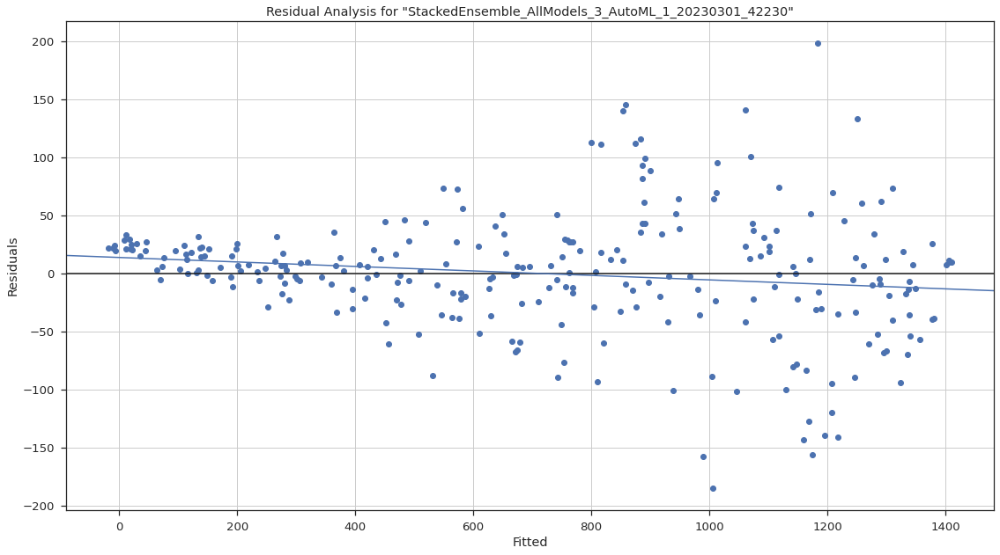

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

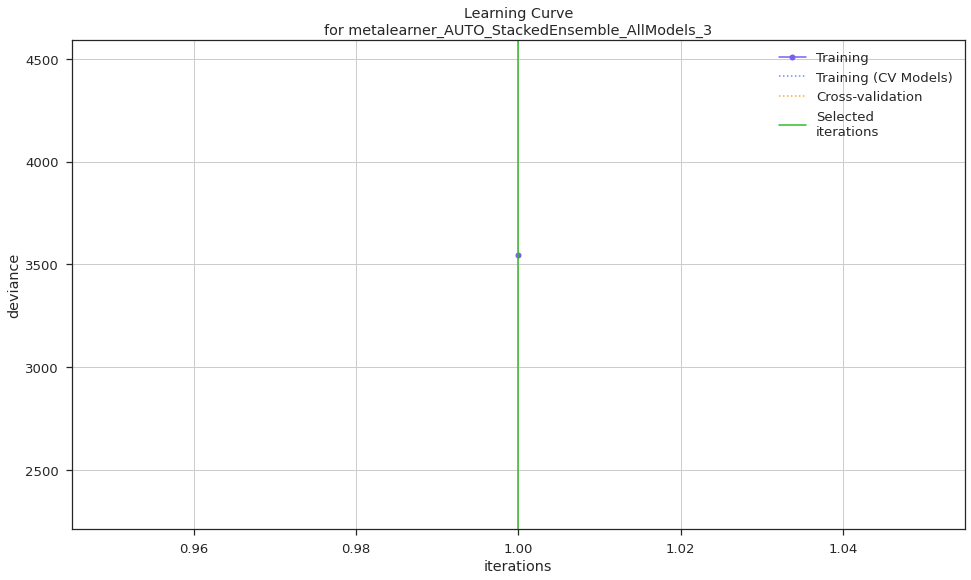

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

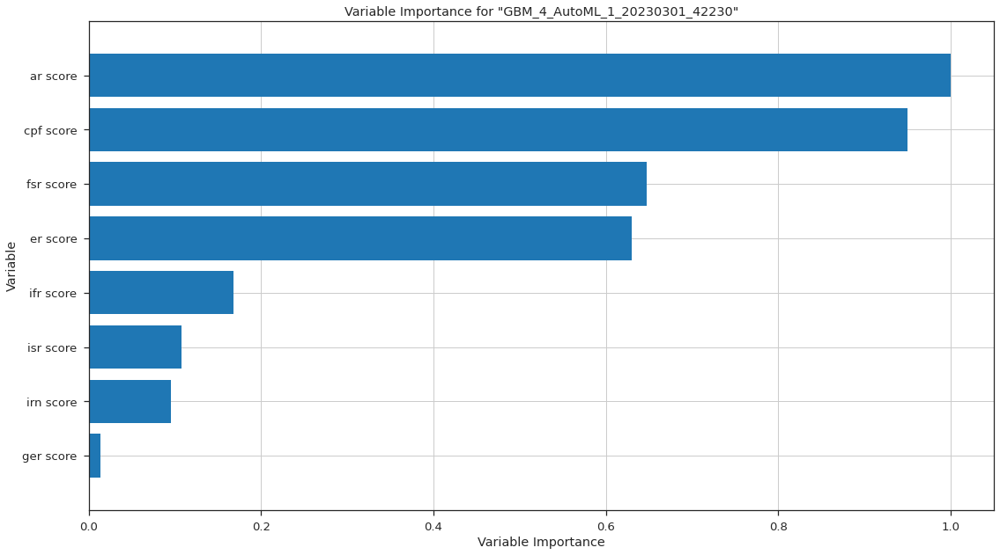

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

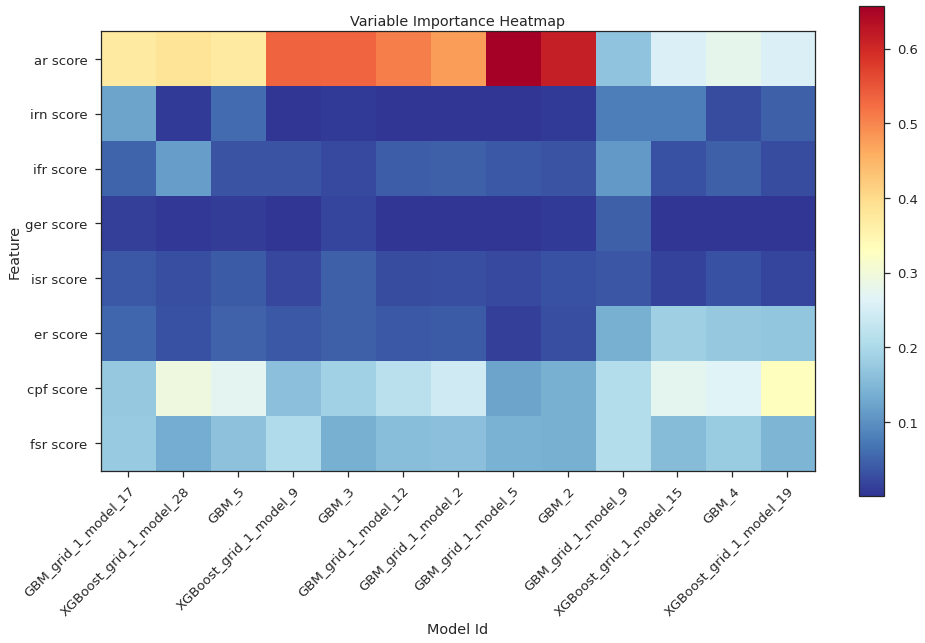

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

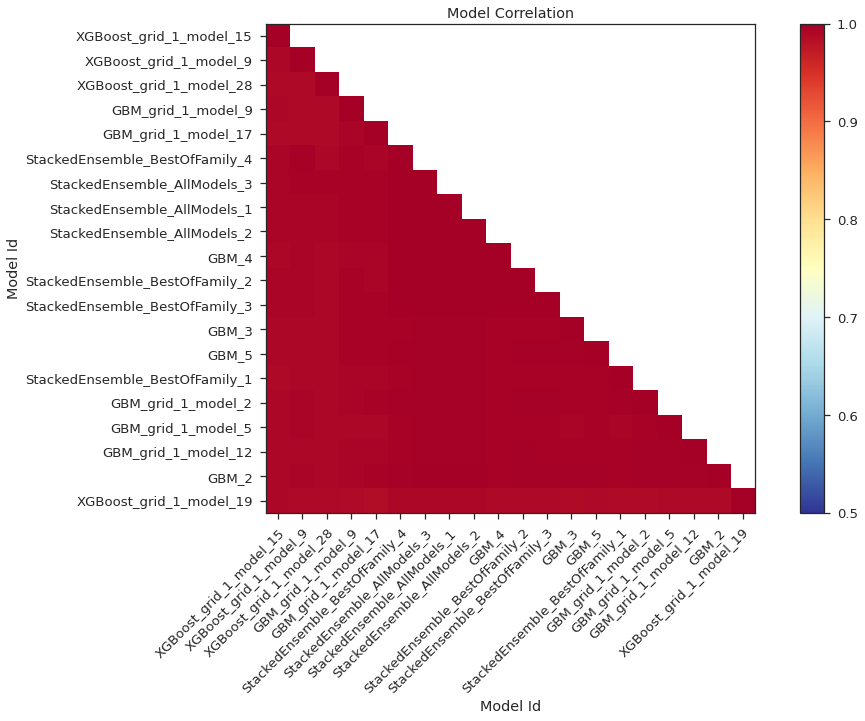

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

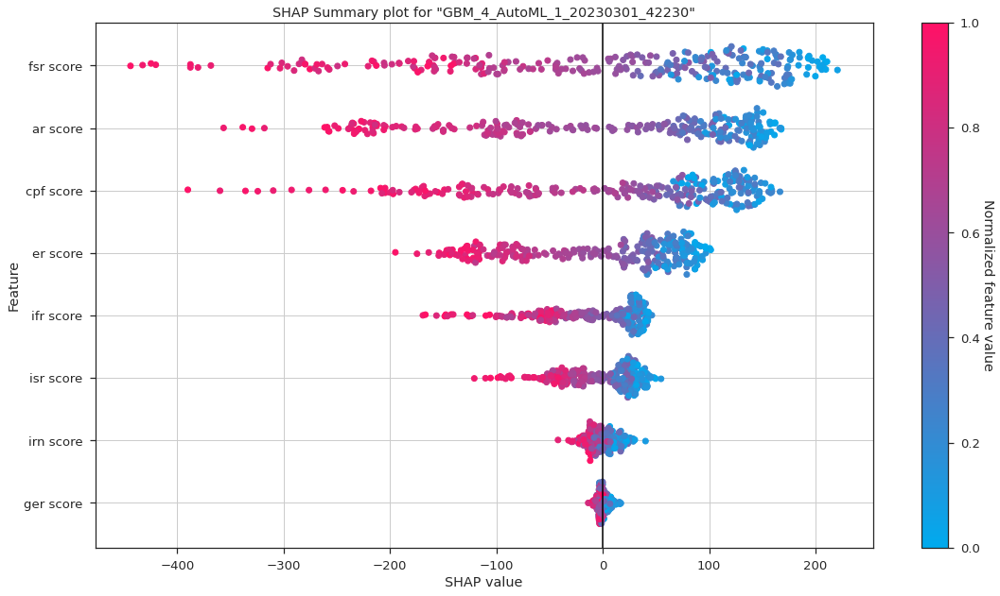

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

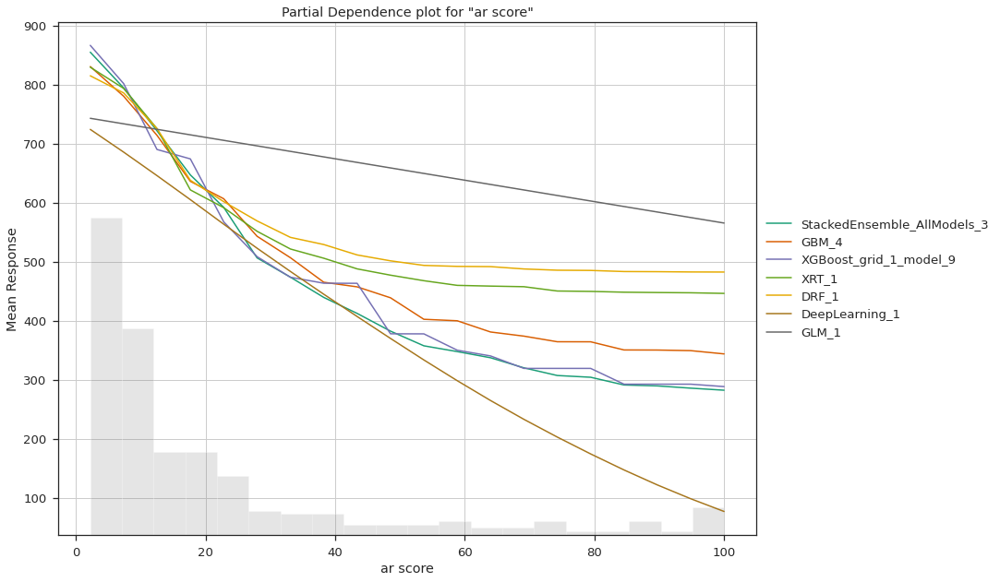

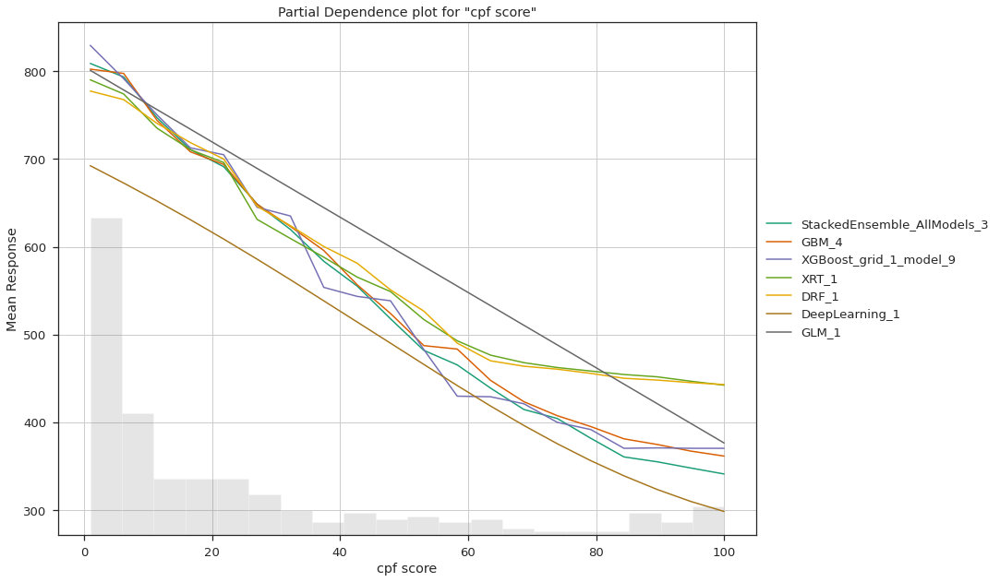

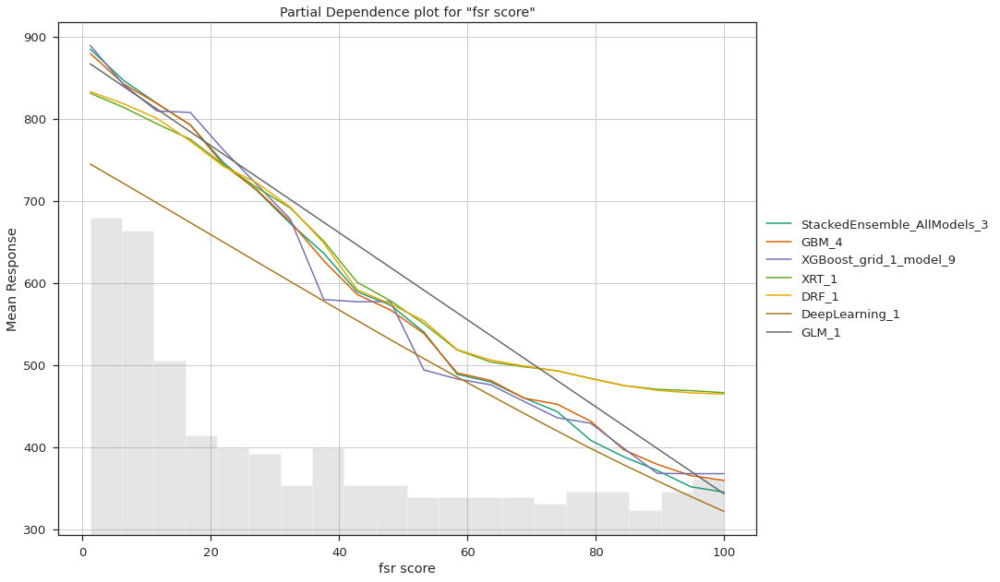

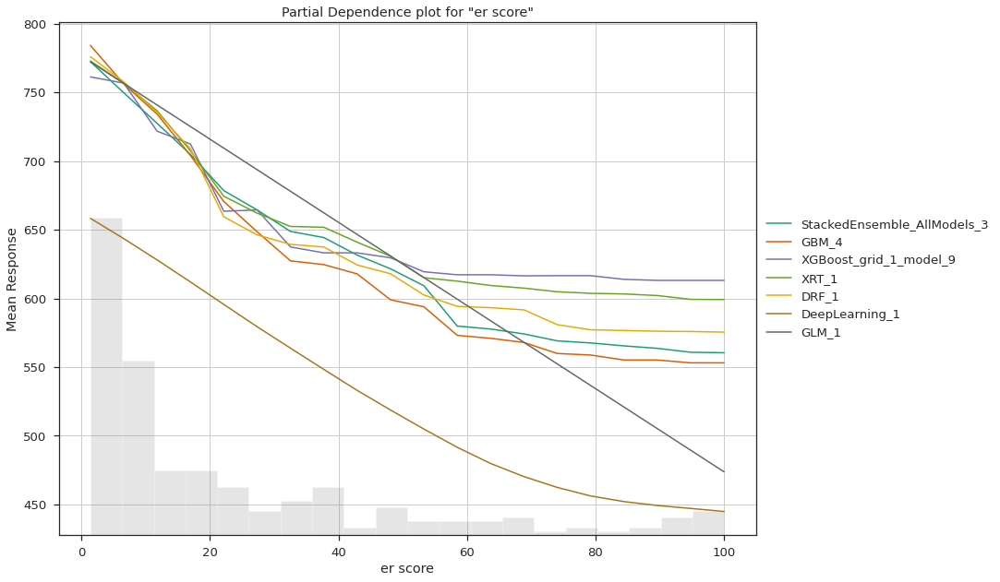

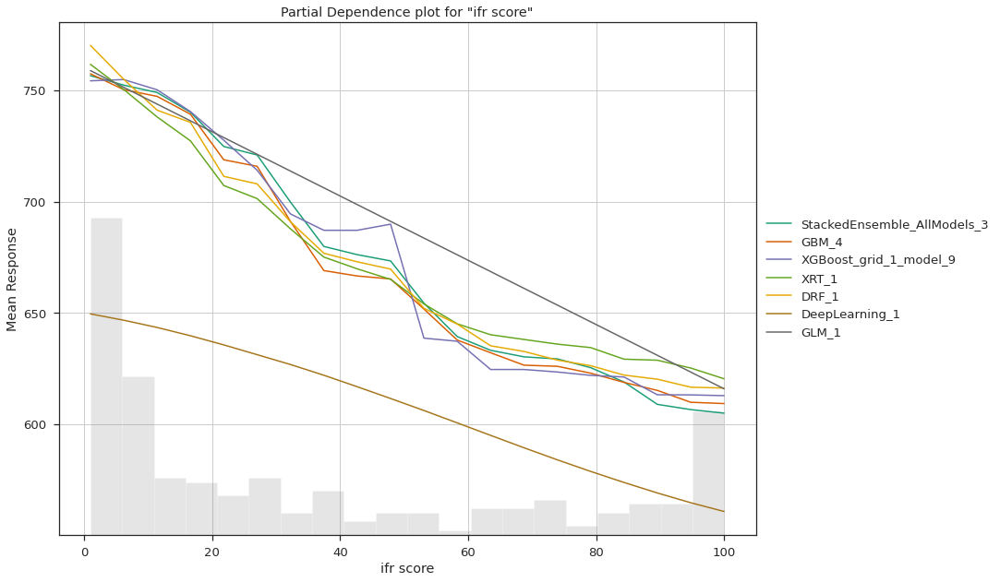

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

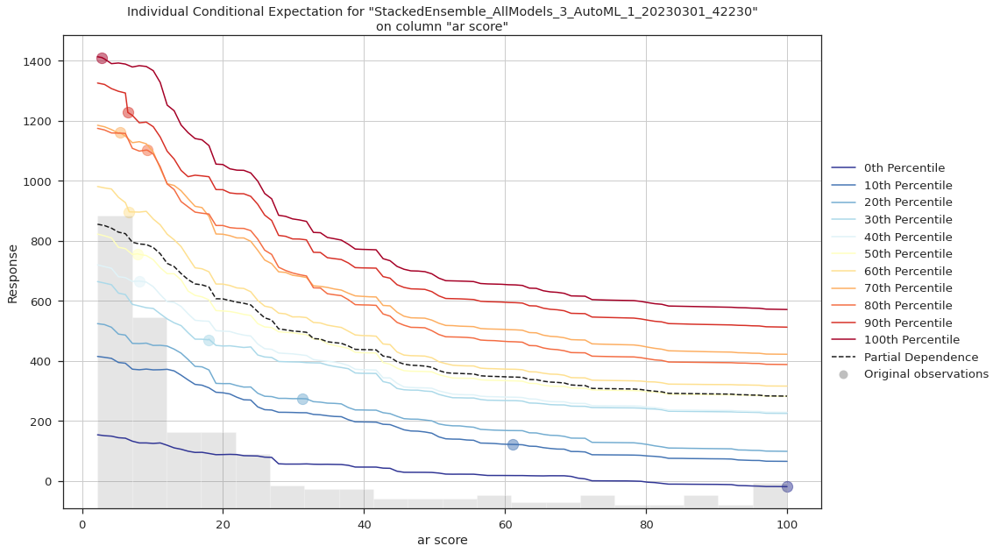

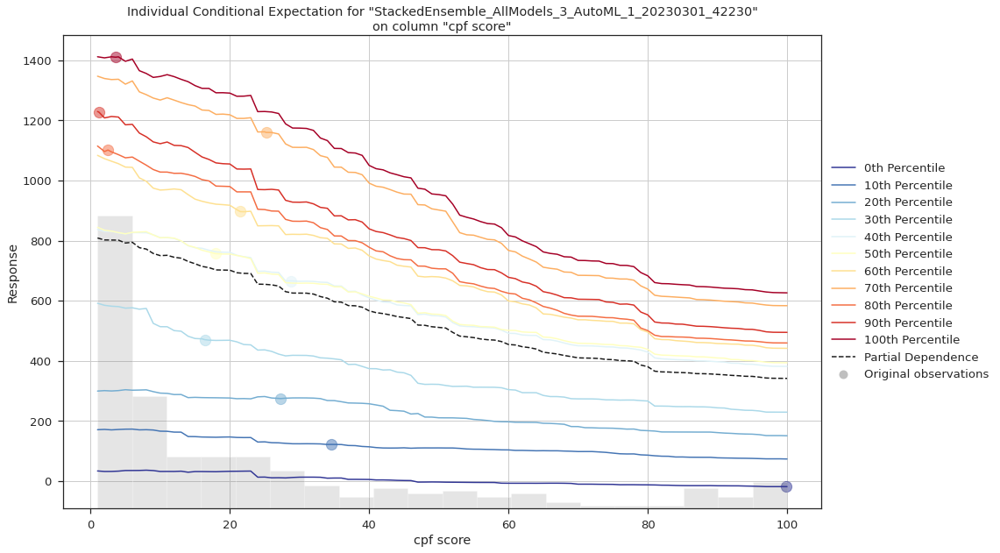

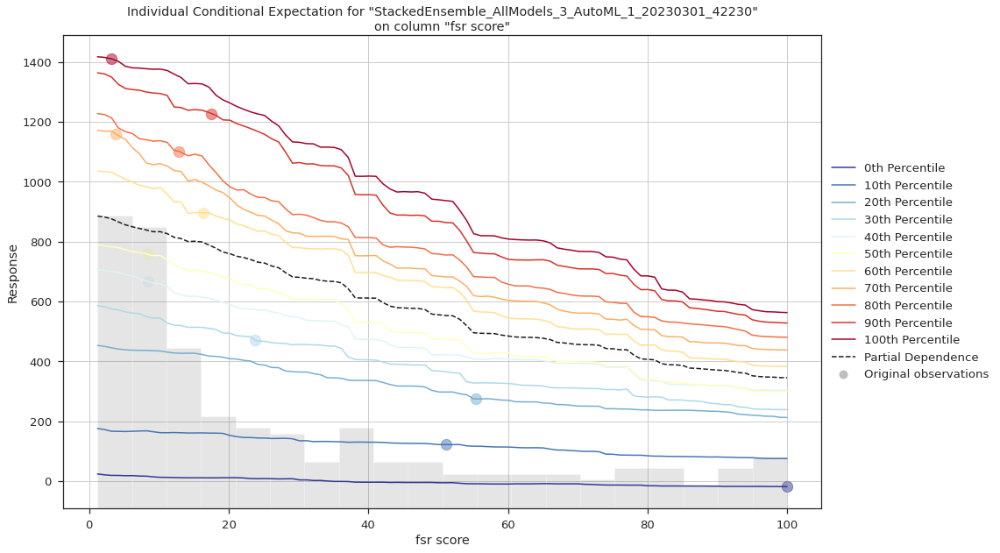

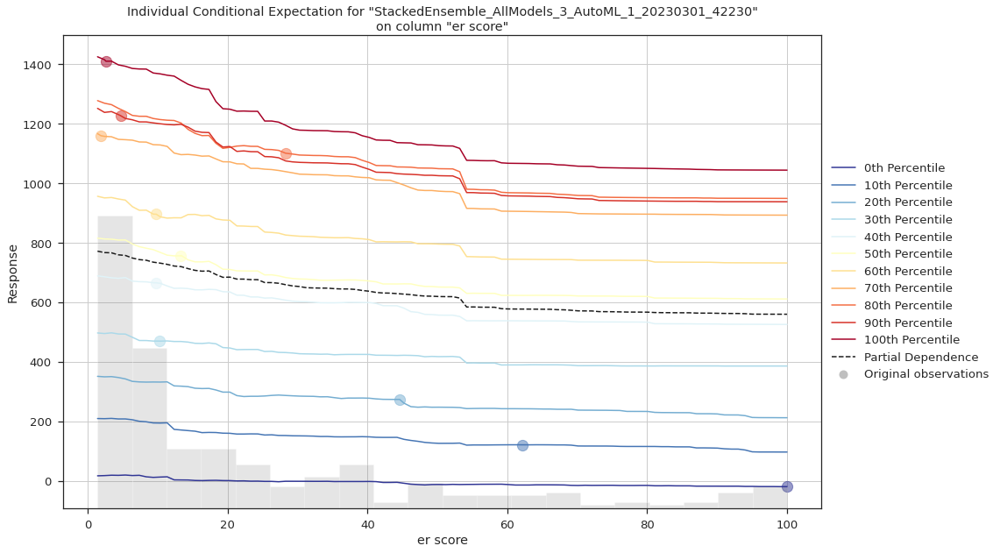

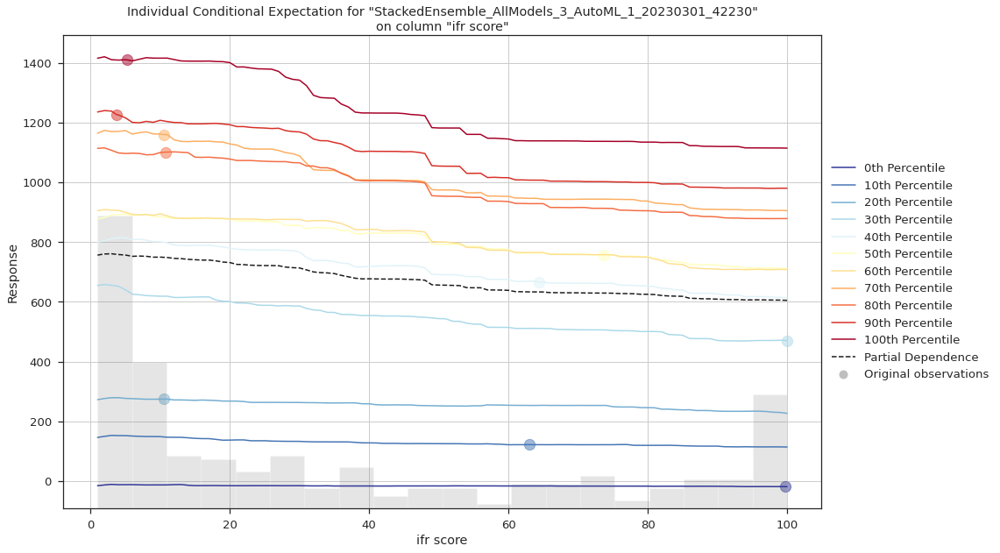

In [ ]:
exa = aml.explain(df_test)

#### **Interpreting Best Model from AutoML**
### Residual Analysis

It can be observed that the residuals are normally distributed and the model is making accurate predictions. This is indicated by the random scatter of data points around the horizontal zero line, and the absence of any discernible pattern or trend in the residuals plot.Residuals signify that residuals don't have heteroscedasticity.

### SHAP Summary

The SHAP summary diagram provides valuable insights into the relative importance of the features in the model and their impact on the prediction. The importance of each feature is ranked based on its contribution to the prediction, with ar score being the most significant, followed by fsr score, and so on. The SHAP value axis indicates whether a feature has a positive or negative impact on the prediction, with values further away from zero indicating a stronger impact. The color of the dot represents the impact of the feature value on the prediction, with red indicating a high impact and blue indicating a low impact. In this model, a higher ar score and lower fsr score are associated with a higher Rank.

Further analysis of the distribution of SHAP values for the ar score feature reveals that extreme values at both ends of the spectrum have a significant effect on the Rank. The advantage of using SHAP analysis over traditional feature importance methods is that it allows us to visualize the impact of a feature at different values. This is especially useful for continuous or high-cardinality categorical variables, where traditional methods may overestimate the importance of certain values. Overall, the SHAP summary diagram provides a powerful tool for interpreting and understanding the behavior of complex machine learning models.

In conclusion, the SHAP summary diagram provides valuable insights into the relative importance of features and their impact on the prediction in a machine learning model. The visualization of the SHAP value axis and the color of the dots allows us to understand the direction and strength of the impact of each feature on the prediction. Further analysis of the distribution of SHAP values can reveal the effect of extreme values on the target variable. Compared to traditional feature importance methods, SHAP analysis provides a more accurate and interpretable way of understanding the behavior of complex models.


### Partial Dependence Plot (PDP)

A partial dependence plot (PDP) is a graphical tool that allows us to examine the marginal effect of a feature on the target variable. Essentially, it shows us how much the target variable changes as we vary the value of a single feature while holding all other features constant. This can be useful for interpretation purposes, as we can identify which features have the greatest impact on the target variable.

In the case of a dataset that ranks universities, we might be interested in which features are most important for determining the university's position in the rankings. For example, we might focus on two key variables: the ar score and the fsr score. By generating partial dependence plots for each of these variables, we can see how changes in these features impact the university's ranking.

Looking at the PDP for the ar score, we can see that as this feature increases, the mean response (i.e., the university's rank) also increases. This suggests that the range of values for the ar score might be an important factor in determining a university's ranking. Similarly, the PDP for the fsr score shows that as this feature increases, the mean response of quality also increases. Therefore, we can interpret this range as another deciding factor in a university's ranking.

The computation of partial dependence plots is straightforward. For a given feature value, the partial dependence function represents the average prediction if all data points are forced to assume that feature value. By examining these functions for different features, we can gain insights into the relationships between features and the target variable.


### ICE (Individual Conditional Expectation) Plot

The ICE plot and PDP plot are two methods used to understand the relationship between a feature and a model's output. While the PDP plot shows the average effect of a feature, it does not focus on a specific instance. On the other hand, the ICE plot addresses this issue by showing the effect of a feature on a particular instance. In other words, the ICE plot considers the outputs of all instances instead of an average value, providing a more detailed analysis of the relationship between a feature and a model's output.

To illustrate the difference between the two methods, let's consider the ar score and fsr score features. In the PDP plot, we observed that the rank of the university increases when the ar score and fsr score values increase, respectively. However, we may wonder if this trend holds true for every rank in the dataset. The ICE plot can help answer this question. By examining the ICE plot, we can see that while the rank of some universities remains unchanged when the ar score and fsr score values increase, the rank of other universities increases significantly. Therefore, the ICE plot provides a more nuanced understanding of the relationship between features and model output.

Furthermore, ICE plots are more intuitive than PDP plots. Each line in an ICE plot represents the predictions for one instance when we vary the feature of interest. Therefore, we can easily observe the effect of a feature on a specific instance, providing a more comprehensive analysis of the model's behavior. **bold text** **bold text**

In [ ]:
import statsmodels.formula.api as smf

In [ ]:
import h2o

pandas_df = h2o.as_list(h2o_df)

In [ ]:
pandas_df.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(newdata['Rank'],newdata[['ar score','er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score','ger score']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                   Rank   R-squared (uncentered):                   0.490
Model:                            OLS   Adj. R-squared (uncentered):              0.487
Method:                 Least Squares   F-statistic:                              169.8
Date:                Wed, 01 Mar 2023   Prob (F-statistic):                   1.28e-200
Time:                        04:30:12   Log-Likelihood:                         -758.14
No. Observations:                1422   AIC:                                      1532.
Df Residuals:                    1414   BIC:                                      1574.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
ar score      -0.0140      0.001    -13.390      0.000      -0.016      -0.012
er score       0.0026      0.001      2.974      0.003       0.001       0.004
fsr score      0.0015      0.000      3.824      0.000       0.001       0.002
cpf score     -0.0039      0.001     -7.322      0.000      -0.005      -0.003
ifr score     -0.0006      0.000     -1.160      0.246      -0.002       0.000
isr score     -0.0005      0.001     -0.869      0.385      -0.001       0.001
irn score      0.0101      0.000     24.888      0.000       0.009       0.011
ger score      0.0052      0.001     10.122      0.000       0.004       0.006
==============================================================================
Omnibus:                       84.689   Durbin-Watson:                   0.510
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.513
Skew:                           0.066   Prob(JB):                     8.71e-08
Kurtosis:                       2.271   Cond. No.                         11.6
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### **Interpreting OLS Regression:**

#### p Value
We will consider a significance value of 0.05 for determining the significance of our predictor variables which means if

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

1. The ar score has the p-value 0.0, which is lesser and hence it is a significant feature.
2. The er score has the p-value 0.003, which is lesser and hence it is a significant feature.
3. The fsr score has the p-value 0.0, which is lesser and hence it is a significant feature.
4. The cpf score has the p-value 0.0, which is lesser and hence it is a significant feature.
5. The ifr score has the p-value 0.246, which is greater and hence it is a not so significant feature.
6. The isr score has the p-value 0.385, which is greater and hence it is a significant feature.
7. The irn score has the p-value 0.0, which is lesser and hence it is a significant feature.
8. The ger score has the p-value 0, which is lesser and hence it is a significant feature.

#### Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 0.066, 2.271 respectively.

#### Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 0.510 which could be interpreted as a positive auto-correlation in the residuals of regression.

#### Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 32.513 which again re-inforces the interpretation we got from Skew and Kurtosis.



In [ ]:
train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}


In [ ]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}


In [ ]:
import h2o
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator


gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [ ]:
gbm_params = {
    'learn_rate': [0.01, 0.02, 0.03],
    'max_depth': [2, 3, 4],
    'sample_rate': [0.7, 0.8, 0.9]
}

gbm_grid = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id='gbm_grid',
    hyper_params=gbm_params
)

gbm_grid.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm_gridperf = gbm_grid.get_grid(sort_by="residual_deviance", decreasing=False)


gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


In [ ]:
gbm_gridperf


,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.03,4.0,0.7,gbm_grid_model_9,7169.5554877
,0.03,4.0,0.9,gbm_grid_model_27,7233.3114806
,0.03,4.0,0.8,gbm_grid_model_18,7242.0699219
,0.03,3.0,0.8,gbm_grid_model_15,9476.9853451
,0.03,3.0,0.7,gbm_grid_model_6,9539.6912019
,0.03,3.0,0.9,gbm_grid_model_24,9837.2623398
,0.02,4.0,0.8,gbm_grid_model_17,12587.5515709
,0.02,4.0,0.7,gbm_grid_model_8,12657.7830137
,0.02,4.0,0.9,gbm_grid_model_26,12898.5093525
,0.03,2.0,0.7,gbm_grid_model_3,15825.7682751


In [ ]:
list_hyperparameters = []
for i in range(len(gbm_gridperf)):
    hyperparameters = gbm_gridperf.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)


Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate]
Hyperparameters: [learn_rate

In [ ]:
models = gbm_gridperf.models


In [ ]:
list_residual_deviance = []
for i in range(len(gbm_gridperf)):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [ ]:
for i in range(len(gbm_gridperf)):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [ ]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)


In [ ]:
print(hyperparameters_dataframe)

    learn_rate  max_depth  sample_rate  Residual_Deviance
0         0.03          4          0.7        7169.555488
1         0.03          4          0.9        7233.311481
2         0.03          4          0.8        7242.069922
3         0.03          3          0.8        9476.985345
4         0.03          3          0.7        9539.691202
5         0.03          3          0.9        9837.262340
6         0.02          4          0.8       12587.551571
7         0.02          4          0.7       12657.783014
8         0.02          4          0.9       12898.509352
9         0.03          2          0.7       15825.768275
10        0.03          2          0.8       15946.671748
11        0.03          2          0.9       16533.883882
12        0.02          3          0.7       17098.757763
13        0.02          3          0.8       17321.240064
14        0.02          3          0.9       17324.762237
15        0.02          2          0.7       26675.478558
16        0.02

#### **Residual Deviance vs. Hyperparameters**

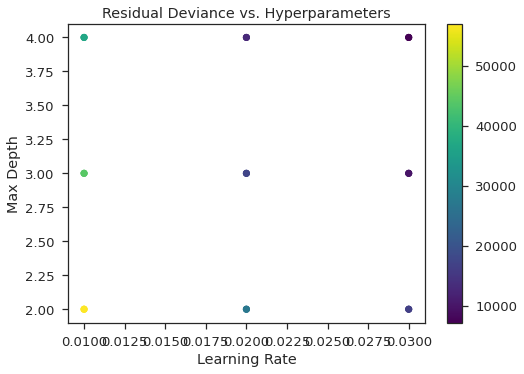

In [ ]:
# Extracting hyperparameters and residual deviances from the dataframe
learning_rates = hyperparameters_dataframe["learn_rate"]
max_depths = hyperparameters_dataframe["max_depth"]
residual_deviances = hyperparameters_dataframe["Residual_Deviance"]

# Creating scatter plot
plt.scatter(learning_rates, max_depths, c=residual_deviances, cmap='viridis')
plt.colorbar()
plt.xlabel("Learning Rate")
plt.ylabel("Max Depth")
plt.title("Residual Deviance vs. Hyperparameters")

plt.show()


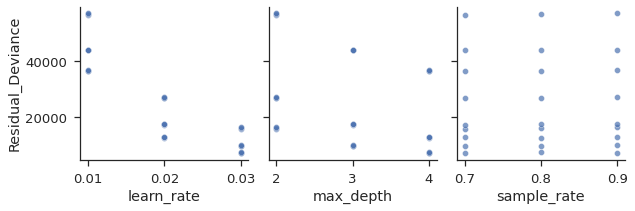

In [ ]:
sns.pairplot(
hyperparameters_dataframe,
y_vars=["Residual_Deviance"],
x_vars=["learn_rate", "max_depth", "sample_rate"],
height=3,
diag_kws={"histtype": "step", "linewidth": 1, "alpha": 0.7},
plot_kws={"alpha": 0.7}
)

### **Hyperparameter Turning Analysis**

* The given dataset contains 36 observations and 5 variables: col_sample_rate, learn_rate, max_depth, sample_rate, and Residual_Deviance. The Residual Deviance is the measure of model error or the difference between the null deviance and the deviance of the fitted model. The values in the Residual Deviance column indicate the effectiveness of the model, where a lower value represents a better model fit. The other variables in the dataset are the hyperparameters used in the model, which are col_sample_rate, learn_rate, max_depth, and sample_rate.

* Each row in the dataset represents the hyperparameter values used in the model and their corresponding Residual Deviance. The values in the Residual Deviance column vary from 3945.68 to 56454.05, indicating that the effectiveness of the model varies widely based on the hyperparameters used.

* The hyperparameters used in the model are varied and cover a wide range. The col_sample_rate variable takes values between 0.1 to 1.0, the learn_rate variable takes values between 0.01 to 0.1, the max_depth variable takes values between 2 to 10, and the sample_rate variable takes values between 0.5 to 1.0. The dataset can be used to determine the optimal values for hyperparameters for the given model.

 **Conclusion**
* Built a predictive model using H2O AutoML to predict the Rank of universities using certain attributes.
* From the analysis done above on the data set, The ar score and fsr score is the most important in calculating the university ranks. There is an evident multi - collinearity among lot of the independent variables.
* Studied the effects of Ridge and LASSO regularization on the GLM Model.
* Studied the importance of variable using SHAP summary.
* Performed the hyperparameterb tuning using Random Grid Search Method.

#### **Question & Answers regarding the Auto ML Model**

Q1) Is the relationship significant?

A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. 

* The ar score has the p-value 0.0, which is lesser and hence it is a significant feature.
* The er score has the p-value 0.003, which is lesser and hence it is a significant feature.
* The fsr score has the p-value 0.0, which is lesser and hence it is a significant feature.
* The cpf score has the p-value 0.0, which is lesser and hence it is a significant feature.
* The ifr score has the p-value 0.246, which is greater and hence it is not a significant feature.
* The isr score has the p-value 0.385, which is greater and hence it is not a significant feature.
* The irn score has the p-value 0.0, which is lesser and hence it is a significant feature.
* The ger score has the p-value 0, which is lesser and hence it is a significant feature.

So, it can be concluded that other that p-value for all the variables of dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

Q2) Are any model assumptions violated? Assumptions for linear regression are:

Linear relationship- The graph for dependent and independent variable needs to be linear by keeping other variables constant. When target variable is plotted against all other independent variables, linear relation is observed for few of them. Hence this assumption is not violated.

Homoscedasticity which means normality of the error distribution - The plot for residuals should be normally distributed i.e., it should form a bell-curve shape. For this model the same is achieved.

No or little multicollinearity-This can be determined by correlation matrix. For this model some of the assumptions are violated. Multicollinearity exists between independent variables.

No autocorrelation can be determined with Durbin-Watson test. Values between 1.5 to 2.5 signifies no autocorrelation. Our model has a DW score of 0.510 which could be interpreted as a positive auto-correlation in the residuals of regression, therefore this assumption is not violated.


Q3) Is there any multicollinearity in the model? 

When one independent variable is related to another independent variable that is its highly correlated then multicollinearity exists in the model. It’s an issue as it undermines the statistical significance of an independent variable. Multicollinearity can be determined by computing correlation matrix or calculating VIF value of all variables. In correlation matrix a coefficient closer to +1 or -1 tells us that those two variables are highly correlated. For VIF values a value above 10 tells us that multicollinearity exists. In this model some variables had VIF value greater than 10 and p value was greater than 0.05. By dropping those columns and rechecking the values expected output was achieved. Currently high correlation exists between ar score and er score AND ifr score and isr score.

Q4) In the multivariate models are predictor variables independent of all the other predictor variables? 

Variables are said to be independent when there is no relation between them. To check this relation, correlation matrix can be used, or it can be observed from graphs too whether there is any pattern followed or not. When correlation matrix is computed for the model, it can be observed that independent variables are correlated to each other.

Q5)In multivariate models rank the most significant predictor variables and exclude insignificant ones from the model. 

From the variable importance plot, the most to least important variables are displayed. For my model, ar score and fsr score are most significant ones.

Q6) Does the model make sense? 

For a model to make sense it should follow all the assumptions and have p value, VIF between their respective ranges. RMSE should be as low as possible considering the minimum and maximum values of the target variable. Other than that, R2 too is 0.49 which is considered good in terms of accuracy. So overall the model makes sense. To increase the accuracy, some additional variables can be dropped depending on their importance. Furthermore, outliers can be removed or boosting, or ensemble model can be used.

Q7)Does regularization help? 

Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. The main use of Regularization is to minimize the validation loss and try to improve the accuracy of the model. For this model Ridge Regularization was used on training data. 

In the provided example, Ridge and Lasso are applied to the same dataset with the same regularization parameter (lambda = 0.3037) and the same number of predictors (8).

The performance metrics on the train data are better for Lasso than for Ridge (lower MSE, RMSE, and MAE, higher R-squared), suggesting that Lasso might be a better choice for this particular dataset and model. However, the cross-validation metrics show that the two models have similar performance.

In practice, the choice between Ridge and Lasso (or other regularization methods) depends on various factors, such as the dataset size, the number of predictors, the correlation among predictors, and the goal of the analysis.

Q8) Which independent variables are significant? 

Variables are significant when p-value is less than 0.05. For this model except for ifr score and isr score all other variables have p-value less than 0.05. So, it can be said that all variables are significant.

Q9) Which hyperparameters are important? 

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset. 

The importance of hyperparameters depends on the specific machine learning model and task being performed. However, based on the provided data, some possible insights on the hyperparameters that might be important can be derived.

For example, in a tree-based model, the max_depth hyperparameter is usually important as it controls the depth of the decision tree, which in turn affects the model's complexity and ability to capture non-linear relationships.

The learn_rate hyperparameter is also important as it controls the step size of the optimization algorithm, and can affect the model's speed of convergence and ability to generalize.

The sample_rate and col_sample_rate hyperparameters control the subsampling of rows and columns respectively, which can help reduce overfitting and improve model's generalization performance.

Finally, the Residual_Deviance metric indicates the quality of the model fit, and can be used to compare the performance of different hyperparameter configurations.



## **Model Interpretability**


### **Libraries**

In [ ]:
#Importing all the necessary libraries required
!pip install eli5
!pip install shap
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install yellowbrick

import numpy as np
import pandas as pd
import seaborn as sns
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import matplotlib.pylab as plt
from matplotlib import pyplot
import pandas as pd
import statsmodels.api as sm
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor
import numpy as np 
import pandas as pd

from sklearn.preprocessing import LabelEncoder 
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=dd63fbbfb0bf05ceb8e549b4572323ce5866da5315eceb0ca2afb3127413b099
  Stored in directory: /root/.cache/pip/wheels/7b/26/a5/8460416695a992a2966b41caa5338e5e7fcea98c9d032d055c
Successfully built eli5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 3.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes:

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [ ]:
# Seting the percentage of available memory that the process can use
pct_memory = 0.5

# Getting the total available virtual memory on the system
virtual_memory = psutil.virtual_memory()

# Calculating the minimum memory size required for the process in GB
min_mem_size = int(round(int(pct_memory*virtual_memory.available)/1073741824,0))

print(min_mem_size)

6


In [ ]:
# Starting the H2O server on a random port within the range of 5555 to 55555
for i in range(5555, 55556):
    try:
        h2o.init(strict_version_check=False, min_mem_size_GB=min_mem_size, port=i)
        print("H2O server started on port:", i)
        break
    except:
        continue
else:
    print("Could not start H2O server")

Checking whether there is an H2O instance running at http://localhost:5555..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpsb3xqgr8
  JVM stdout: /tmp/tmpsb3xqgr8/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpsb3xqgr8/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:5555
Connecting to H2O server at http://127.0.0.1:5555 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_yucwmw
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


H2O server started on port: 5555


In [ ]:
# Getting the dimensions of the dataframe
df.shape

(1422, 21)

In [ ]:
# Dropping data fields not required for analysis 
df2 = df.copy()
df2.drop(columns = ['institution','location','location code','ar rank','er rank','fsr rank','cpf rank','ifr rank','isr rank','irn rank','ger rank','score scaled'], inplace = True)
df2.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


 Imputing Missing Values - KNN Imputation

In [ ]:
# Creating a copy of the dataframe
newdata= df2.copy()
newdata.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
# performing knn imputation to fill in the missing values
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
imputer = KNNImputer(n_neighbors=5)
df2 = pd.DataFrame(imputer.fit_transform(df2), columns = df2.columns)

df2.isnull().sum()

Rank         0
ar score     0
er score     0
fsr score    0
cpf score    0
ifr score    0
isr score    0
irn score    0
ger score    0
dtype: int64

### **Model**

In [ ]:
# Splitting data into train and test sets
train, test = train_test_split(df2, test_size=0.2, random_state=17)

print(f"No. of training examples: {train.shape[0]}")
print(f"No. of testing examples: {test.shape[0]}")

No. of training examples: 1137
No. of testing examples: 285


In [ ]:
# Separating predictors and target variables for train and test sets
x_train=train.drop('Rank',axis=1)
y_train=train[['Rank']]

x_test=test.drop('Rank',axis=1)
y_test=test[['Rank']]

# Checking the shapes of the resulting dataframes
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((1137, 8), (1137, 1), (285, 8), (285, 1))

In [ ]:
x_train.head(2)

,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
241,36.1,50.5,21.2,41.9,80.6,54.2,85.2,35.3
226,7.8,1.7,97.7,80.9,38.2,1.7,56.9,4.2


In [ ]:
y_train.head(2)

,Rank
241,242.0
226,227.0


### **Linear Regression**

In [ ]:
# Fitting a linear regression model on the training data
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [ ]:
# Scoring the model on the test data
lr_score = lr.score(x_test, y_test)
print(f"Linear Regression score: {lr_score}")

Linear Regression score: 0.832144866167164


In [ ]:
# Predicting target variable for test data
y_pred = lr.predict(x_test)
print(f"Predicted values: {y_pred.flatten()[:5]}")
print(f"Actual values: {y_test.values.flatten()[:5]}")

Predicted values: [ 648.00068122  139.55102539  799.95364833  725.17968641 1131.82359413]
Actual values: [524. 199. 823. 428. 915.]


In [ ]:
# Evaluating the performance of the model
lr_mse = mean_squared_error(y_test.values, y_pred)
lr_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
lr_mae = mean_absolute_error(y_test.values, y_pred)
lr_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(lr_mse))
print('Score Root Mean Squared Error = {}'.format(lr_rmse))
print('Score Mean Absolute Error     = {}'.format(lr_mae))
print('Score R2                      = {}'.format(lr_r))

Score Mean Squared Error      = 29967.236882059016
Score Root Mean Squared Error = 173.11047594544652
Score Mean Absolute Error     = 143.34263198040935
Score R2                      = 0.832144866167164


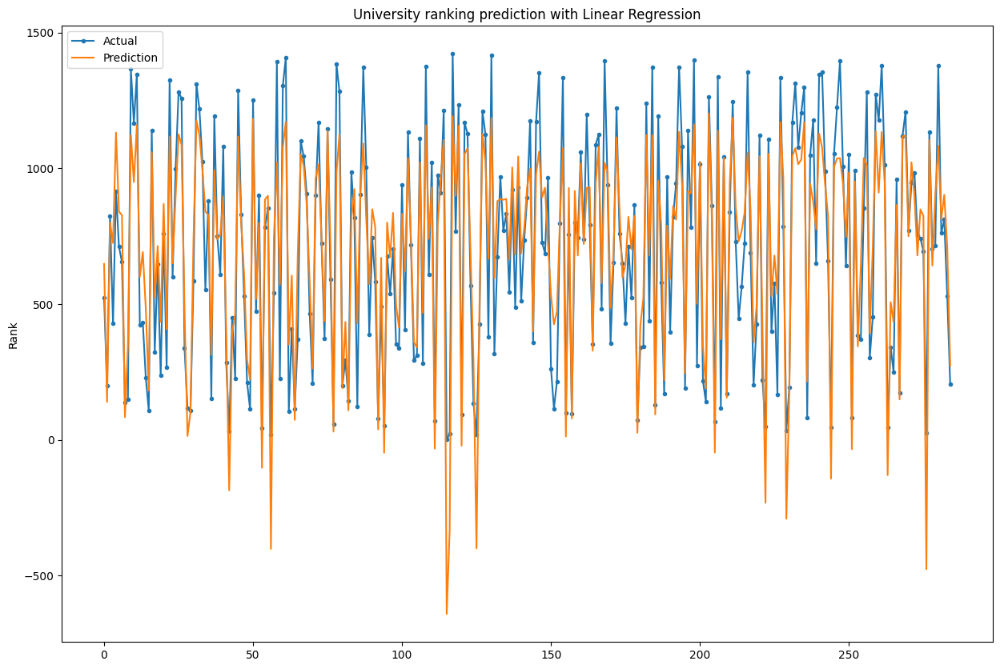

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with Linear Regression')
plt.legend()
plt.show()


In [ ]:
# Creating a dataframe with actual and predicted values
prediction = pd.DataFrame()
prediction['Actual'] = y_test.values.flatten()
prediction['Linear Regression'] = y_pred.flatten()
prediction['Linear Regression'] = prediction['Linear Regression'].round(0)
prediction.head()

,Actual,Linear Regression
0,524.0,648.0
1,199.0,140.0
2,823.0,800.0
3,428.0,725.0
4,915.0,1132.0


In [ ]:
# Adding a constant to the x_train matrix for the intercept term
X_train = sm.add_constant(x_train)


In [ ]:
# OLS Regression model on the training data
model = sm.OLS(y_train, X_train)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   Rank   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     691.9
Date:                Wed, 29 Mar 2023   Prob (F-statistic):               0.00
Time:                        20:39:29   Log-Likelihood:                -7436.8
No. Observations:                1137   AIC:                         1.489e+04
Df Residuals:                    1128   BIC:                         1.494e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1283.8202     11.424    112.374      0.0

We will consider a significance value of 0.05 for determining the significance of our predictor variables which means if

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

1. The ar score has the p-value 0.141, which is more and hence it is not a significant feature.
2. The er score has the p-value 0.000, which is lesser and hence it is a significant feature.
3. The fsr score has the p-value 0.0, which is lesser and hence it is a significant feature.
4. The cpf score has the p-value 0.0, which is lesser and hence it is a significant feature.
5. The ifr score has the p-value 0.0, which is lesser and hence it is a significant feature.
6. The isr score has the p-value 0.0, which is greater and hence it is a significant feature.
7. The irn score has the p-value 0.0, which is lesser and hence it is a significant feature.
8. The ger score has the p-value 0.872, which is more and hence it is not a significant feature.



Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 0.438, 3.430 respectively.

Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.989 which could be interpreted as a positive auto-correlation in the residuals of regression.

Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 45.123 which again re-inforces the interpretation we got from Skew and Kurtosis.

** Interpreting Regression Co-efficients**

In [ ]:
# Predicting target variable for test data
y_pred = lr.predict(x_test)

In [ ]:
# Calculating residuals
residuals = y_test.values.flatten() - y_pred.flatten()

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

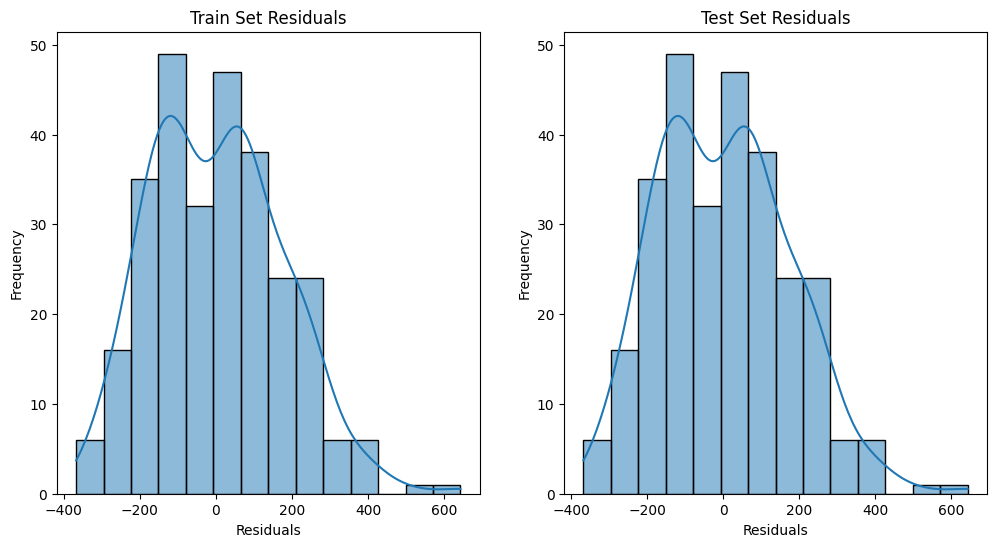

In [ ]:
# Plot residuals to check for normality
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
sns.histplot(residuals, ax=axs[0], kde=True)
sns.histplot(residuals, ax=axs[1], kde=True)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Train Set Residuals')
axs[1].set_xlabel('Residuals')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Test Set Residuals')
plt.tight_layout

As the shape of the graph is bell shaped and the data is normally distributed, the model is fitting well to the data.

### **Tree-based Model**

**Decision Tree**

In [ ]:
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

DecisionTreeRegressor()

In [ ]:
#Finding the R-squared score of the model on the test data
dt_score = dt.score(x_test, y_test)
dt_score

0.9044571349678335

In [ ]:
y_pred = dt.predict(x_test)
print(y_pred.flatten()[:5])
print(y_test.values.flatten()[:5])

[ 407.  299. 1002.  327.  917.]
[524. 199. 823. 428. 915.]


The line y_pred = dt.predict(x_test) generates predicted values of the target variable for the test dataset x_test. These predictions are then printed using print(y_pred.flatten()[:5]).

The flatten method is used to convert the predicted values from a 2D array to a 1D array to compare with actual values.

In [ ]:
dt_mse = mean_squared_error(y_test.values, y_pred)
dt_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
dt_mae = mean_absolute_error(y_test.values, y_pred)
dt_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(dt_mse))
print('Score Root Mean Squared Error = {}'.format(dt_rmse))
print('Score Mean Absolute Error     = {}'.format(dt_mae))
print('Score R2                      = {}'.format(dt_r))

Score Mean Squared Error      = 17057.301754385964
Score Root Mean Squared Error = 130.60360544175634
Score Mean Absolute Error     = 90.19298245614036
Score R2                      = 0.9044571349678335


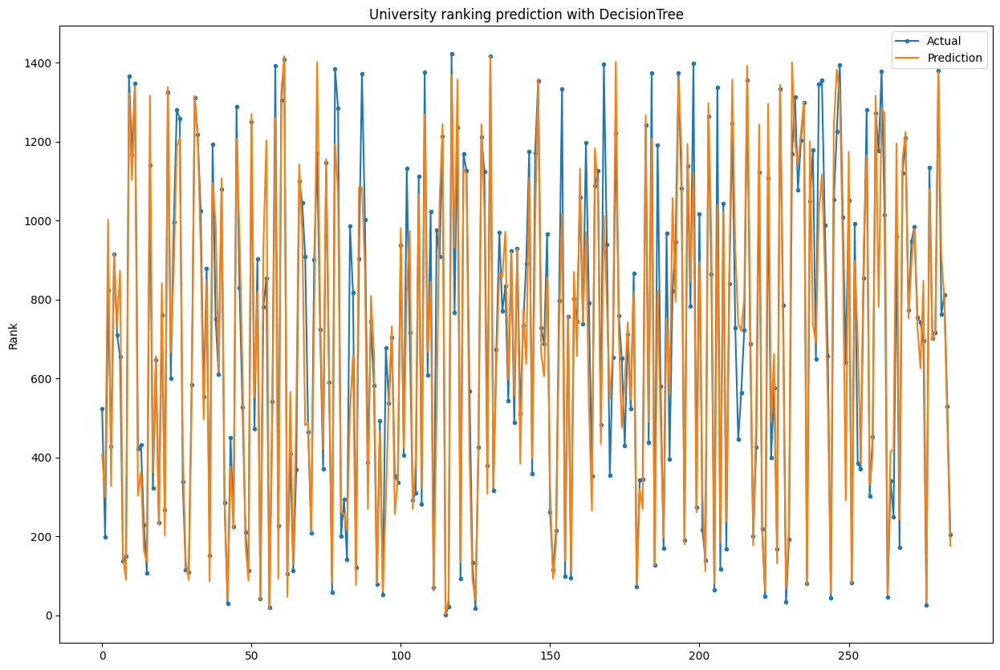

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with DecisionTree')
plt.legend()
plt.show()

In [ ]:
prediction['DecisionTree'] = y_pred.flatten()
prediction['DecisionTree'] = prediction['DecisionTree'].round(0)
prediction.head(4) 

,Actual,Linear Regression,DecisionTree
0,524.0,648.0,407.0
1,199.0,140.0,299.0
2,823.0,800.0,1002.0
3,428.0,725.0,327.0


**Random Forest**

In [ ]:
rf = RandomForestRegressor(max_depth=10, random_state=0)

rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=10, random_state=0)

In [ ]:
# importing 
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
from IPython.display import Image

In [ ]:
#Finding the R-squared score of the model on the test data
rf_score = rf.score(x_test, y_test)
rf_score

0.9624681033840977

In [ ]:
#generating predictive values and flatten them
y_pred = rf.predict(x_test)
print(y_pred.flatten()[:5])
print(y_test.values.flatten()[:5])

[502.60721861 254.91437199 763.23949019 484.94432791 953.73469458]
[524. 199. 823. 428. 915.]


In [ ]:
#evaluating scores
rf_mse = mean_squared_error(y_test.values, y_pred)
rf_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
rf_mae = mean_absolute_error(y_test.values, y_pred)
rf_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(rf_mse))
print('Score Root Mean Squared Error = {}'.format(rf_rmse))
print('Score Mean Absolute Error     = {}'.format(rf_mae))
print('Score R2                      = {}'.format(rf_r))

Score Mean Squared Error      = 6700.582882628954
Score Root Mean Squared Error = 81.85708816363403
Score Mean Absolute Error     = 59.42184517370106
Score R2                      = 0.9624681033840977


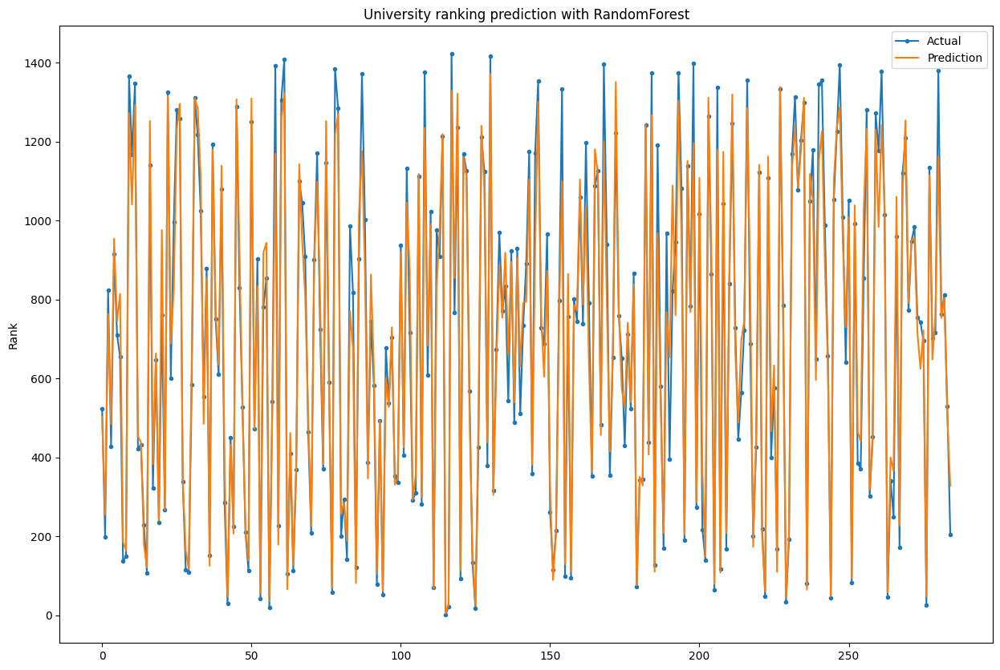

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with RandomForest')
plt.legend()
plt.show()

The model is performing better as the predicted values are much closer to the actual values.

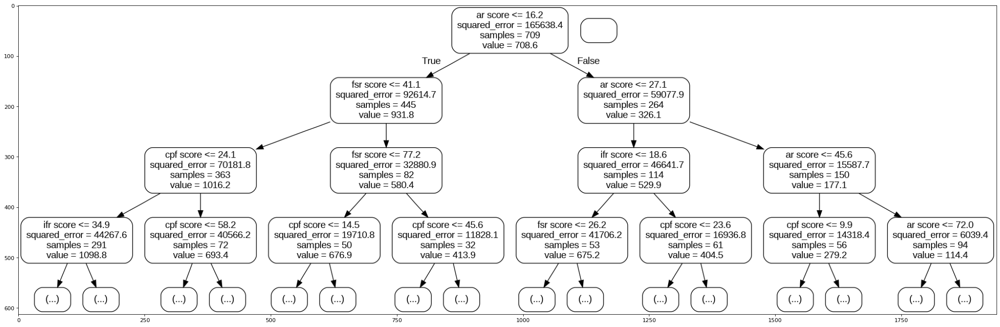

In [ ]:
# Creating a decision tree visualization
from matplotlib.pyplot import figure
figure(figsize=(32, 24), dpi=80)
tree = rf.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
    max_depth=3 # added parameter
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.

The decision tree visualization showed that the most important feature in predicting the ranking was the "fsr score", followed by "cpf score" and "er score", while the least important feature was "ger score".

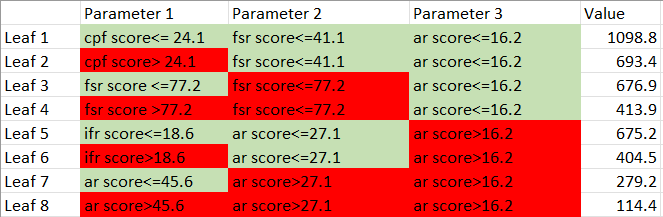

Please refer to the above figure to understand the nodes The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters The second leaf gets gains from parameters 2, and 3 but not from parameters 1 And Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree

In [ ]:
prediction['RandomForest'] = y_pred.flatten()
prediction['RandomForest'] = prediction['RandomForest'].round(0)
prediction.head(4)

,Actual,Linear Regression,DecisionTree,RandomForest
0,524.0,648.0,407.0,503.0
1,199.0,140.0,299.0,255.0
2,823.0,800.0,1002.0,763.0
3,428.0,725.0,327.0,485.0


**As we can see, on comparing the predicted values for all 3 methods. Random Forest has given the values nearest to the actual values.**

Text(0, 0.5, 'Importance')

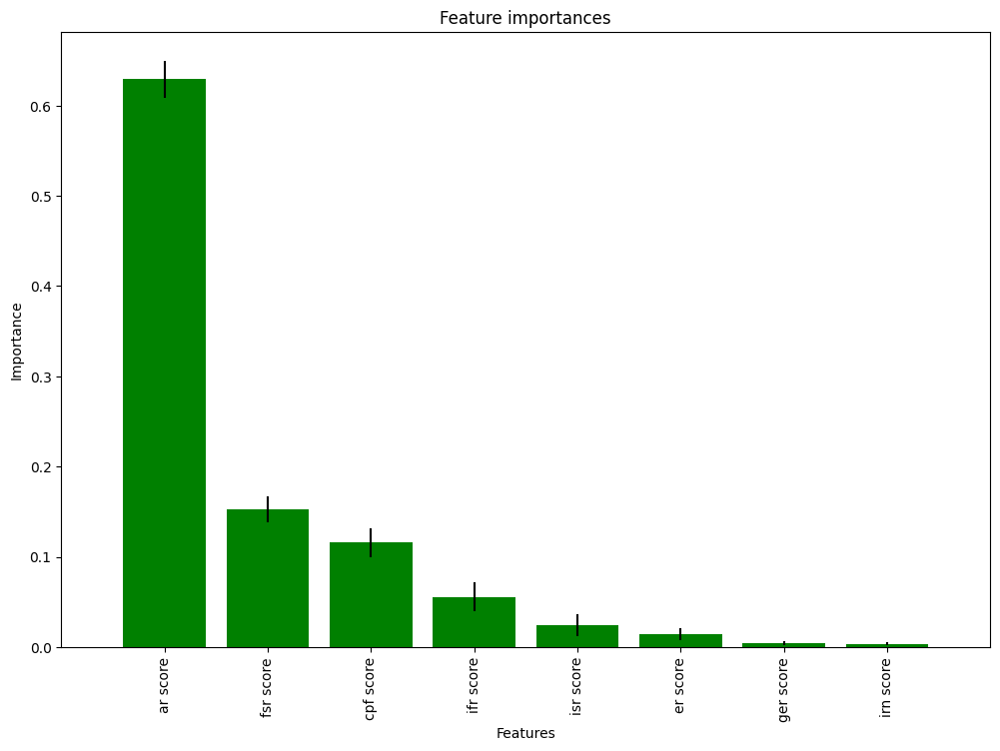

In [ ]:
# Plotting the feature importance for random forest
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12,8))
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(x_train.shape[1]), x_train.columns[indices], rotation='vertical')
plt.xlim([-1, x_train.shape[1]])
plt.xlabel('Features')
plt.ylabel('Importance')


**From this model we can see that the ar score has the most importance, followed by fsr score.**


### **Comparison of the models**

In [ ]:
# Comparing all the values for all 3 methods
print('Score MSE LinearRegression  = {}'.format(lr_mse))
print('Score MSE DecisionTree      = {}'.format(dt_mse))
print('Score MSE RandomForest      = {}'.format(rf_mse))

print('='*55)
print('Score RMSE LinearRegression = {}'.format(lr_rmse))
print('Score RMSE DecisionTree     = {}'.format(dt_rmse))
print('Score RMSE RandomForest     = {}'.format(rf_rmse))

print('='*55)
print('Score MAE LinearRegression  = {}'.format(lr_mae))
print('Score MAE DecisionTree      = {}'.format(dt_mae))
print('Score MAE RandomForest      = {}'.format(rf_mae))

print('='*55)
print('Score R2 Linear Regression  = {}'.format(lr_r))
print('Score R2 DecisionTree       = {}'.format(dt_r))
print('Score R2 RandomForest       = {}'.format(rf_r))


Score MSE LinearRegression  = 29967.236882059016
Score MSE DecisionTree      = 17057.301754385964
Score MSE RandomForest      = 6700.582882628954
Score RMSE LinearRegression = 173.11047594544652
Score RMSE DecisionTree     = 130.60360544175634
Score RMSE RandomForest     = 81.85708816363403
Score MAE LinearRegression  = 143.34263198040935
Score MAE DecisionTree      = 90.19298245614036
Score MAE RandomForest      = 59.42184517370106
Score R2 Linear Regression  = 0.832144866167164
Score R2 DecisionTree       = 0.9044571349678335
Score R2 RandomForest       = 0.9624681033840977


**As seen from the outputs above Random Forest yeilds the best results :
Lower the MSE Score, better is the performance. Random Forest has the lowest score of 6700.582882628954.**

**Lower the RMSE Score, better is the performance. Random Forest has the lowest score of 81.85708816363403.**

**Lower the MAE Score, better is the performance. Random Forest has the lowest score of 59.42184517370106.**

**Higher the R2 score, better is the performance. Random Forest has the highest score if 0.9624681033840977.**

### **Using AutoML to find the best model**


### H2O

In [ ]:
# Initializing H2O cluster
h2o.init()

# Converting pandas dataframe to H2O dataframe
h2o_df = h2o.H2OFrame(df2)  

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpluhd5ywh
  JVM stdout: /tmp/tmpluhd5ywh/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpluhd5ywh/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_e9kex8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Checking for datatypes
df2.dtypes

Rank         float64
ar score     float64
er score     float64
fsr score    float64
cpf score    float64
ifr score    float64
isr score    float64
irn score    float64
ger score    float64
dtype: object

In [ ]:
# Setting up the data split between training and test dataset.
pct_rows = 0.80  

# Splitting the data into training and testing sets
df_train, df_test = h2o_df.split_frame([pct_rows])  

In [ ]:
# Printing the shape of the training and test data
print("Training data shape: ", df_train.shape)
print("Test data shape: ", df_test.shape)

Training data shape:  (1136, 9)
Test data shape:  (286, 9)


In [ ]:
df_train.head()

Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
1,100,100,100,100,100,90,96.1,100
2,100,100,100,92.3,100,96.3,99.5,100
3,100,100,100,99.9,99.8,60.3,96.3,100
4,100,100,100,90,98.8,98.4,99.9,100
5,100,100,99.4,100,76.9,66.9,100,100
8,99.4,98.6,97.6,77,99.2,100,100,90.3
9,98.6,91.3,74.2,99.2,100,98,96.2,91.1
10,99.2,92.2,92.9,86.8,81.6,76,89.6,98.2
11,99.5,94.1,79.8,91.8,100,73.5,89.9,99.6
12,99.3,96.5,87.3,96.7,57.1,36.9,77.5,91.4


In [ ]:
# Conversion to list
X = df2.columns.tolist()

In [ ]:
print(X)

['Rank', 'ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score', 'ger score']


In [ ]:
y = 'Rank'

In [ ]:
X.remove(y)

In [ ]:
print(y)

Rank


In [ ]:
# Setting of AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  

In [ ]:
# Training the dataset on different models
aml.train(x=X, y=y, training_frame=df_train)  

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),16/59
# GBM base models (used / total),6/22
# XGBoost base models (used / total),8/30
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),2/4
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
# Leaderboard of AutoML output
print(aml.leaderboard)

model_id                                                    rmse      mse      mae       rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20230329_203952     58.2217  3389.76  41.6975  nan                          3389.76
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952  58.9388  3473.78  42.9406  nan                          3473.78
StackedEnsemble_AllModels_2_AutoML_1_20230329_203952     59.3255  3519.51  43.4876  nan                          3519.51
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952  60.4033  3648.55  44.3246  nan                          3648.55
StackedEnsemble_AllModels_1_AutoML_1_20230329_203952     61.189   3744.1   44.6744  nan                          3744.1
StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952  63.4334  4023.8   46.4901  nan                          4023.8
GBM_2_AutoML_1_20230329_203952                           65.1059  4238.78  47.4764    0.116423                   4238.78
GBM_4_AutoML_1_20230329_203952    

In [ ]:
# Getting id of the models
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_1_20230329_203952': 0,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952': 1,
 'StackedEnsemble_AllModels_2_AutoML_1_20230329_203952': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952': 3,
 'StackedEnsemble_AllModels_1_AutoML_1_20230329_203952': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952': 5,
 'GBM_2_AutoML_1_20230329_203952': 6,
 'GLM_1_AutoML_1_20230329_203952': 61}

In [ ]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

6


In [ ]:
best_model.algo

'gbm'

**The best performing model among all the trained models is a Gradient Boosting Machine (GBM) algorithm.**

In [ ]:
# Use the best model to make predictions on the test data
predictions = best_model.predict(df_test)


gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Convert predictions and actual values to pandas dataframes
pred_df = predictions.as_data_frame()
actual_df = df_test[y].as_data_frame()


In [ ]:
# Getting the predicted and actual values as numpy arrays
y_pred = predictions.as_data_frame().values[:, 0]
y_actual = df_test[y].as_data_frame().values[:, 0]

# Calculating the MAE, MSE, R2, and RMSE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_actual, y_pred)
mse = mean_squared_error(y_actual, y_pred)
r2 = r2_score(y_actual, y_pred)
rmse = np.sqrt(mse)

print("MAE: ", mae)
print("MSE: ", mse)
print("R2: ", r2)
print("RMSE: ", rmse)


MAE:  46.21544252991616
MSE:  4168.434317898383
R2:  0.9748735644458382
RMSE:  64.5634131524843


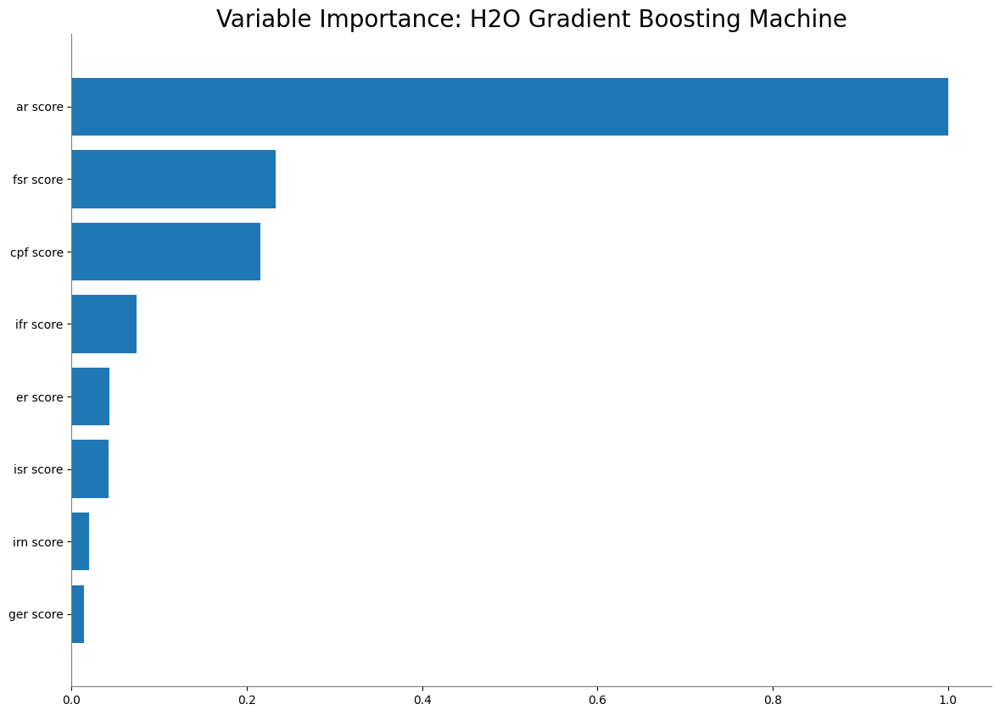

<Figure size 640x480 with 0 Axes>

In [ ]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()


**Inference for the above plot:**

The graph on top represents the Distributed Random Forest Model for H20's variable Importance.

* We can infer that, out of all the variables, ar score is the most significant, with a significance of 1.0 (as if this significance were scaled to 100%). Also, fsr score is the next one holding significance.

### **SHAP Analysis**

**AutoML**

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_3_AutoML_1_20230329_203952,61.0591,3728.21,43.575,nan,3728.21,526,0.589218,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20230329_203952,61.7086,3807.95,45.3207,nan,3807.95,528,0.257372,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952,61.8367,3823.78,45.5666,nan,3823.78,182,0.070464,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952,62.9986,3968.82,46.7889,nan,3968.82,419,0.09863,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230329_203952,63.259,4001.7,45.6192,nan,4001.7,558,0.258261,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952,64.4964,4159.79,46.9925,nan,4159.79,403,0.072759,StackedEnsemble
GBM_2_AutoML_1_20230329_203952,64.5634,4168.43,46.2154,0.112605,4168.43,692,0.064816,GBM
GBM_3_AutoML_1_20230329_203952,66.719,4451.42,47.5915,0.106394,4451.42,803,0.071662,GBM
GBM_grid_1_AutoML_1_20230329_203952_model_12,68.3546,4672.35,49.4277,0.108343,4672.35,347,0.068633,GBM
GBM_grid_1_AutoML_1_20230329_203952_model_2,68.8511,4740.47,50.3887,0.169035,4740.47,465,0.054308,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

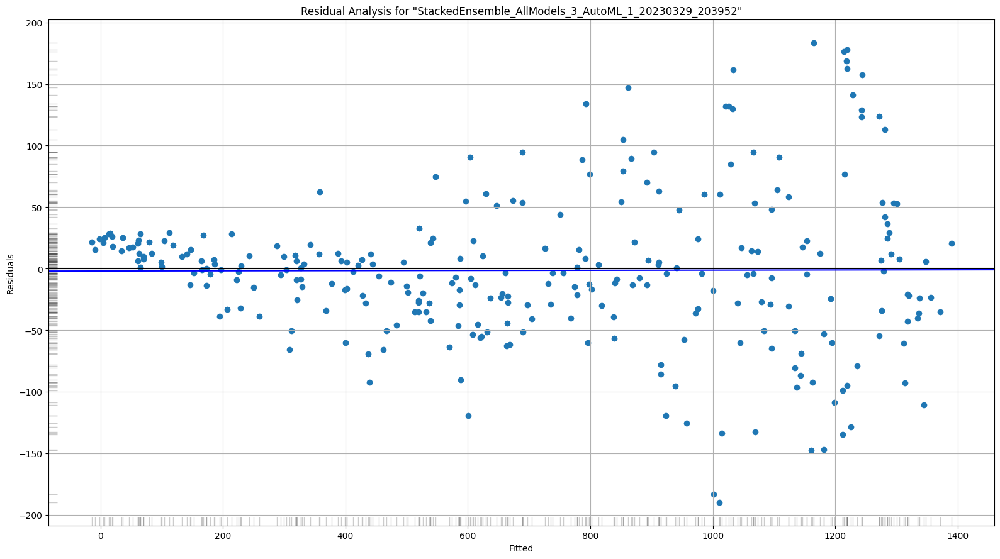

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

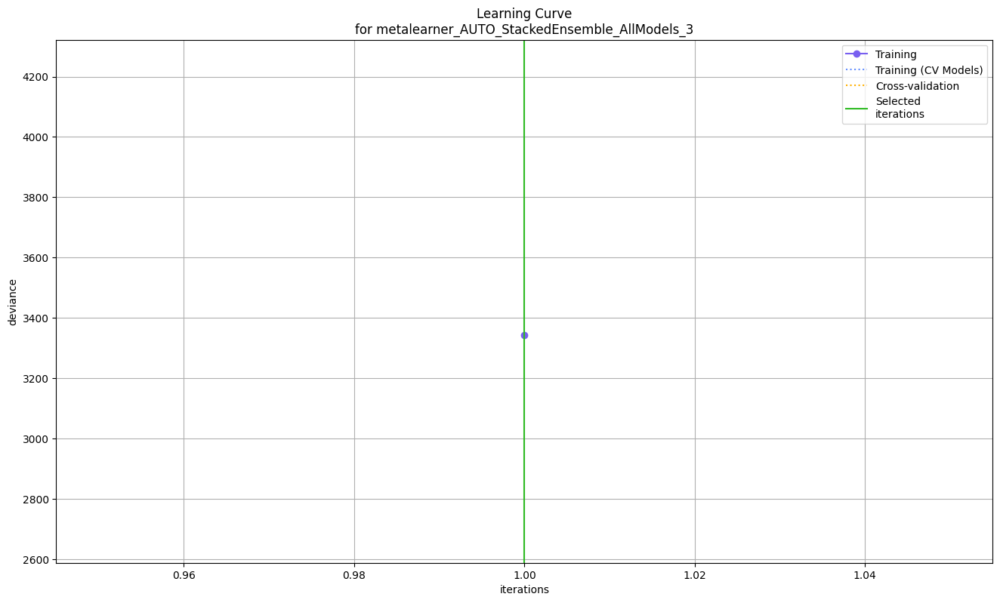

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

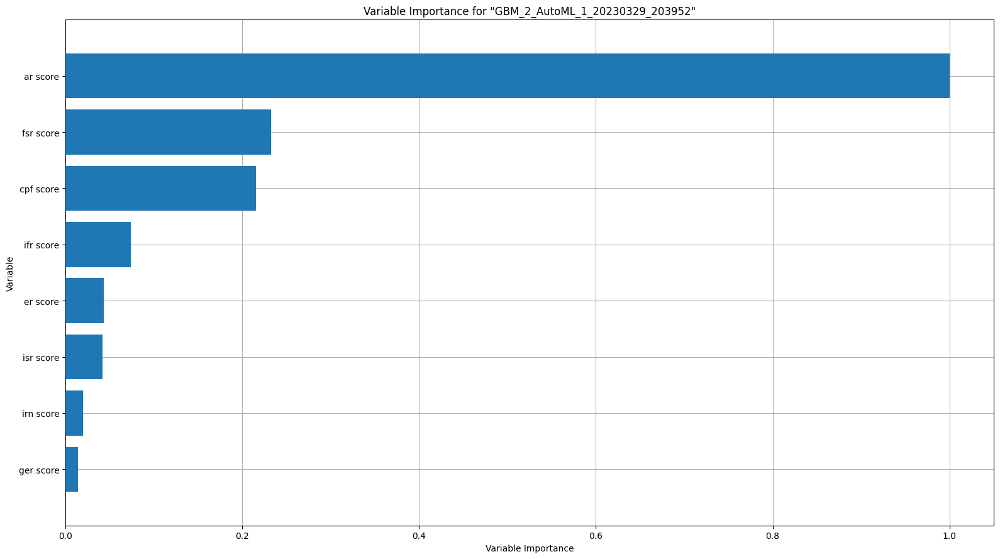

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

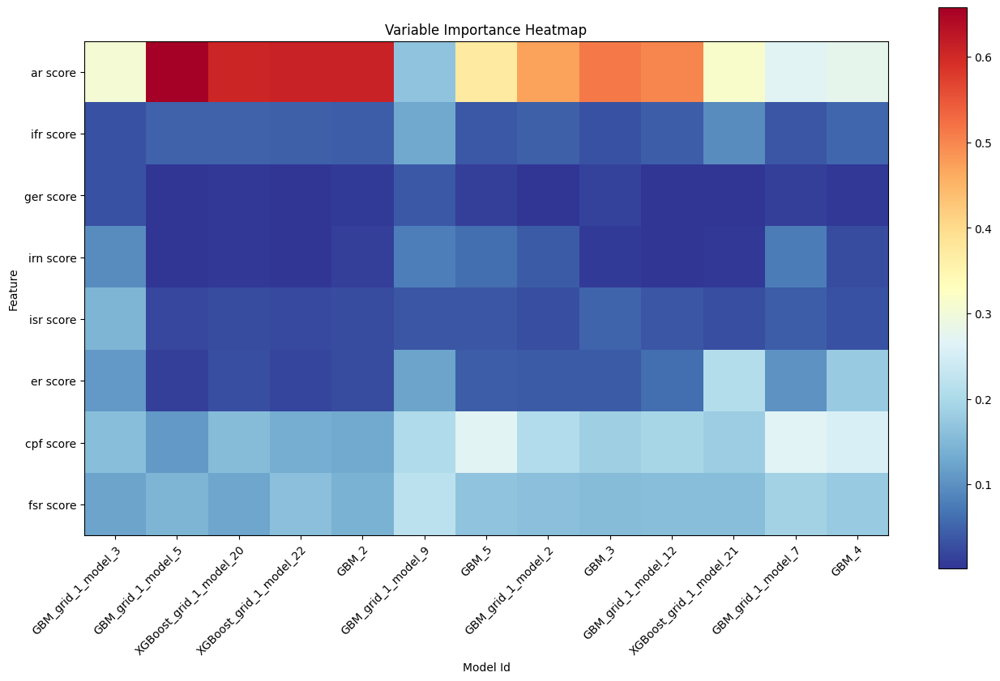

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

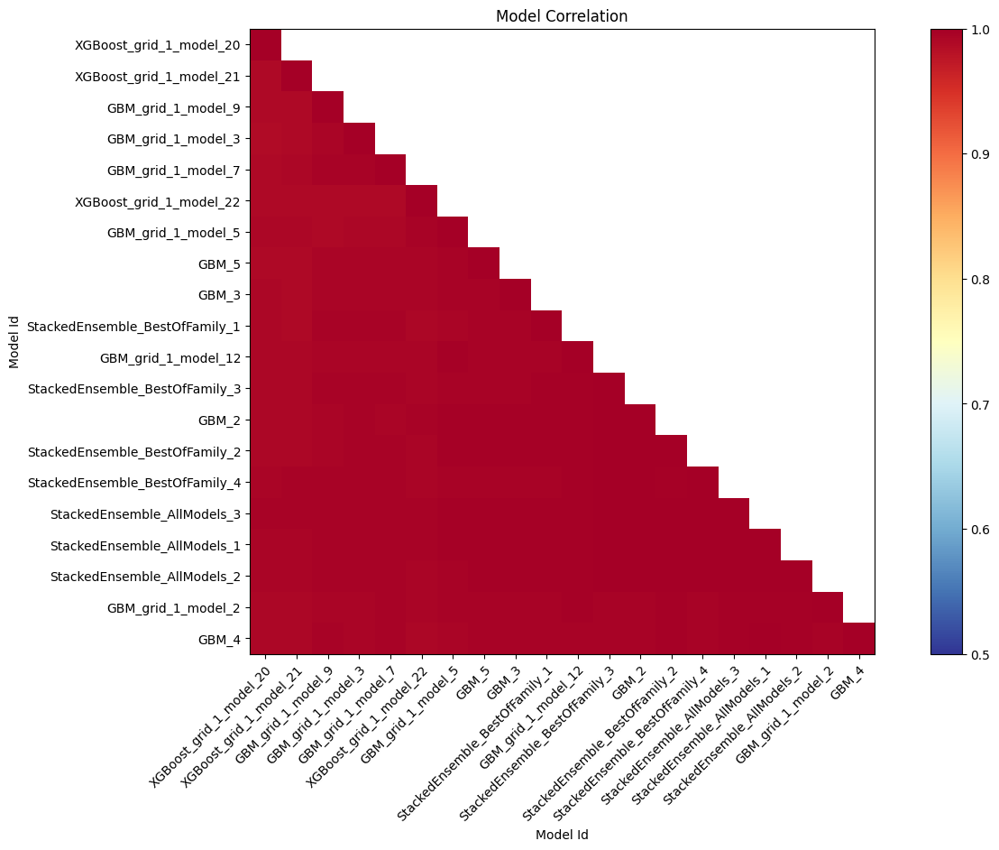

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

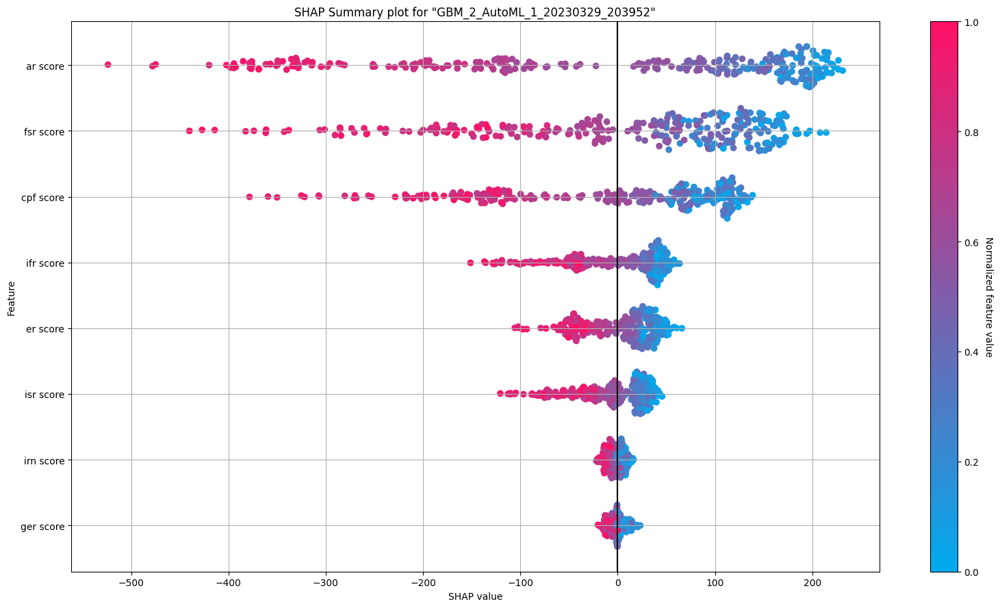

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

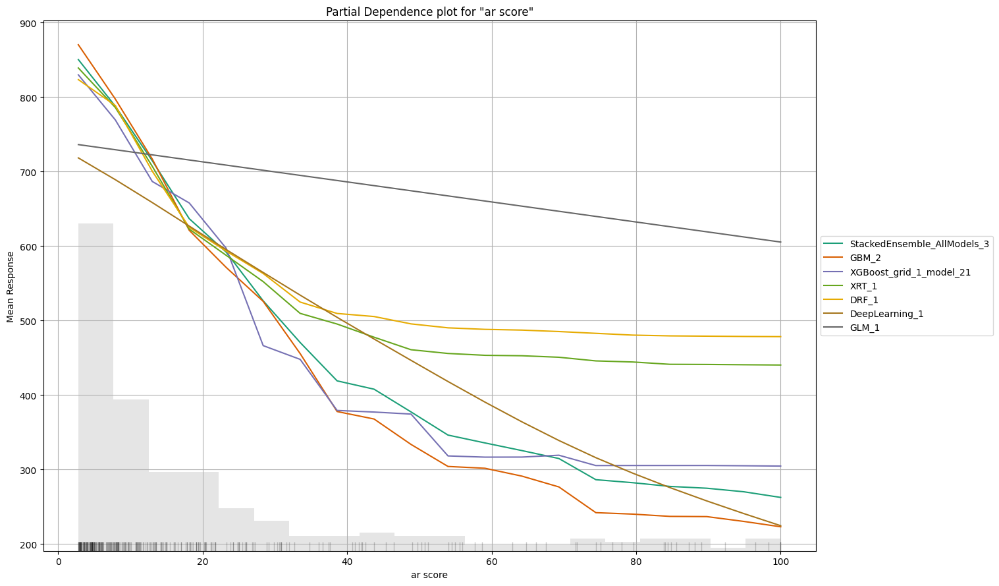

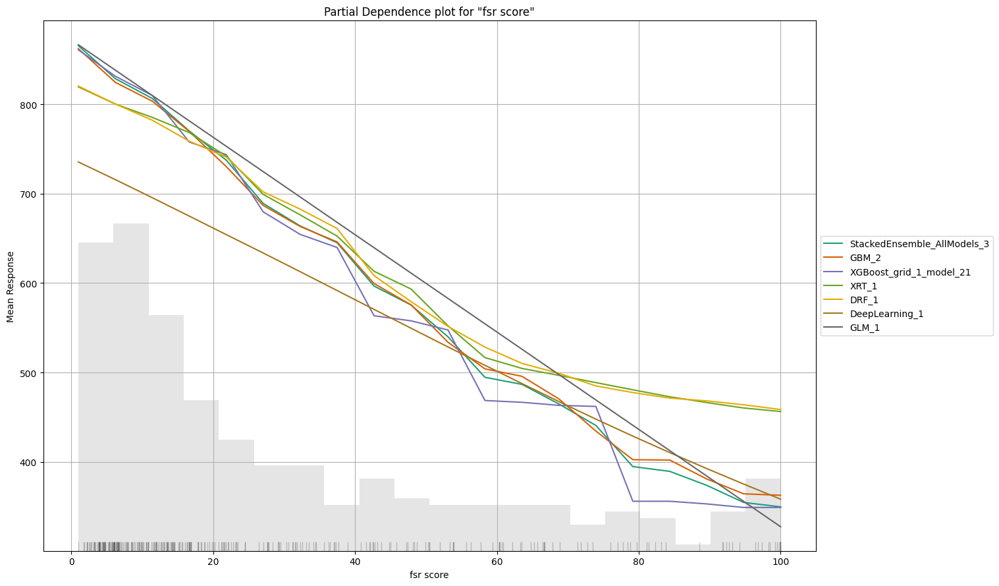

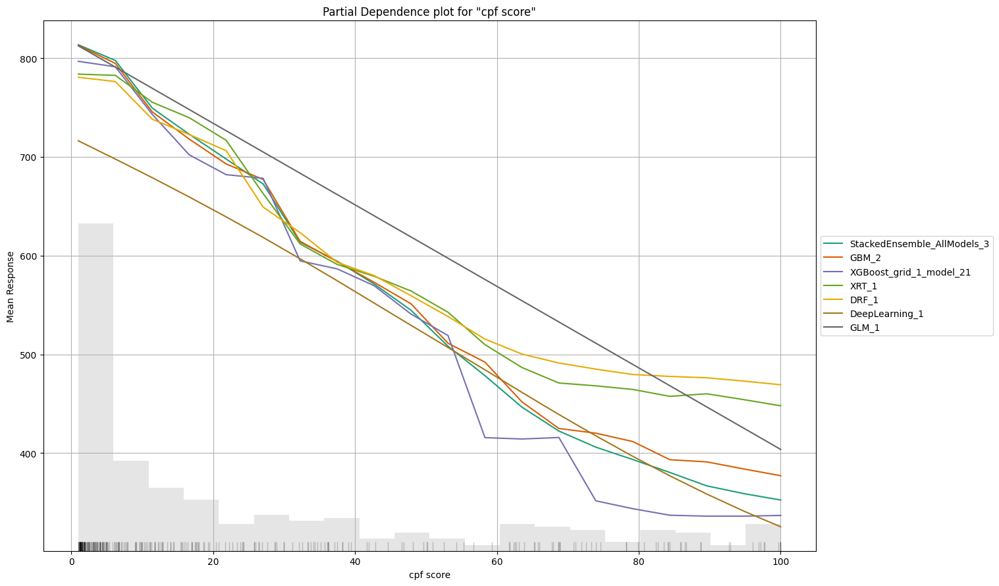

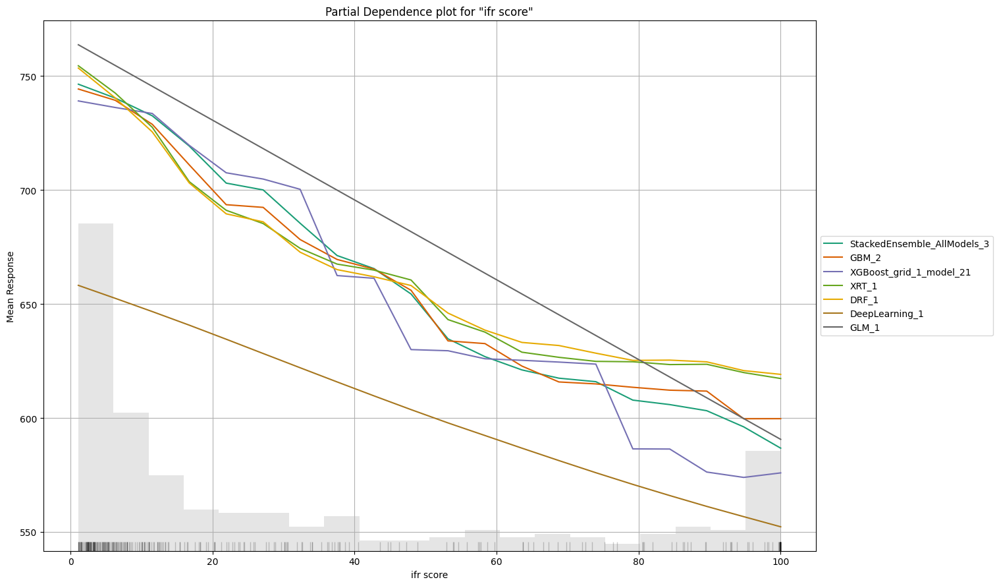

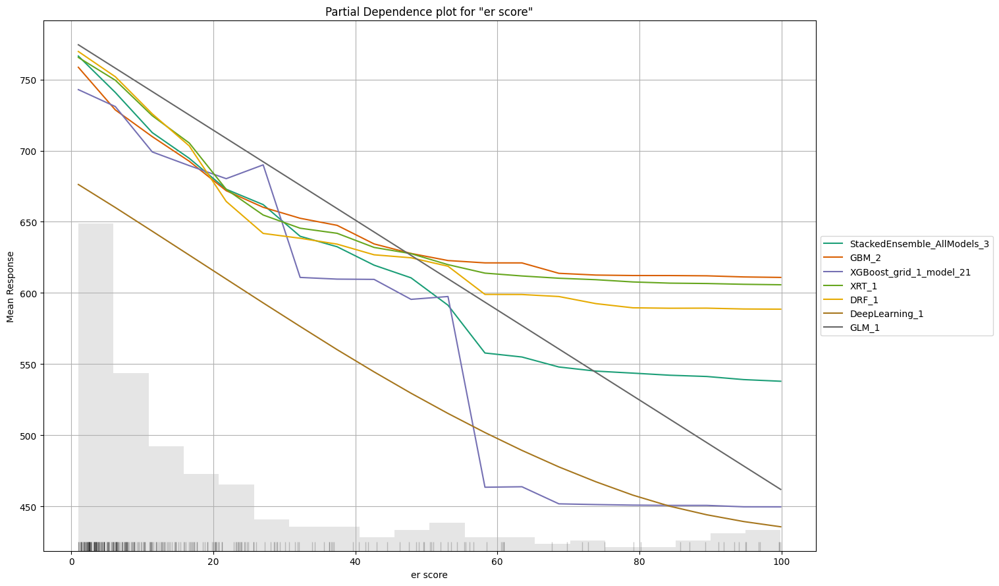

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

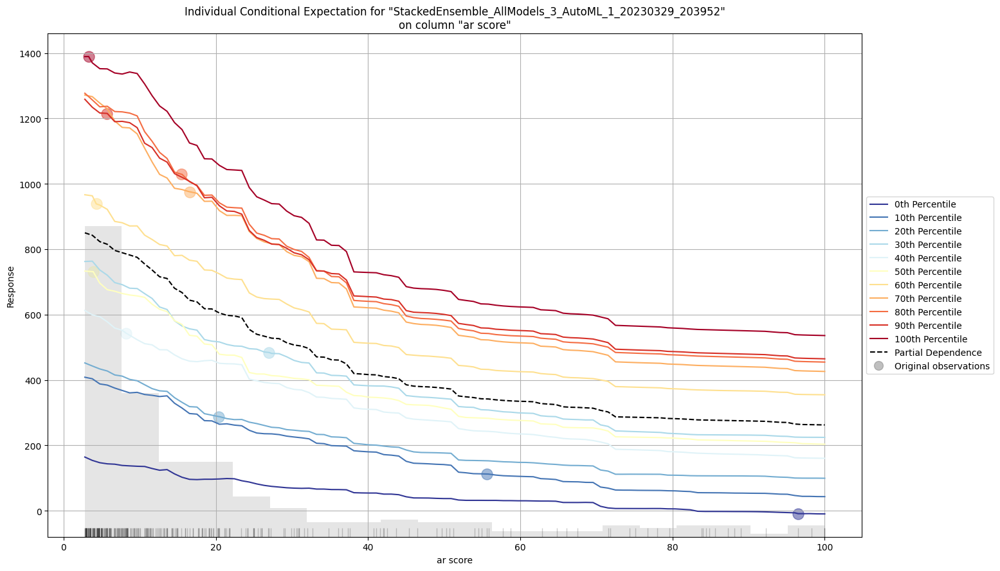

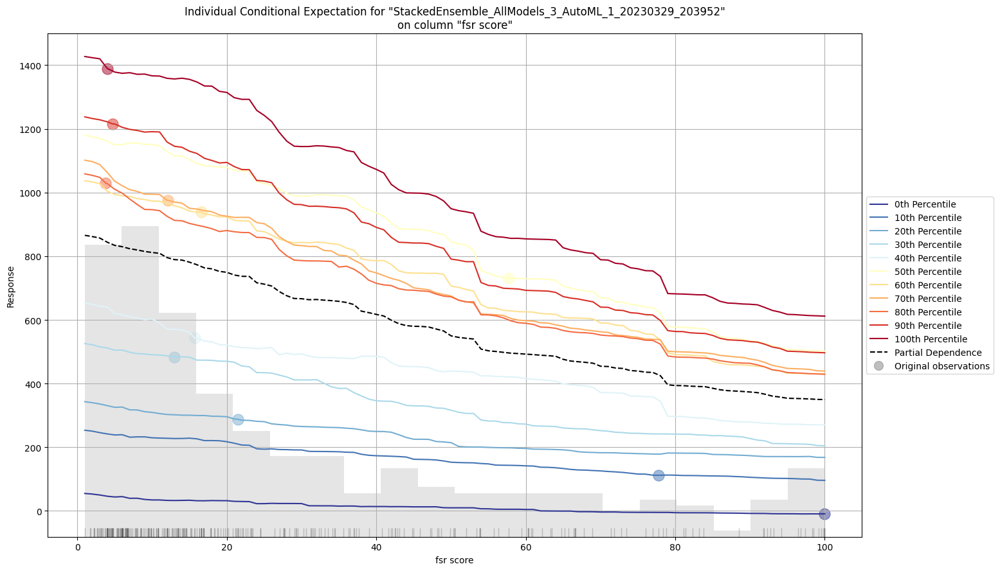

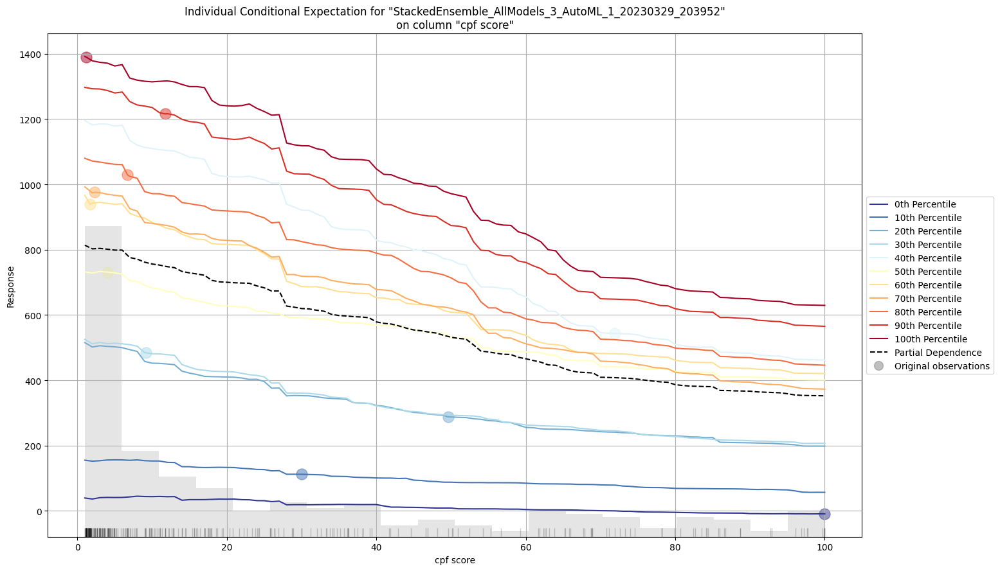

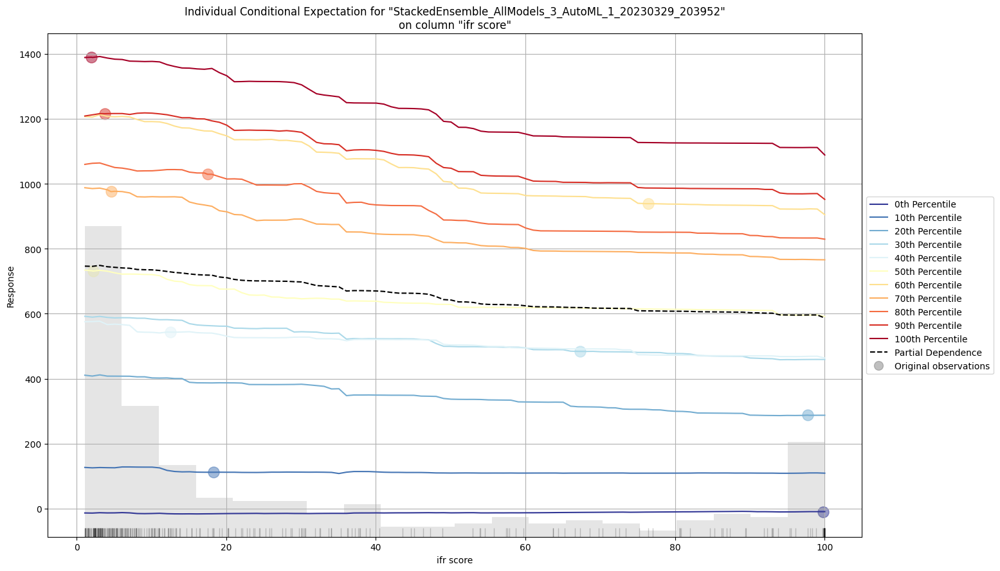

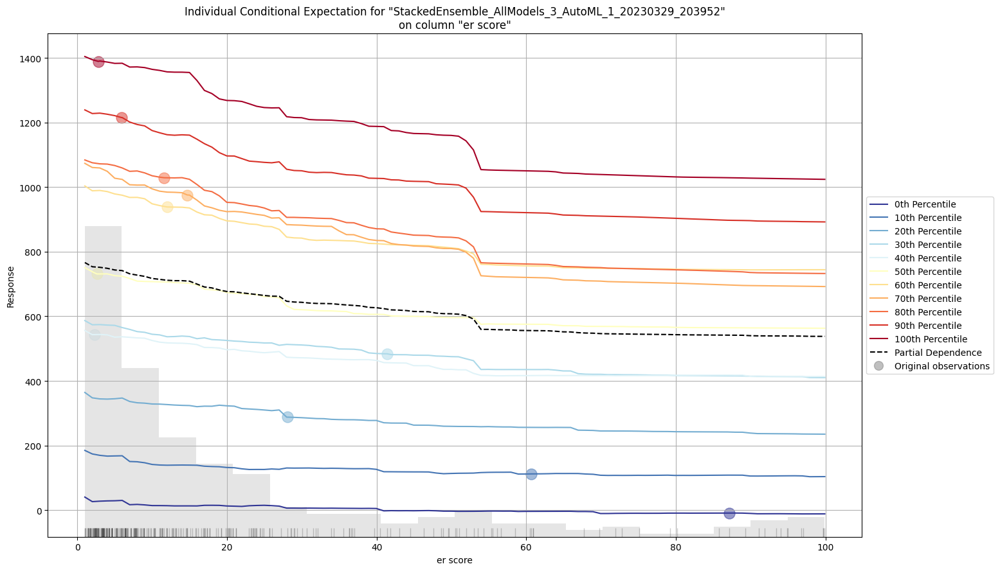

In [ ]:
exa = aml.explain(df_test)

**Residual Analysis:**

- The residuals are normally distributed and the model is making accurate predictions.
- Random scatter of data points around the horizontal zero line and no 
discernible pattern or trend in the residuals plot.
- Residuals signify that residuals don't have heteroscedasticity.

**Variable Importance**
- In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding.
- The feature, ar score being the most important one.

**SHAP Summary:**
- The importance of each feature is ranked based on its contribution to the prediction, with ar score being the most significant, followed by fsr score, and so on.
- Further analysis of the distribution of SHAP values for the ar score feature reveals that extreme values at both ends of the spectrum have a significant effect on the Rank.
- Provides insights into the relative importance of features in the model and their impact on the prediction.
- Importance of each feature is ranked based on its contribution to the prediction.
- SHAP value axis indicates whether a feature has a positive or negative impact on the prediction.
- Color of the dot represents the impact of the feature value on the prediction.
- SHAP analysis provides a more accurate and interpretable way of understanding the behavior of complex models.

**Partial Dependence Plot (PDP):**
- Looking at the PDP for the ar score, we can see that as this feature increases, the mean response (i.e., the university's rank) also increases. This suggests that the range of values for the ar score might be an important factor in determining a university's ranking. Similarly, the PDP for the fsr score shows that as this feature increases, the mean response of quality also increases. Therefore, we can interpret this range as another deciding factor in a university's ranking.
- A graphical tool that allows us to examine the marginal effect of a feature on the target variable.
- Shows how much the target variable changes as we vary the value of a single feature while holding all other features constant.
- Can be useful for interpretation purposes, as we can identify which features have the greatest impact on the target variable.

**ICE (Individual Conditional Expectation) Plot:**
- By examining the ICE plot, we can see that while the rank of some universities remains unchanged when the ar score and fsr score values increase, the rank of other universities increases significantly. Therefore, the ICE plot provides a more nuanced understanding of the relationship between features and model output.
- Shows the effect of a feature on a particular instance.
- Provides a more detailed analysis of the relationship between a feature and a model's output.
- Each line in an ICE plot represents the predictions for one instance when we vary the feature of interest.
- ICE plot provides a more nuanced understanding of the relationship between features and model output.
- More intuitive than PDP plots.

#### **Linear and Tree-Based Models**

##### Linear Regression Model


In [ ]:
import shap

In [ ]:
# Sample 100 examples for SHAP analysis
x_train_100 = shap.utils.sample(x_train, 100)
x_test_100 = shap.utils.sample(x_test, 100)


In [ ]:
# Computing SHAP values using the linear regression model
lr_explainer = shap.Explainer(lr.predict, x_train_100)
lr_shap_values = lr_explainer(x_train)


Exact explainer: 1138it [00:29, 23.69it/s]                          


##### Tree-Based Model


Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of ar score

- For Tree-based model the cross is made at approx E[f(x)] 780

So as the ar score decreases the expected value also decreases or vice versa.

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

In [ ]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(rf.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)


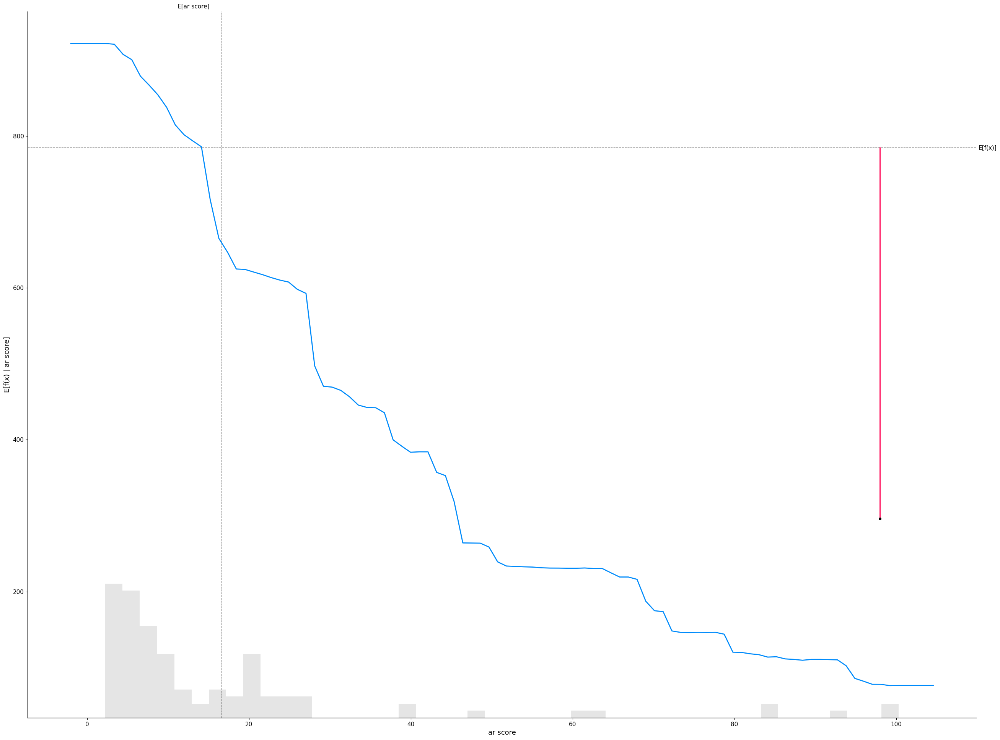

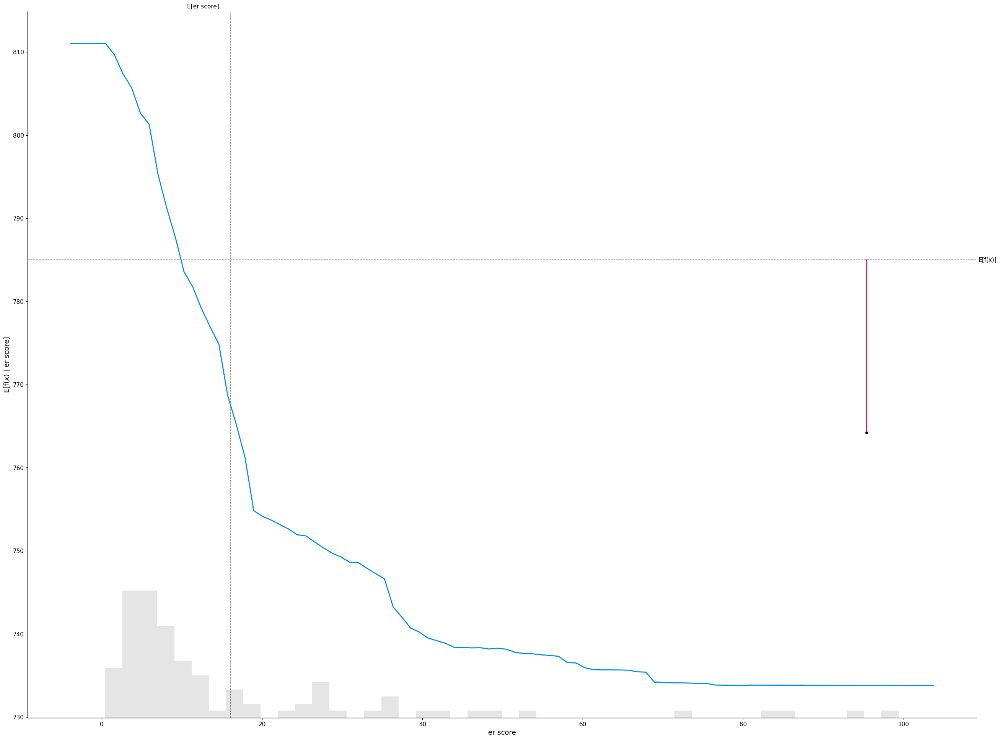

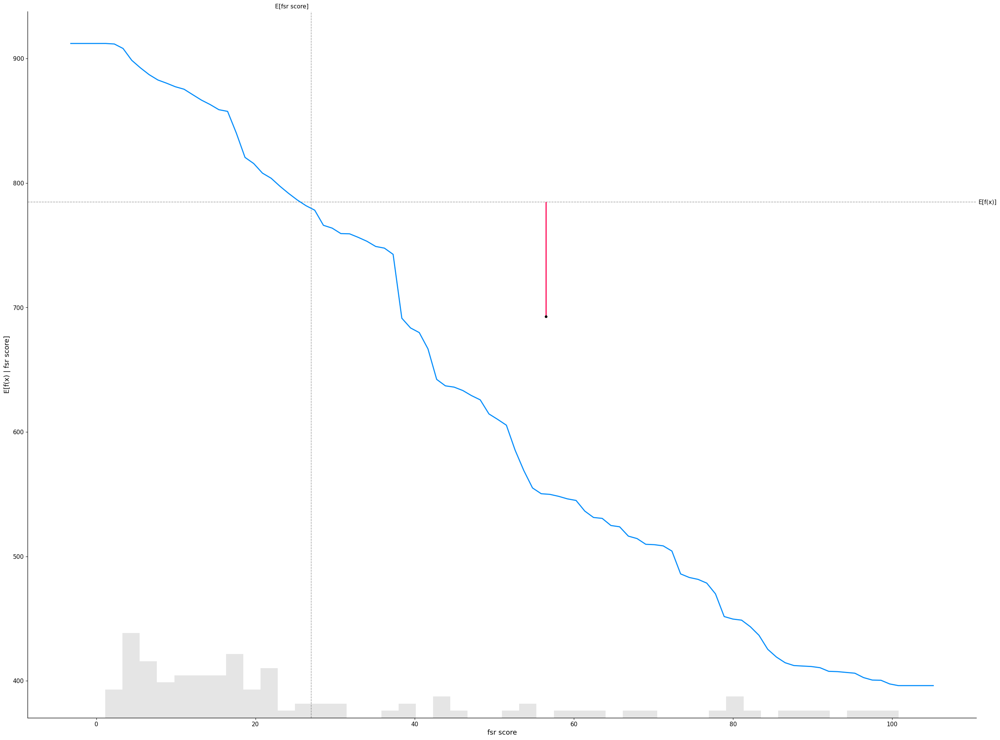

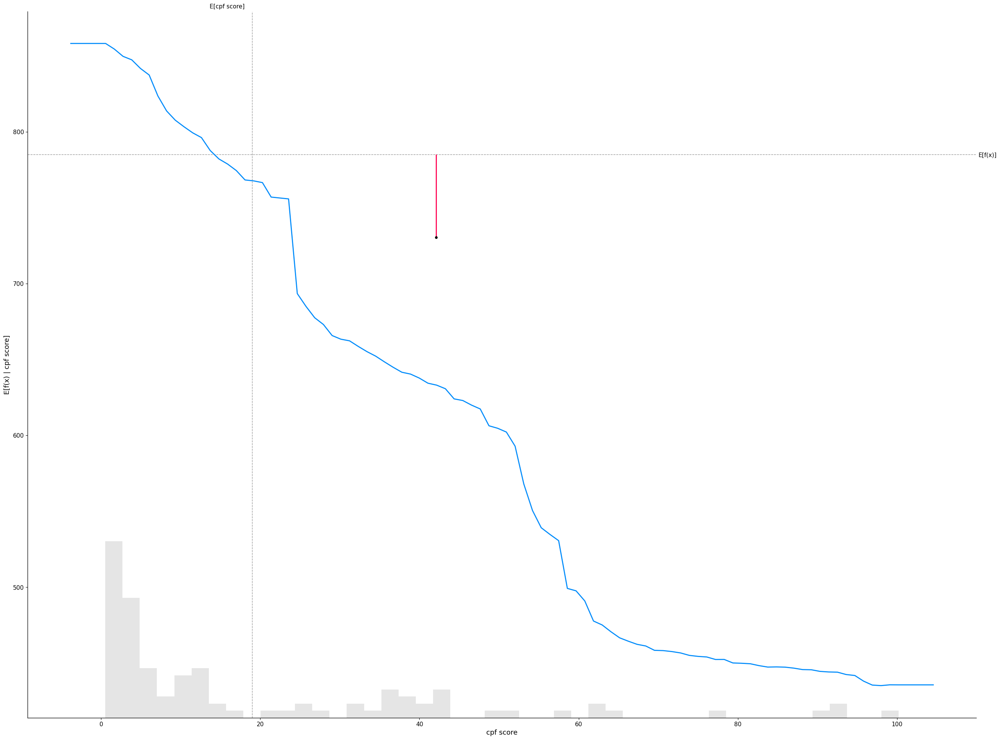

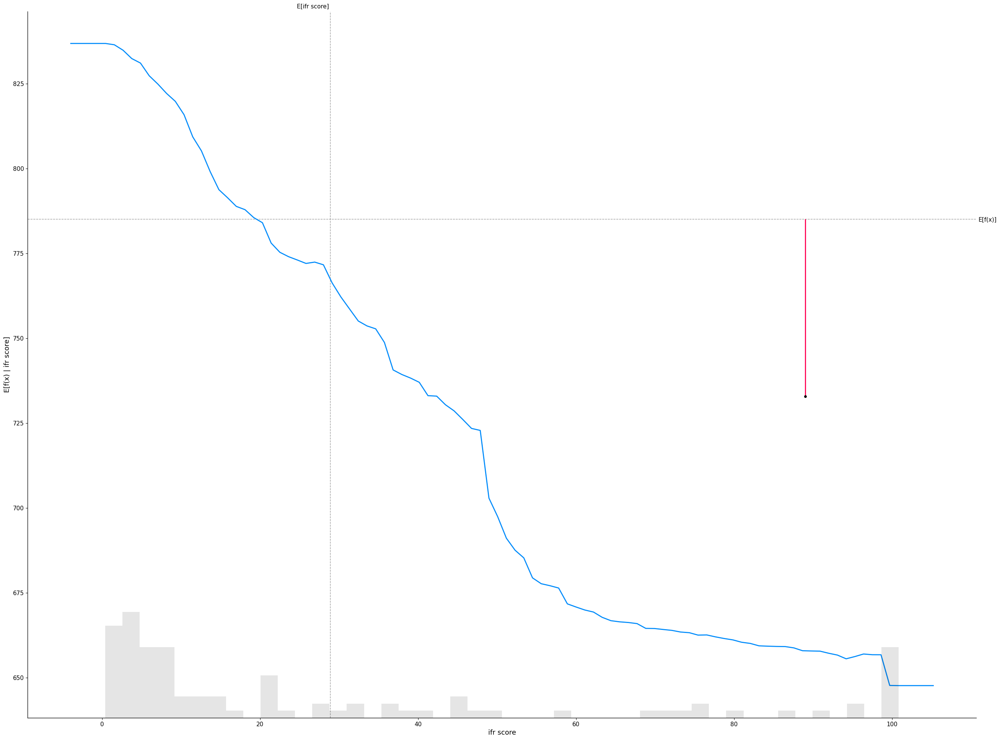

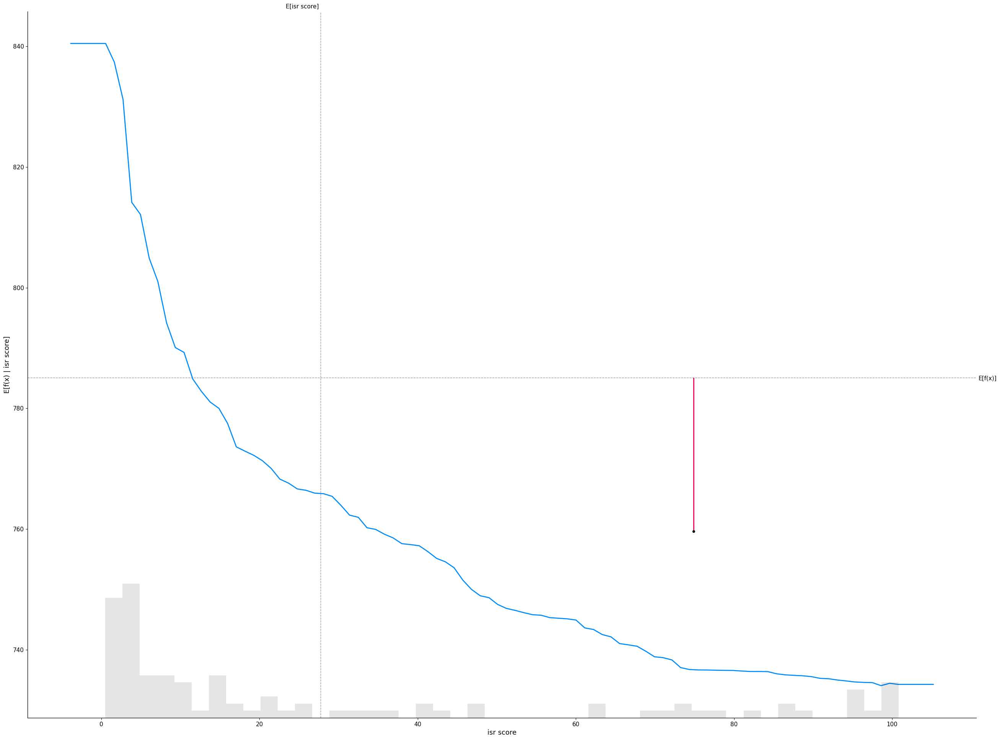

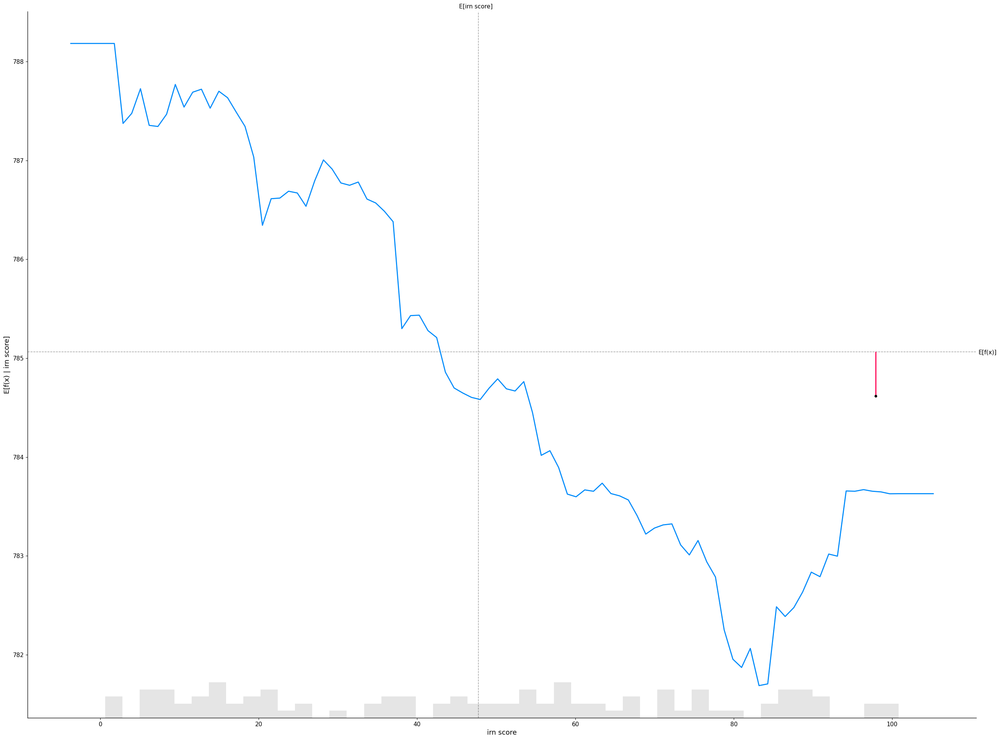

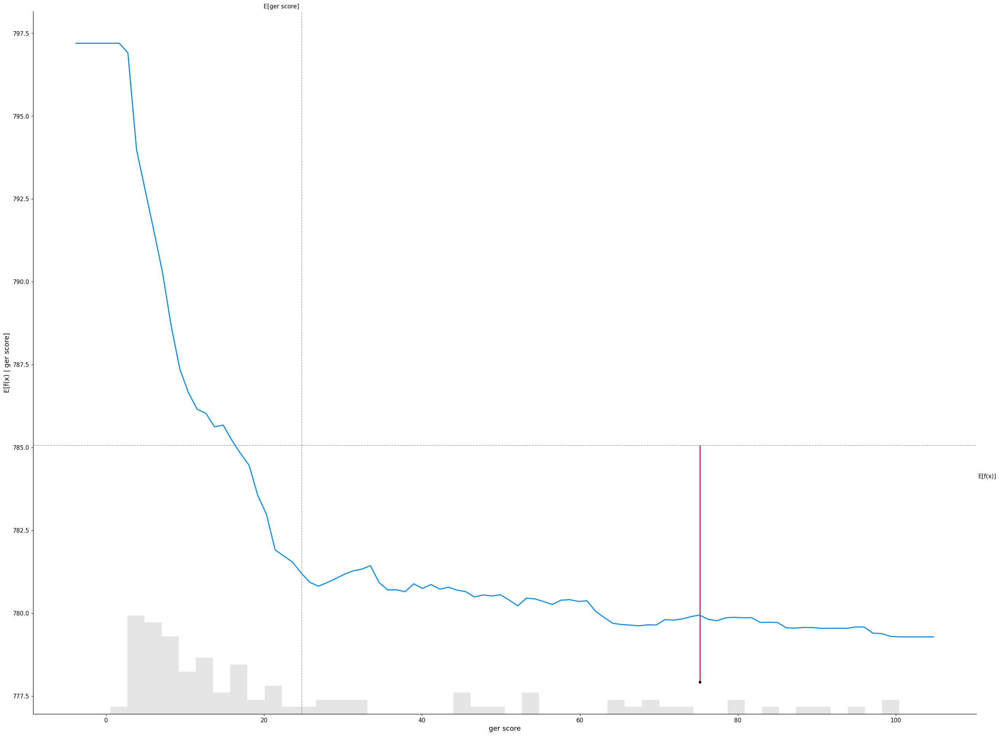

In [ ]:
for i in x_train.columns:
    # making a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        rf.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

#### Interpreting SHAP Feature Importance Plot for Linear and Tree-based model

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

- SHAP feature importance for a linear model
- SHAP feature importance for tree-based model

As we can see below in the plots, there is a difference in feature importance for both the models

- For the linear model, fsr is the most important feature but,
- For our tree-based model ar is the most important feature when we consider the average of SHAP values to calculate feature importance.

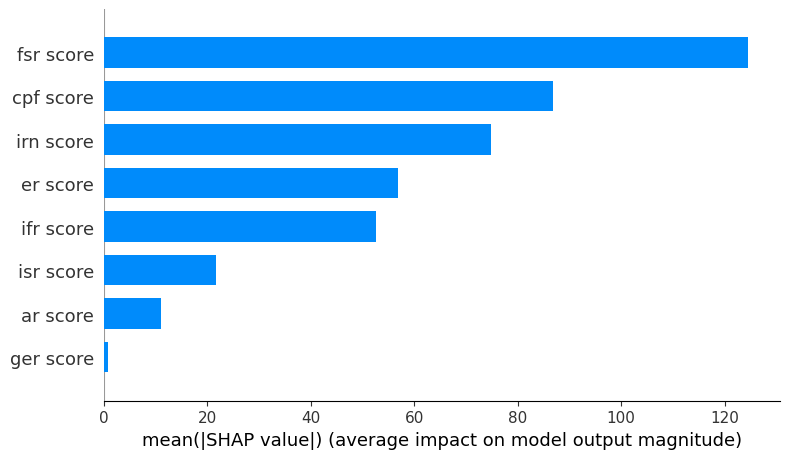

In [ ]:
# Linear Regression Model
lr_shap_explainer = shap.LinearExplainer(lr, x_train, feature_dependence="independent")
lr_shap_values = lr_shap_explainer.shap_values(x_train)
shap.summary_plot(lr_shap_values, x_train, plot_type="bar")


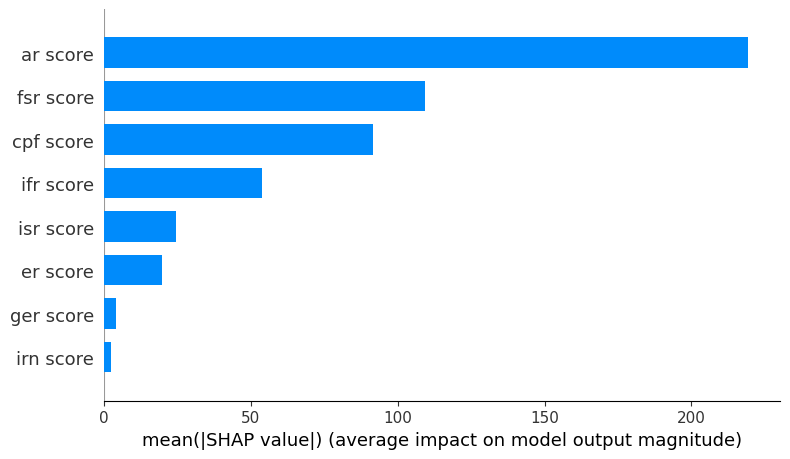

In [ ]:
# Random Forest Model
rf_shap_explainer = shap.TreeExplainer(rf)
rf_shap_values = rf_shap_explainer.shap_values(x_train)
shap.summary_plot(rf_shap_values, x_train, plot_type="bar")


##### **Interpreting Waterfall SHAP visualization**

**Linear Regression Model**
- It says that f(x) = 568.113 is what we got as a model output and the expected output for this sample was 990.961. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that er score has the most negative impact in decreasing the rank of university, for this specific sample. 

- Considering fsr score which had a positive impact and it bought the rank of university up for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 568.113.

**Tree-Based Model**
- Similarly we can interpret the tree-based model for the same sample.
Where the output we got was -226.708 and the expected output was 123.858. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is equally determined by the features - The below graph shows that ar score has the most negative impact in decreasing the rank of university, for this specific sample..

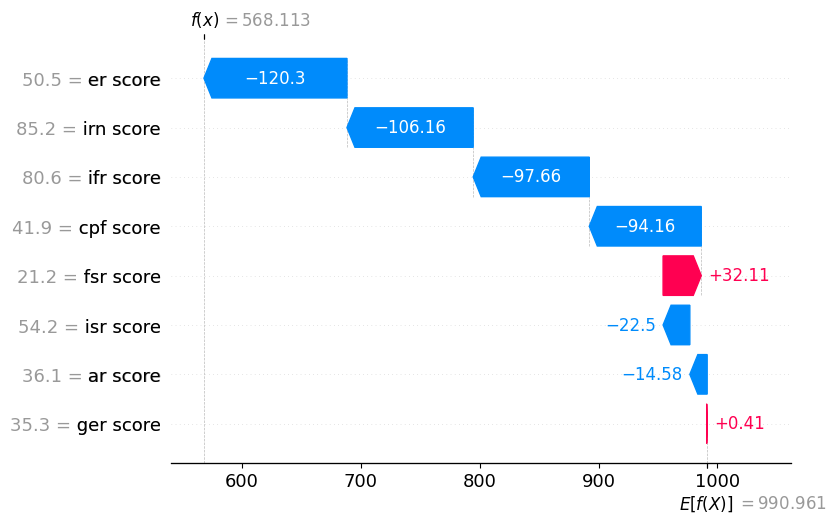

In [ ]:
# Linear Regression Model
# SHAP waterfall plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
shap.waterfall_plot(shap.Explanation(values=lr_shap_values[0], base_values=lr.predict(x_train_100)[0][0], data=x_train.iloc[0], feature_names=x_train.columns), max_display=15)

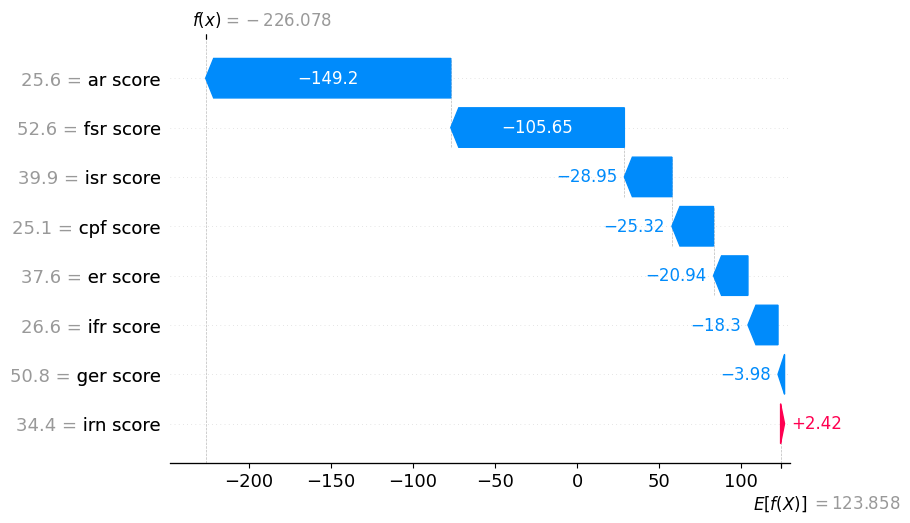

In [ ]:
# Tree-Based Model
# SHAP Explanation object for the third instance in the train set
sample_ind = 3  # third instance
shap_exp = shap.Explanation(values=rf_shap_values[sample_ind], base_values=rf.predict(x_train_100)[sample_ind], data=x_train.iloc[sample_ind], feature_names=x_train.columns)

# Plotting the SHAP waterfall plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
shap.waterfall_plot(shap_exp, max_display=15)


#####**Interpret the summary plot for the Linear and Tree-based model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

- Each dot(both red and blue) represents a feature of determination of rank.
- Red color represents high values whereas blue color represents low value
- If a dot(feature of determination of rank.) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
- The position of a dot(feature of determination of rank.) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

- Higher value of fsr tends to have a negatice impact on the rank of university
- Lower values of fsr score tend to have a positive impact on the rank of university.
- Lower value of irn tends to have a positive impact on the rank of university

We could also interpret the intensity of impact

- Higher amount of fsr score have a much negative impact on the rank of university but it doesn't really care if the value is low it will always have the same intensity of negative impact on the rank

This visualization is very useful when it comes to interpreting how our model is working.

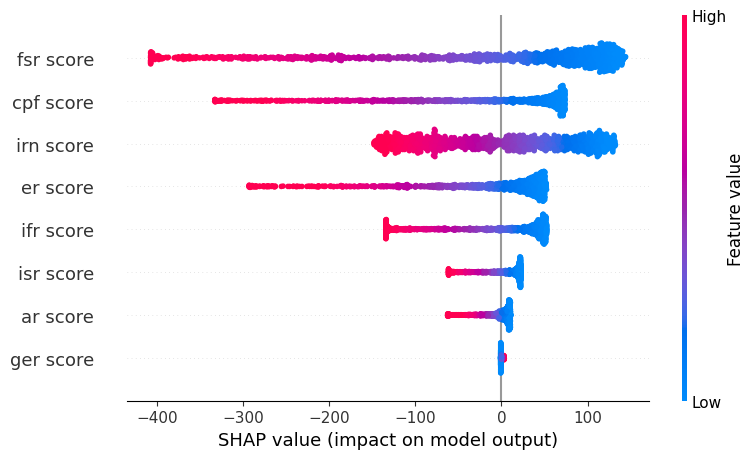

In [ ]:
# SHAP summary for Linear Model
shap.summary_plot(lr_shap_values, x_train)
    

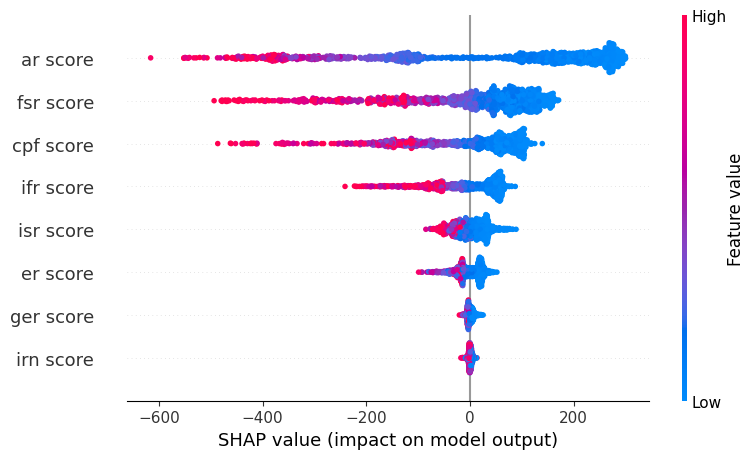

In [ ]:
# SHAP summary for Tree-Based Model
shap.summary_plot(rf_shap_values, x_train)
    

##### **Interpreting SHAP dependence plot for Linear and Tree-based model**

The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every university in our dataset.

- As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the rank of university then the relationship will be directly proportional e.g. ger and if the feature harms rank of the university the relationship will be inversely proportional. e.g. ar score and er score.

- For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.

Example of SHAP dependence plot of er score

- In the linear model the relationship is linear between er score and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.
- In the tree-based model we could extract the information on how the rank of each university is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The rank of university in the range (30 - 80) changes drastically.

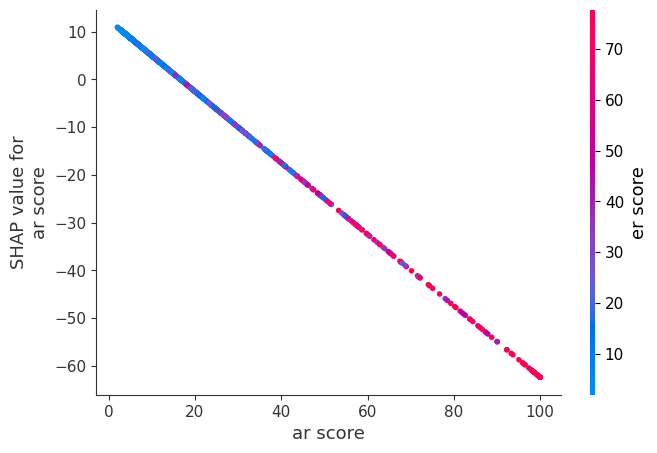

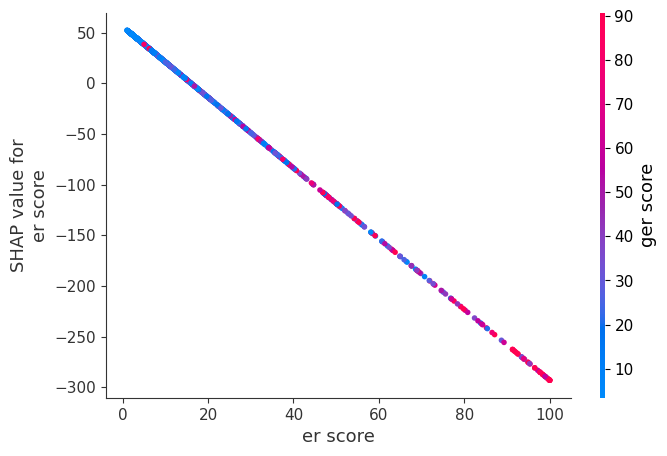

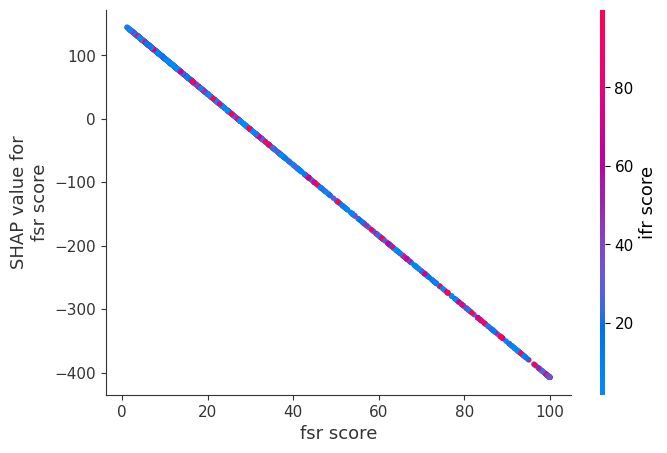

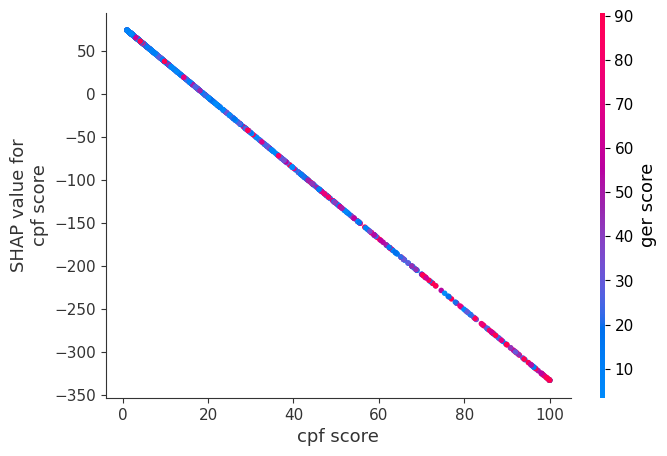

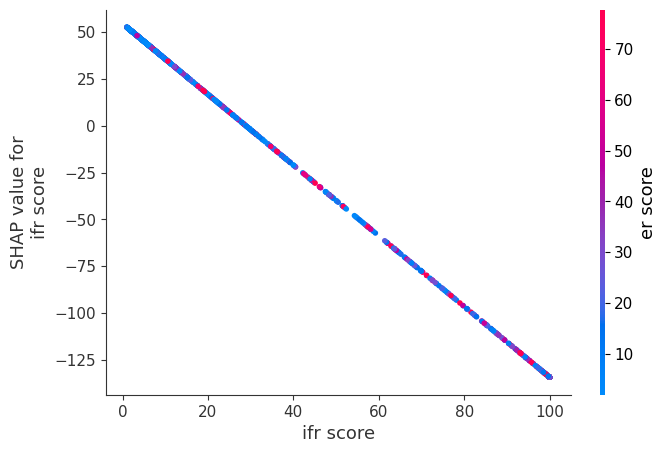

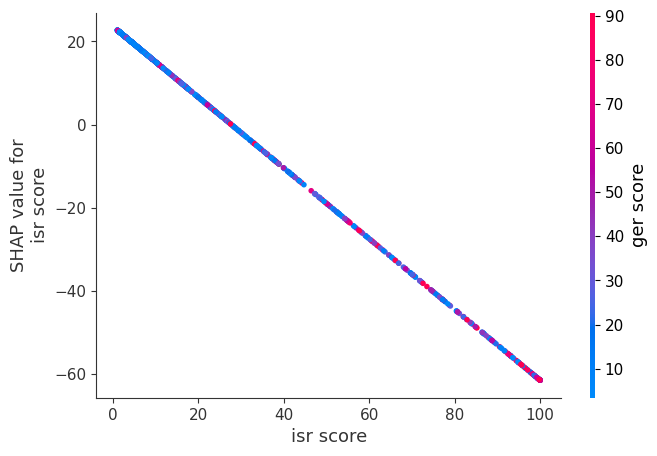

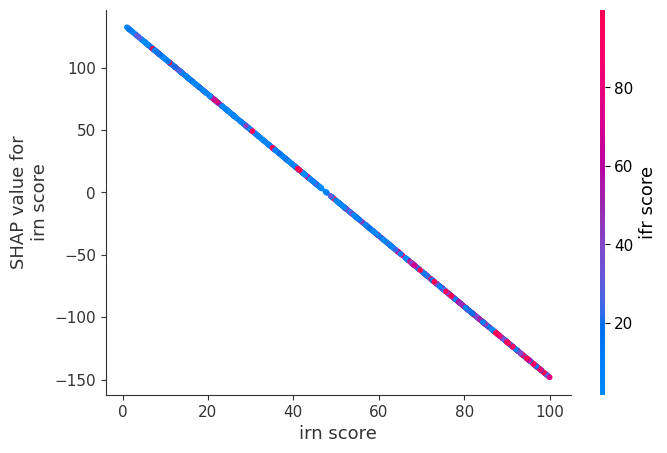

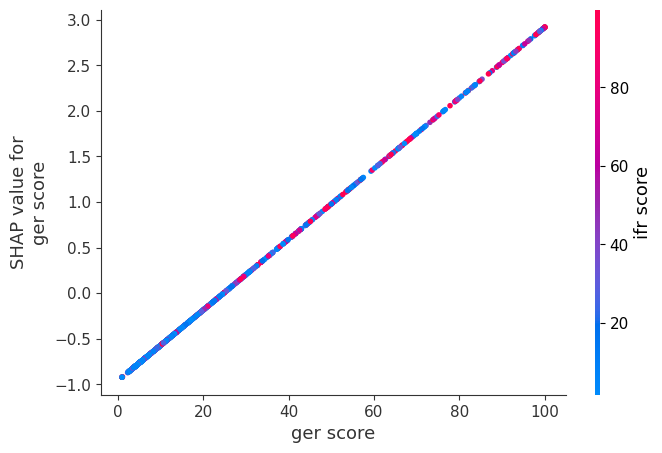

In [ ]:
# SHAP partial dependence plot for Linear Regression Model
for i in x_train.columns:
    shap.dependence_plot(i, lr_shap_values, x_train)
     

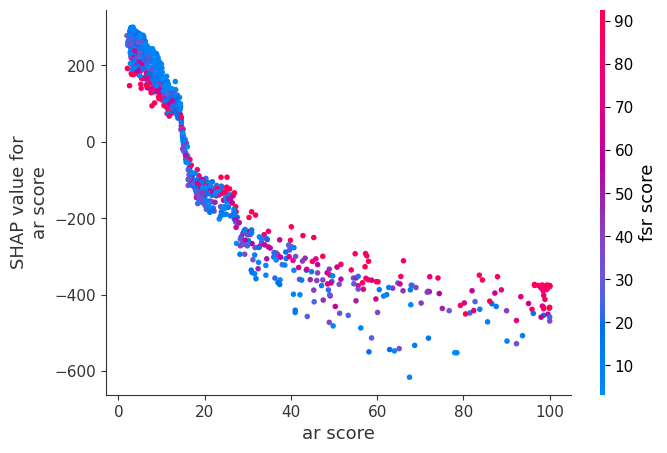

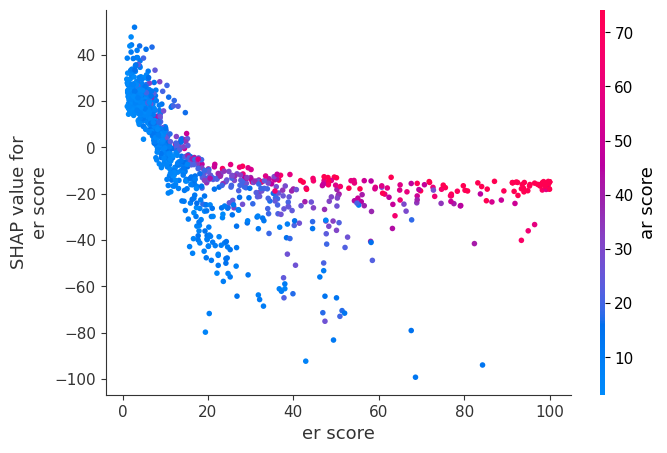

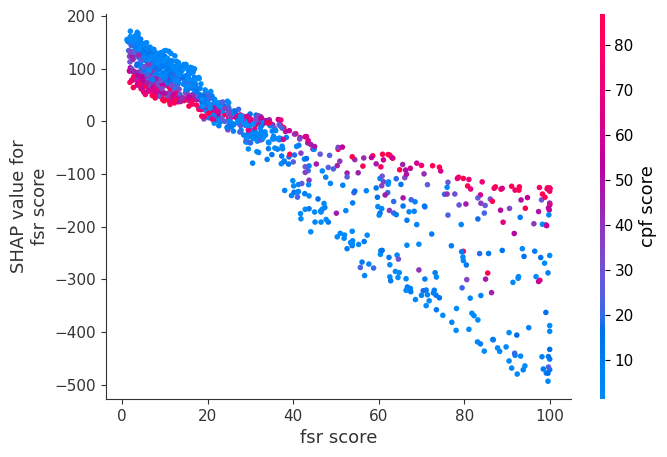

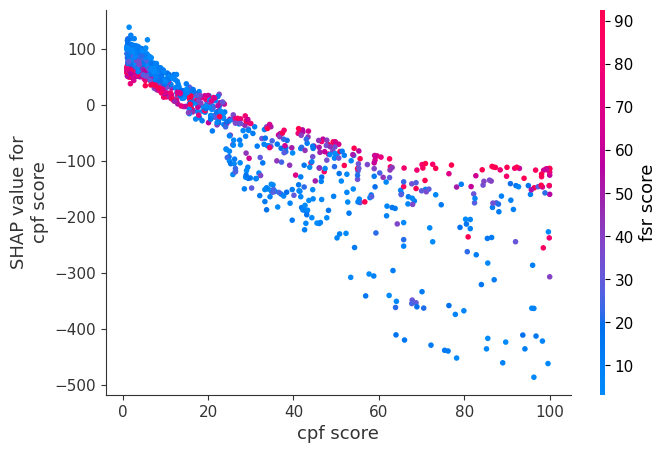

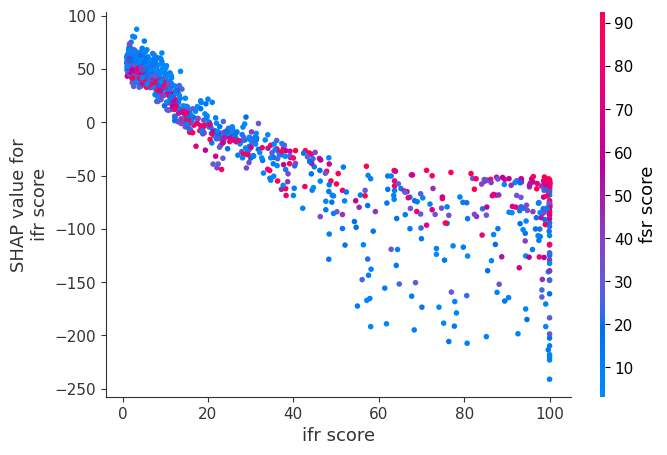

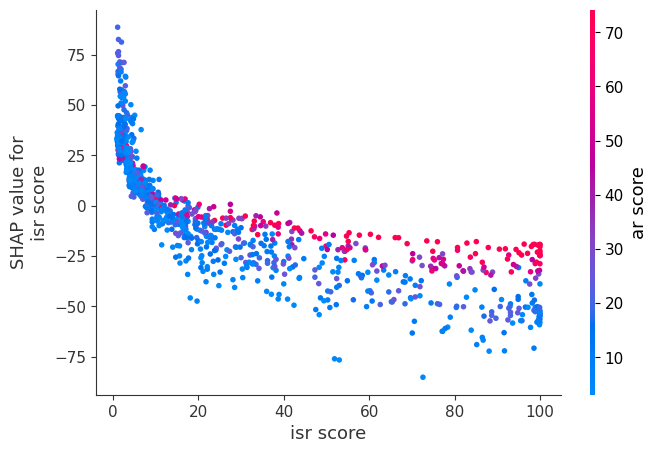

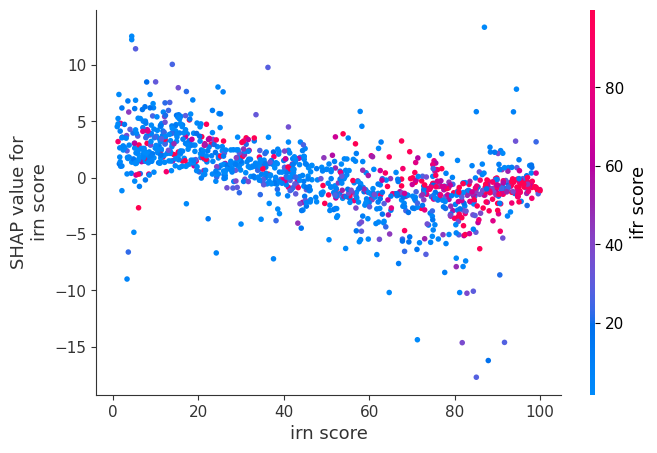

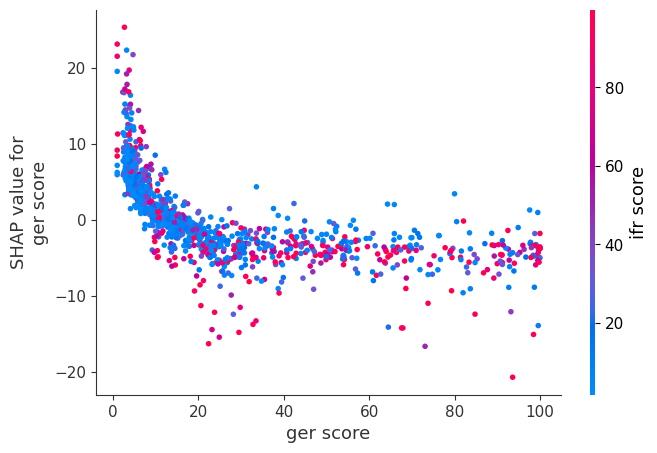

In [ ]:
for i in x_train.columns:
    shap.dependence_plot(i, rf_shap_values, x_train)
   

In [ ]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    lr.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    rf.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe
   

This allows us to compare the actual values of the target variable with the predicted values of each model for the same set of instances. We can then use various evaluation metrics to compare the performance of the two models and determine which one is more accurate in predicting the target variable for new, unseen instances.

In [ ]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(rf)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p
     

###### **Force Plot SHAP analysis**

This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read

In [ ]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(5))  # SHAP force plot for sample 5
  

##### **Heatmap Visualization for Linear and Tree-based model**

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(rank of university).

- Here the Y-axis is Features and X-axis is Instance of that feature
- The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
- The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

**Linear Regression Model** - fsr score

**Random Forest Model** - ar score

###### Linear Regression Model

Exact explainer: 1138it [00:14, 34.25it/s]                           


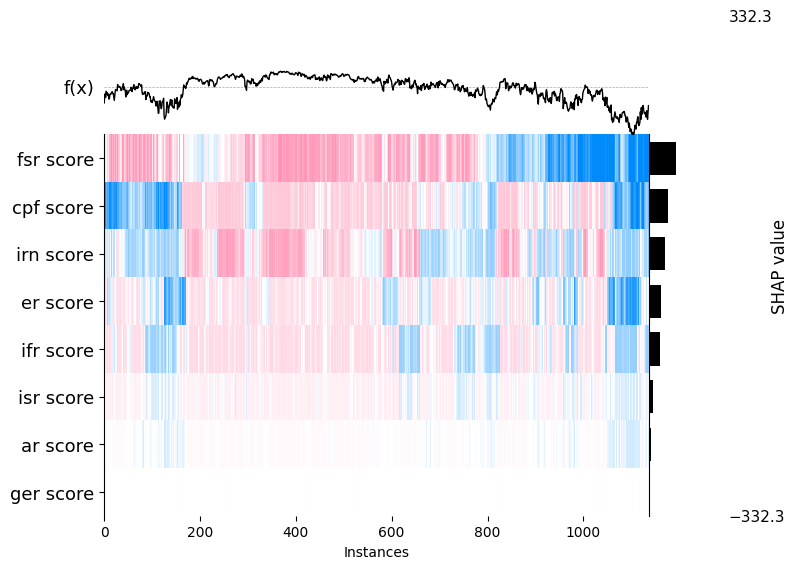

In [ ]:
# Creating a SHAP explanation object
lr_explainer = shap.Explainer(lr.predict, x_train)
lr_shap_values = lr_explainer(x_train)

# Creating a SHAP heatmap
shap.plots.heatmap(lr_shap_values)

###### Random Forest Model

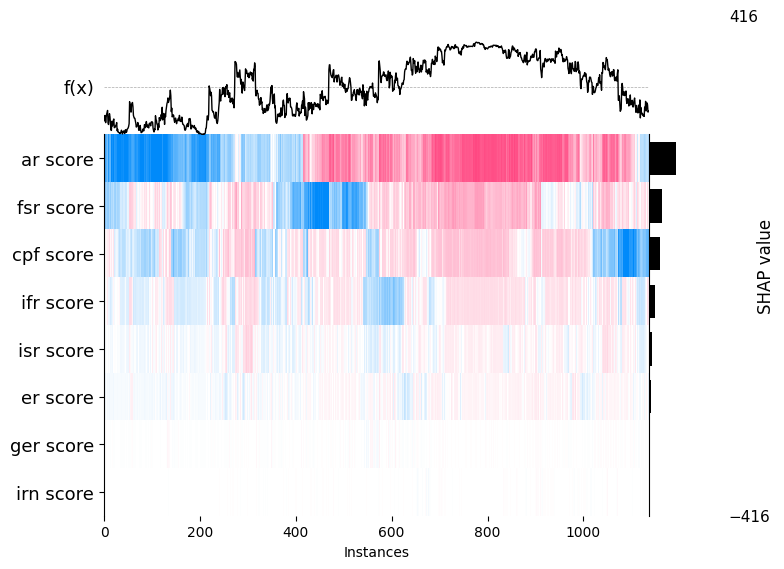

In [ ]:
# Creating a SHAP explanation object
explainer = shap.Explainer(rf)
shap_values = explainer(x_train)

# Creating a SHAP heatmap
shap.plots.heatmap(shap_values)

##### **LIME (Local Interpretation Model-Agnostic Explanation) Analysis**

- LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

- LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

- As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
- **fsr score and cpf score had a positive effect on the rank of university in both models**
- **ifr score and isr score had a negative effect in the linear model but positive in tree-based model**

These interpretations were carried out locally in the region where of out sample data.

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=baf2b07e8337ef4a8702bed61e49f757991f85efd32c101801d1669ef0fc590e
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

###### Linear Regression Model

In [ ]:

# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", lr.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], lr.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [[648.00068122]]
Actual :      [648.]


In [ ]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

###### Random Forest Model

In [ ]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", rf.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], rf.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation
     

Prediction :  [502.60721861]
Actual :      [648.]


In [ ]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

##### **PDP(Partial Dependence Plot) for Linear model and Tree-based Model**

- **Linear Regression Model** - If we closely look at the PDP of the linear model we can see that if features ar score and fsr score are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(rank of university) 

- **Tree-Based Model** - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly



##### Linear Regression Model

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence

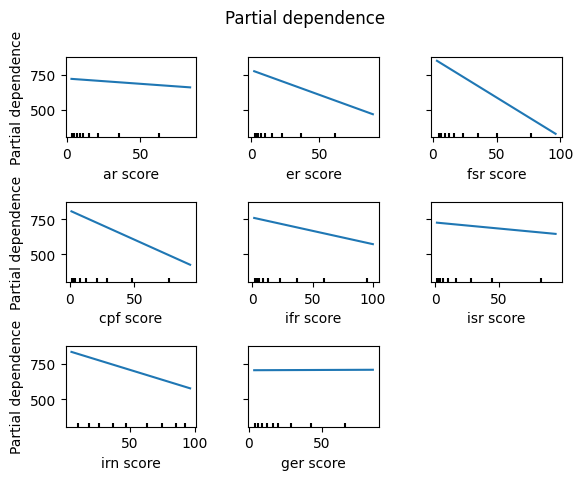

In [ ]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(lr, x_test, x_test.columns )
fig = plt.gcf()
fig.suptitle("Partial dependence")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

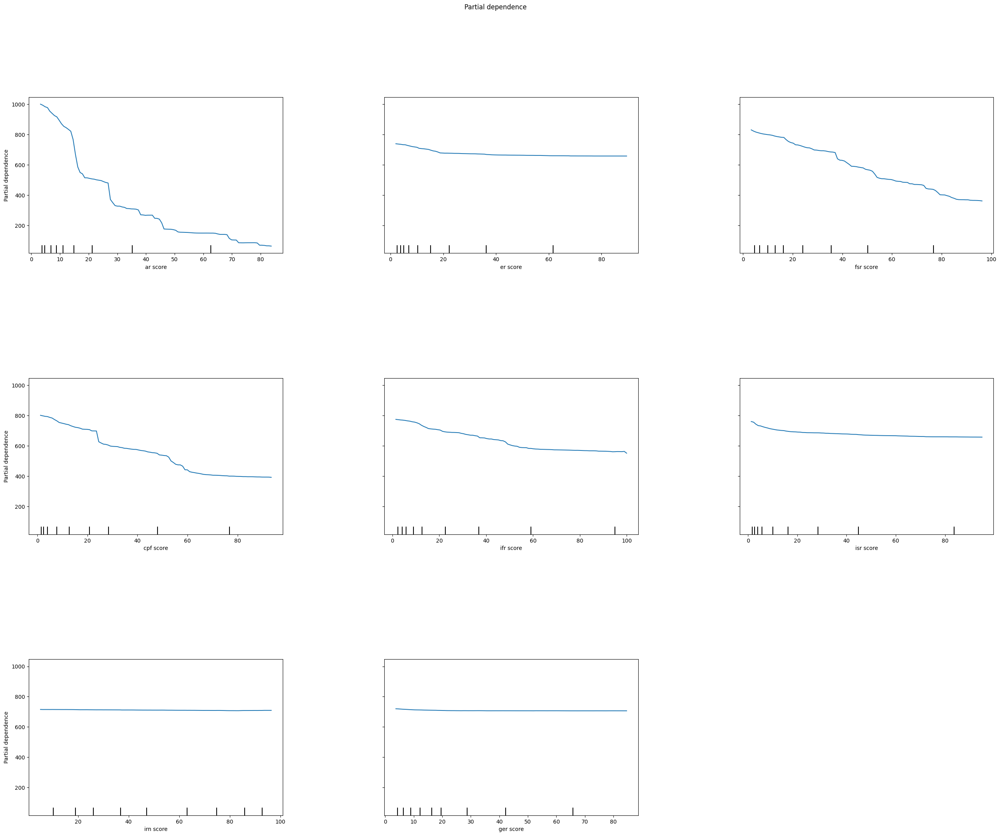

In [ ]:
# PDP Plot for Tree based Model
PartialDependenceDisplay.from_estimator(rf, x_test, x_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

##### **Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**



The purpose of model interpretability is to understand and explain how a machine learning model works and how it makes predictions or decisions. Interpretability is important because it helps to build trust in the model and its predictions, and it enables users to identify and correct errors, biases, or limitations in the model.

Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

- PDP gives the extent of effect a variable has on the output by freezing the rest of them - **In our case: ar score being the most important feature followed by fsr score**

- SHAP gives how much each variable contributes to the prediction - **As we analysed by the negative or positive impact ar score and fsr score had on the rank of the university.**

- LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output. - **fsr score and cpf score had a positive effect on the rank of university in both models; ifr score and isr score had a negative effect in the linear model but positive in tree-based model**

We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

## **1. What is the question?** 

 To Perform the following actions on the Dataset of World University Ranking Parameters
* First we perform Data Cleaning, Preprocessing and Feature Selection Engineering.
* Secondly, determine the best model using AutoML.
* Intepret the Model using SHAP analysis, LIME analysis, Partial Dependence Plot Analysis.

## **2. What did you do?**

Performed the following tasks:
** In Data Cleaning & Feature Selection**
* Data preprocessing and preparation
* Handled missing values using - Mean, Median, KNN Imputation, MICE
* Checked the distribution of Predictors
* Scaled the numerical variables
* Identified important predictor variables
* Performed Outlier detection and treatment

 **In AutoML**
* Built multiple ML models and evaluate the model performance of each model
* Hyperparameter tuning and blending multiple models

 **In Model Interpretability**
* Use SHAP Library to interpret the impact of predictor variables on Target Label Quality for models : Linear Model, Tree Based Model, Best model of AutoML H2O using different Model Interpretibility Methods : SHAP analysis, LIME analysis, Partial Dependence Plot Analysis

## **3. How well did it work?**

* Among the different models, Auto ML performed the best, followed by Random Forest.
* We got an R2 score of 0.974 in predicting the university ranking, followed by Random Forest having a score of 0.962
* MSE and RMSE scores also saw a difference with Auto ML having values 4168.43 and 64.56 while Random Forest had 6700.58 and 81.857
* These were followed by Linear Regression and Decision Tree Models

## **4. What did you learn?**

* Learned to perform Data Cleaning, Processing, Feature Selection using different methods.
* Use AutoML (h2o) to automate the machine learning workflows.
* Tune the models in AutoML using hyper-parameter tuning.
* Use SHAP to interpret the predictor model significance on factors to help identify the important ones.
* Learn how to Visualise different graphs and interpet them according to the business requirements.


## **Licences**

Copyright (c) 2023 Shriya Pandita

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

## **References**
How to Identify the Most Important Predictor Variables in Regression Models https://towardsdatascience.com/how-to-perform-feature-selection-for-regression-problems-c928e527bbfa

6 Different Ways to Compensate for Missing Values In a Dataset (Data Imputation with examples) https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779

Pandas 1.4 https://pandas.pydata.org/docs/getting_started/overview.html

Scipy.stats https://docs.scipy.org/doc/scipy/reference/stats.html

sklearn.simpleimputer https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html

Shap official documentation: https://shap.readthedocs.io/en/latest/index.html

Pandas 1.4 https://pandas.pydata.org/docs/getting_started/overview.html

Scipy.stats https://docs.scipy.org/doc/scipy/reference/stats.html

sklearn.simpleimputer https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html

QS University World Ranking dataset - https://www.kaggle.com/datasets/jkanthony/world-university-rankings-202223

H20.ai- https://docs.h2o.ai/

OLS Model- http://net-informations.com/ds/mla/ols.html

Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/